<a href="https://colab.research.google.com/github/vahadruya/Capstone_Regression_NYC_Taxi_Trip_Duration_Prediction/blob/main/Regression_Capstone_NYC_Taxi_Trip_Duration_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name**    - NYC Taxi Trip Duration Prediction



##### **Project Type**    - Regression
##### **Contribution**    - Individual
##### **Name - Aditya A P**

# **Project Summary -**

The NYC taxi trip durations dataset is a dataset released by the NYC Taxi and Limousine Commission which records the trip duration of various taxi rides within the New York City for the first half of the year 2016. The objective of this project is to predict this duration of taxi trips in NYC based on various features such as pickup and dropoff coordinates, pickup and dropoff datetime information, and other recorded factors. This project involves several steps to pre-process the data, explore the relationships between variables, build regression models, and choose the best model after evaluating their performance using relevant metrics and charts.

The initial data preprocessing involved converting datetime features into more meaningful variables such as the day of the week, day of the month, month of the year, and hour of the day. This allows for a better understanding of how the trip duration varies across different time periods, and also create new features which can establish temporal (daily, weekly and monthly) relationships with the trip duration. Additionally, outliers of trip duration are handled by trimming extreme values and filtering pickup and dropoff coordinates within (and the near proximity of) NYC boundaries.

To select the most relevant features, separate datasets are created by considering different combinations of a few features of interest - namely, passenger count, store_and_fwd_flag, and holidays. Each of these datasets are then fit into regression models as separate iterations, which allows for a comparison of their impact on the predicting power of the models.

On these features, extensive Exploratory Data Analysis (EDA) is conducted using various visualization techniques including - but not limited to - scatter plots, histograms, and box plots, to uncover patterns between variables. Univariate analysis for each continuous and categorical variables is analysed. Bivariate relationships between the same features with the dependent variable are also studied.

Further pre-processing steps involved transforming continuous variables using the appropriate transformations to ensure normal distribution of the residues, and applying standard scaling to ensure consistent scaling across features. A few hypothesis tests are also done, which included tests to determine the dependance feature to be predicted with some features of interest.

The scaled dataset is split into train and test dataset based on an appropriate test ratio. Seven different regression models are then implemented onto this dataset roughly in the order of increasing complexity, namely - Linear Regression, Lasso regularized linear model, Ridge regularized linear model, Polynomial regression, Light gradient-boosting machine, Decision Trees, and the XGBoost. The 2 best models out of these are then stacked together to test for further improvement.

The R<sup>2</sup> score, adjusted R<sup>2</sup> and RMSE are selected as the model evaluation metrics based on logical reasons. Based on these metrics alone, the XGBoost was concluded to be the best performing model with a best R<sup>2</sup> score of 0.813, with LightGBM coming a close second. The Stacking model based off of these two models did not show any improvement of results. Also, the best combination of the three features of interest is concluded to be to include holidays while excluding the passenger count and store_and_fwd_flag, which are deemed redundant.

Visualization played a crucial role in understanding and presenting the results. Predictions for each model are visualized using scatter plots, line plots, and density plots, allowing for a comparison between the true and predicted values. The ELI5 library is then utilized to provide explainability for the XGBoost model, enabling a better understanding of the feature importances and their contributions to the predictions.

Future scope for this project includes several avenues for improvement and expansion. First, additional features related to traffic patterns, or special events could be incorporated to enhance the predictive power of the models. Also, fine-tuning the hyperparameters of the models and conducting cross-validation experiments can help achieve better generalization and robustness, which was avoided in this project due to its high computational cost due to the complexity of the models like XGBoost.

In conclusion, this project successfully developed a regression model using XGBoost to predict the duration of NYC taxi trips. Through thorough data preprocessing, exploratory analysis, and model evaluation, valuable insights were gained into the factors influencing the trip duration. The project also lays foundation for future improvements and expansions in order to enhance the accuracy and applicability of the prediction models in predicting the taxi trip durations.


# **GitHub Link -**

https://github.com/vahadruya/Capstone_Regression_NYC_Taxi_Trip_Duration_Prediction

# **Problem Statement**


**BUSINESS PROBLEM STATEMENT**

The New York City (NYC) taxi service is a critical transportation system for millions of residents and visitors. Efficient prediction of the duration of taxi trips is necessary to significantly enhance the overall taxi service experience and enable effective planning and resource allocation.

The NYC taxi trip duration dataset is a dataset released by the NYC [Taxi and Limousine Commission](https://www.nyc.gov/site/tlc/index.page), which includes several features like pickup time, dropoff time, pickup coordinates etc as possible predictors for prediction of taxi trip duration. The aim of this project is to accurately predict the trip duration using a regression model. Apart from utilising the above predictors, several other external factors such as holidays, month of the year, hour of the day etc shall be utilised to improve the prediction power.

By developing a reliable prediction algorithm which predicts the trip duration beforehand, several stakeholders can benefit. For taxi service providers, it enables better resource management, allowing them to allocate taxis more efficiently and reduce customer wait times. Additionally, improved trip duration predictions can help taxi drivers plan their routes and schedules more effectively, leading to increased productivity. Hence, this project aims to this project aims to enhance the efficiency of the taxi service, improve customer satisfaction, and contribute to the overall transportation ecosystem of the city.

# **General Guidelines** : -  

1.   Well-structured, formatted, and commented code is required.
2.   Exception Handling, Production Grade Code & Deployment Ready Code will be a plus. Those students will be awarded some additional credits.
     
     The additional credits will have advantages over other students during Star Student selection.
       
             [ Note: - Deployment Ready Code is defined as, the whole .ipynb notebook should be executable in one go
                       without a single error logged. ]

3.   Each and every logic should have proper comments.
4. You may add as many number of charts you want. Make Sure for each and every chart the following format should be answered.
        

```
# Chart visualization code
```
            

*   Why did you pick the specific chart?
*   What is/are the insight(s) found from the chart?
* Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

5. You have to create at least 15 logical & meaningful charts having important insights.


[ Hints : - Do the Vizualization in  a structured way while following "UBM" Rule.

U - Univariate Analysis,

B - Bivariate Analysis (Numerical - Categorical, Numerical - Numerical, Categorical - Categorical)

M - Multivariate Analysis
 ]





6. You may add more ml algorithms for model creation. Make sure for each and every algorithm, the following format should be answered.


*   Explain the ML Model used and it's performance using Evaluation metric Score Chart.


*   Cross- Validation & Hyperparameter Tuning

*   Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

*   Explain each evaluation metric's indication towards business and the business impact pf the ML model used.




















# **Let's Begin !**

## **1. Know Your Data**

### Import Libraries

In [ ]:
# Import Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from calendar import month_name
from shapely.geometry import Point
import folium
from IPython.display import display
import random
import time

# For hypothesis testing
from statsmodels.stats.proportion import proportions_ztest
import scipy.stats as stats
from sklearn.feature_selection import chi2

# For data pre-processing
from statsmodels.stats.outliers_influence import variance_inflation_factor as vif_
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.preprocessing import StandardScaler

# For model implementation
from sklearn.linear_model import LinearRegression, Lasso, Ridge
import lightgbm as lgb
from sklearn.tree import DecisionTreeRegressor
from sklearn.preprocessing import PolynomialFeatures
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.ensemble import StackingRegressor

from graphviz import Source
from sklearn.tree import export_graphviz

# For storing model outputs
import pickle

import warnings
warnings.filterwarnings('ignore')

### Dataset Loading

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Load Dataset
path = '/content/drive/MyDrive/ALMA BETTER/Module 4/#CAPSTONE 1 - REGRESSION/Input data/'
df = pd.read_csv(path + 'NYC Taxi Data.csv', parse_dates = ['pickup_datetime', 'dropoff_datetime'])

### Dataset First View

In [ ]:
# Dataset First Look
df.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435


### Dataset Rows & Columns count

In [ ]:
# Dataset Rows & Columns count
print(f'Number of rows in the dataset: {df.shape[0]}')
print(f'Number of columns  in the dataset: {df.shape[1]}')

Number of rows in the dataset: 1458644
Number of columns  in the dataset: 11


### Dataset Information

In [ ]:
# Dataset Info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1458644 entries, 0 to 1458643
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   id                  1458644 non-null  object        
 1   vendor_id           1458644 non-null  int64         
 2   pickup_datetime     1458644 non-null  datetime64[ns]
 3   dropoff_datetime    1458644 non-null  datetime64[ns]
 4   passenger_count     1458644 non-null  int64         
 5   pickup_longitude    1458644 non-null  float64       
 6   pickup_latitude     1458644 non-null  float64       
 7   dropoff_longitude   1458644 non-null  float64       
 8   dropoff_latitude    1458644 non-null  float64       
 9   store_and_fwd_flag  1458644 non-null  object        
 10  trip_duration       1458644 non-null  int64         
dtypes: datetime64[ns](2), float64(4), int64(3), object(2)
memory usage: 122.4+ MB


#### Duplicate Values

In [ ]:
# Dataset Duplicate Value Count
print(f'Number of duplicated rows in the dataset: {df.duplicated().sum()}')

Number of duplicated rows in the dataset: 0


It is expected that **id** column should have all unique values, as it represents a unique taxi ride

In [ ]:
df['id'].duplicated().sum()

0

#### Missing Values/Null Values

In [ ]:
# Missing Values/Null Values Count
print(f'There are {df.isna().sum().sum()} missing values in the dataset\n')
df.isna().sum()

There are 0 missing values in the dataset



id                    0
vendor_id             0
pickup_datetime       0
dropoff_datetime      0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64

### What did you know about your dataset?

On a first look at the dataset, it is found that
*   There are **1458644 rows and 11 columns**, out of which one is **trip_duration**, which is the the dependent variable to be predicted
*   Two of these features are in **datetime** format - - namely the **pickup_datetime** and **dropoff_datetime**, and one feature is of **object (string)** datatype
*   There are **no duplicated data** in the dataset, and all values in **id** column are **unique**
*   There are **no missing values** in the dataset

## **2. Understanding Your Variables**

In [ ]:
# Dataset Columns
df.columns

Index(['id', 'vendor_id', 'pickup_datetime', 'dropoff_datetime',
       'passenger_count', 'pickup_longitude', 'pickup_latitude',
       'dropoff_longitude', 'dropoff_latitude', 'store_and_fwd_flag',
       'trip_duration'],
      dtype='object')

In [ ]:
# Dataset Describe
df.describe()

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,trip_duration
count,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06,1.458644e+06
mean,1.534950e+00,1.664530e+00,-7.397349e+01,4.075092e+01,-7.397342e+01,4.075180e+01,9.594923e+02
std,4.987772e-01,1.314242e+00,7.090186e-02,3.288119e-02,7.064327e-02,3.589056e-02,5.237432e+03
min,1.000000e+00,0.000000e+00,-1.219333e+02,3.435970e+01,-1.219333e+02,3.218114e+01,1.000000e+00
25%,1.000000e+00,1.000000e+00,-7.399187e+01,4.073735e+01,-7.399133e+01,4.073588e+01,3.970000e+02
50%,2.000000e+00,1.000000e+00,-7.398174e+01,4.075410e+01,-7.397975e+01,4.075452e+01,6.620000e+02
75%,2.000000e+00,2.000000e+00,-7.396733e+01,4.076836e+01,-7.396301e+01,4.076981e+01,1.075000e+03
max,2.000000e+00,9.000000e+00,-6.133553e+01,5.188108e+01,-6.133553e+01,4.392103e+01,3.526282e+06


### Variables Description

The dataset is based on the 2016 New-York city (NYC) Yellow Cab trip record data originally published by the [NYC Taxi and Limousine Commission (TLC)](https://www.nyc.gov/site/tlc/about/tlc-trip-record-data.page). The goal of this project is to predict the trip duration of a taxi in NYC. The various features, their unit, and type, which are potential factors for prediction of the trip duration are:

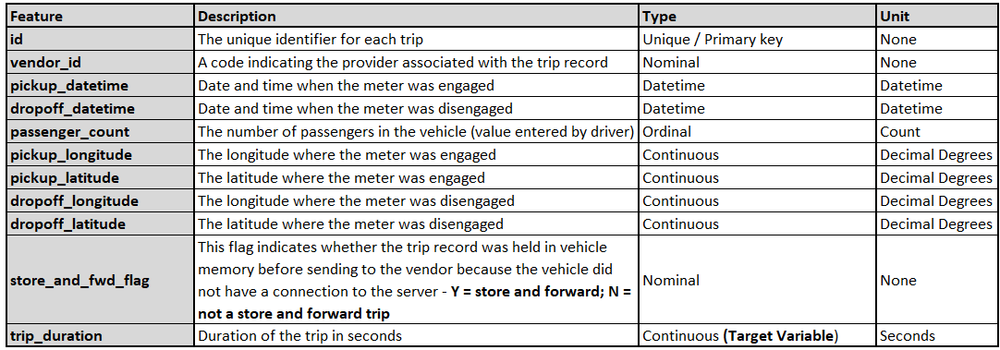



### Check Unique Values for each variable.

In [ ]:
# Check Unique Values for each variable.
categ_vars = ['vendor_id', 'passenger_count', 'store_and_fwd_flag']
cont_vars = ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude']

In [ ]:
# Check Unique Values for categorical variables
for var in categ_vars:
  print(f'Unique values in {var} are: {sorted(df[var].unique())})')

Unique values in vendor_id are: [1, 2])
Unique values in passenger_count are: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9])
Unique values in store_and_fwd_flag are: ['N', 'Y'])


In [ ]:
# Checking the temporal limits of the dataset
print(f"Lower limit - {df['pickup_datetime'].min()}\nUpper limit - {df['pickup_datetime'].max()}")

Lower limit - 2016-01-01 00:00:17
Upper limit - 2016-06-30 23:59:39


It is observed that,
*   **vendor_id** is a nominal binary variable and contains two values - 1 and 2
*   **passenger_count** is an ordinal variable and has 10 integer values ranging from 0 to 9.
*   **store_and_fwd_flag** is a nominal binary variable with the values 'No' and 'Yes'
*   The dataset ranges from 1st of January till 30th of June of the year 2016

## **3. Data Wrangling**

### Data Wrangling Code

In [ ]:
# Creating a copy of the dataframe for analysis and visualization
dfw = df.copy()

The following manipulations are performed on the dataset to ready it for analysis:
* Extracting useful temporal data from the datetime features
* Extracting the rough distance between the pickup and dropoff coordinates
* Specifying whether the given day is a holiday in NYC
* Specifying if there was presence of extreme weather conditions in NYC on a given day

The data for weather events is taken from [National Weather Service](https://www.weather.gov/okx/stormevents)

In [ ]:
# Extracting useful data from datetime format for analysis
dfw['month'] = dfw['pickup_datetime'].dt.month_name()
dfw['day_of_week'] = dfw['pickup_datetime'].dt.strftime('%A')
dfw['day_of_month'] = dfw['pickup_datetime'].dt.day
dfw['hour_of_day'] = dfw['pickup_datetime'].dt.hour

In [ ]:
# Computing the haversine distance in kilometers between pickup and dropoff coordinates

!pip install haversine
from haversine import haversine

def compute_distance(row):
    p_coords = (row['pickup_latitude'], row['pickup_longitude'])
    d_coords = (row['dropoff_latitude'], row['dropoff_longitude'])
    return haversine(p_coords, d_coords)

dfw['distance'] = dfw.apply(lambda x: compute_distance(x), axis = 1)

In [ ]:
# Specifying whether a given day is a holiday
!pip install holidays
import holidays

nyc_holidays = holidays.UnitedStates(state = 'NY', years = [2016])
dfw['holiday'] = dfw['pickup_datetime'].dt.date.isin(nyc_holidays).map({True : 'Yes', False : 'No'})

In [ ]:
# Specifying whether a given day had extreme weather conditions

dates = ['0110', '0113', '0117', '0123',
        '0205', '0208', '0215', '0216',
        '0224', '0225', '0314', '0315',
        '0328', '0329', '0403', '0404',
        '0530', '0628'] # Since dataset ranged from 1st January to 30th June

weather_event = ['2016' + x for x in dates]
weather_event = pd.Series(pd.to_datetime(weather_event, format = '%Y%m%d')).dt.date

dfw['extreme_weather'] = dfw['pickup_datetime'].dt.date.isin(weather_event).map({True : 'Yes', False : 'No'})

In [ ]:
# Dataset head
dfw.head()

,id,vendor_id,pickup_datetime,dropoff_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,month,day_of_week,day_of_month,hour_of_day,distance,holiday,extreme_weather
0,id2875421,2,2016-03-14 17:24:55,2016-03-14 17:32:30,1,-73.982155,40.767937,-73.964630,40.765602,N,455,March,Monday,14,17,1.498523,No,Yes
1,id2377394,1,2016-06-12 00:43:35,2016-06-12 00:54:38,1,-73.980415,40.738564,-73.999481,40.731152,N,663,June,Sunday,12,0,1.805510,No,No
2,id3858529,2,2016-01-19 11:35:24,2016-01-19 12:10:48,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,January,Tuesday,19,11,6.385107,No,No
3,id3504673,2,2016-04-06 19:32:31,2016-04-06 19:39:40,1,-74.010040,40.719971,-74.012268,40.706718,N,429,April,Wednesday,6,19,1.485500,No,No
4,id2181028,2,2016-03-26 13:30:55,2016-03-26 13:38:10,1,-73.973053,40.793209,-73.972923,40.782520,N,435,March,Saturday,26,13,1.188590,No,No


## **4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables**

This section comprises of both Data Wrangling and Data Visualization for a thorough exploration of the dataset. Each variable in the dataset is explored through various manipulations to better understand the relationships between them. Specifically, the charts explored are:

1. Distribution of the dependent variable (**trip_duration**)
2. Distribution of the non-temporal discrete independent variable
3. Distribution of the temporal discrete independent variables
4. Relationship between the discrete variables and the dependent variable
5. Distribution of the continuous independent variables
6. Visualizing the pickup and dropoff locations on a map of NYC
7. Relationship between the continuous independent variables and the dependent variable
8. Correlation Heatmap

#### Chart - 1 - Distribution of the dependent variable

In [ ]:
# Setting default theme for Seaborn visualisation
sns.set()

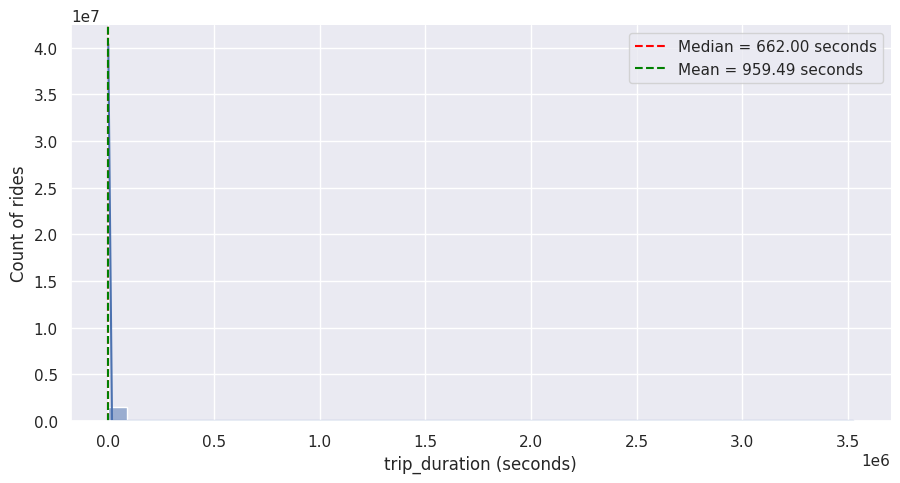

In [ ]:
# Function for Plotting the continuous variable distribution along with their median and mean
def displot_with_median(dataset, variable, median = False, mean = False, unit = None):
  '''A displot with median and mean and the appropriate units (if any) as the inputs'''
  sns.displot(dataset[variable], height = 5, aspect = 11/6, bins = 40, kde = True)
  if median == True:
    plt.axvline(dataset[variable].median(), color = 'red', linestyle = '--', label = f'Median = {dataset[variable].median():.2f} {unit}')
  if mean == True:
    plt.axvline(dataset[variable].mean(), color = 'green', linestyle = '--', label = f'Mean = {dataset[variable].mean():.2f} {unit}')
  plt.ylabel('Count of rides')
  plt.xlabel(variable + f' ({unit})')
  plt.legend()
  plt.show()

displot_with_median(dfw, 'trip_duration', median = True, mean = True, unit = 'seconds')

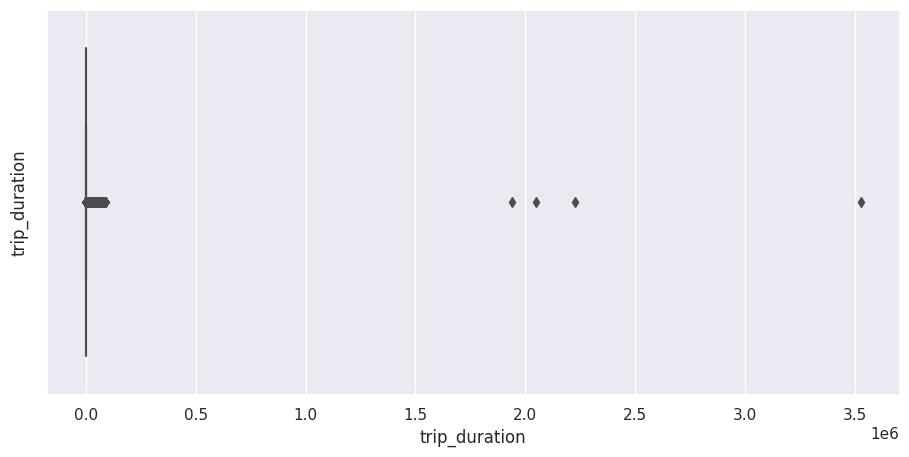

In [ ]:
# Plotting a boxplot to check the values of the outliers
plt.figure(figsize = (11, 5))
sns.boxplot(data = dfw, x = 'trip_duration')
plt.ylabel('trip_duration')
plt.show()

As it can be observed, the dependent variable **trip_duration** contains outliers with very high values. So, analysis will also be done on values within the inlier region, i.e., a max value of **trip_duration** equaling (1.5 * interquartile range) added to the 75th percentile.

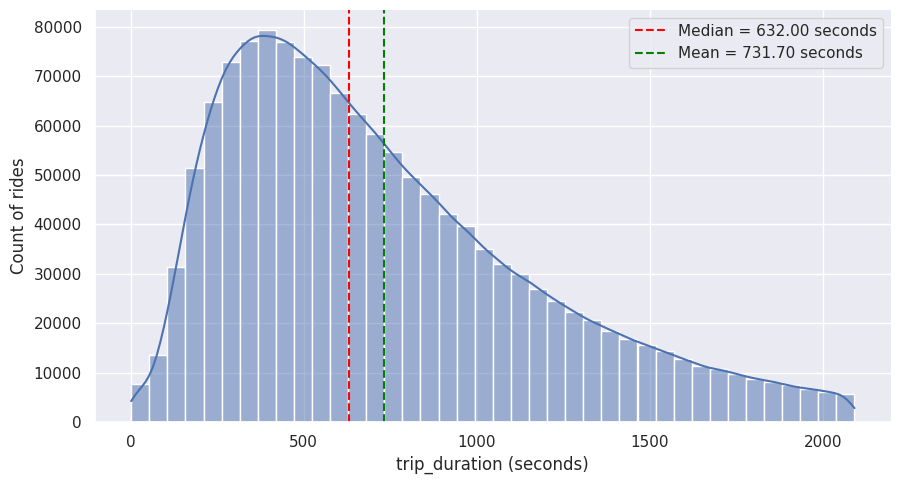

In [ ]:
# Removing the outliers of trip_duration
td_iqr = dfw['trip_duration'].quantile(0.75) - dfw['trip_duration'].quantile(0.25)
td_max = dfw['trip_duration'].quantile(0.75) + 1.5 * td_iqr
dfw_inlier = dfw[dfw['trip_duration'] <= td_max]

displot_with_median(dfw_inlier, 'trip_duration', median = True, mean = True, unit = 'seconds')

##### 1. Why did you pick the specific chart?

*    The distplot is useful for visualization of continuous variables because it provides a visual representation of the distribution of values in the variable across the dataset. This allows one to understand how the data is distributed, such as whether it follows a normal distribution, is skewed to the left or right, or has multiple peaks.
*   The box-plot, on the other hand, helps to identify the presence and values of the outliers and anomalies in the data, which can be further investigated and addressed as needed.

##### 2. What is/are the insight(s) found from the chart?

*   From the above distribution, it can be observed that **trip_duration** contains outliers of very high value, with value as high 30,00,000 seconds (close to 850 hours or 35 days). Such high values are unreasonable, and the distance for these trip ids need to be checked for validity.
*   No siginificant change in the median of **trip_duration** can be observed upon change of the feature's range and removing the outliers (only by ~30seconds or half a minute)
*   The distribution of this feature after removing outliers is **right-skewed**. But since the requirement of some ML models is a normal distribution of the residuals (which is assured by the **normal distribution of the features**), this distribution should be transformed to resemble a normal distribution.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

*   Regardless of the validity of the outliers, they could cause lot of noise to the prediction models, and hence is better that they be avoided. The values of **trip_duration** should be kept within a reasonable range for better prediction power, since outlier prediction is not an important factor of consideration in this project.

#### Chart - 2 - Distribution of the non-temporal discrete independent variables

In [ ]:
# Defining a function to annotate the data values in the graph
def display_vals(axis, round_ = 2):
  '''Displays the data value on the chart'''
  for p in axis.patches:
   axis.annotate(str(round(p.get_height(), round_)), (p.get_x() + p.get_width() / 2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')

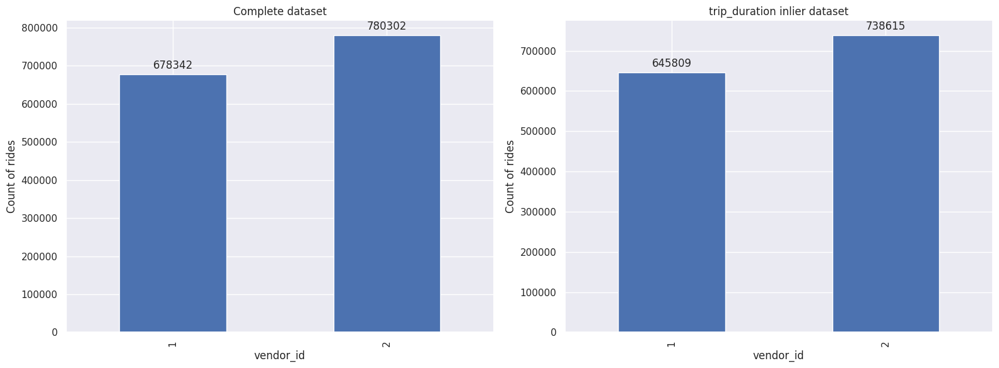

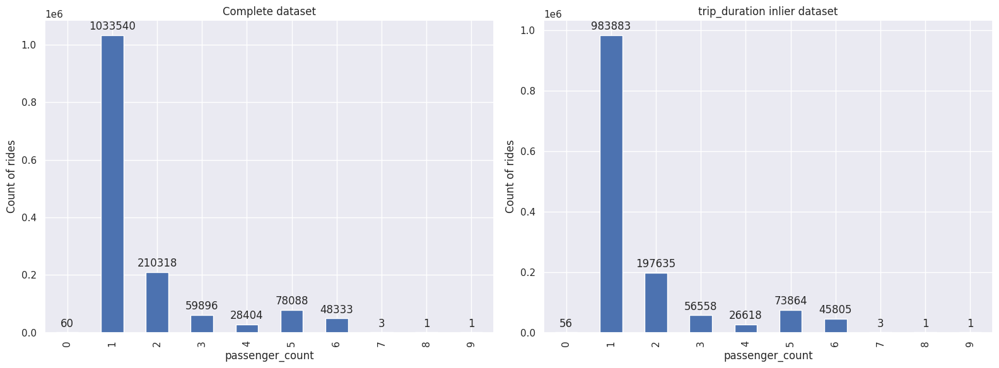

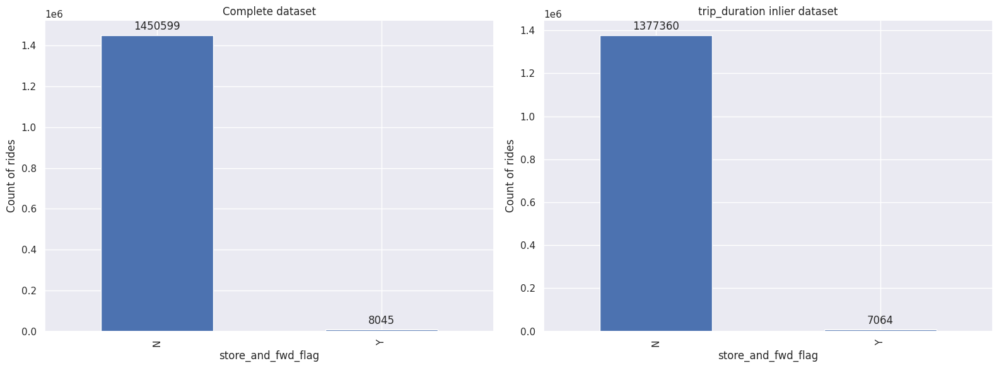

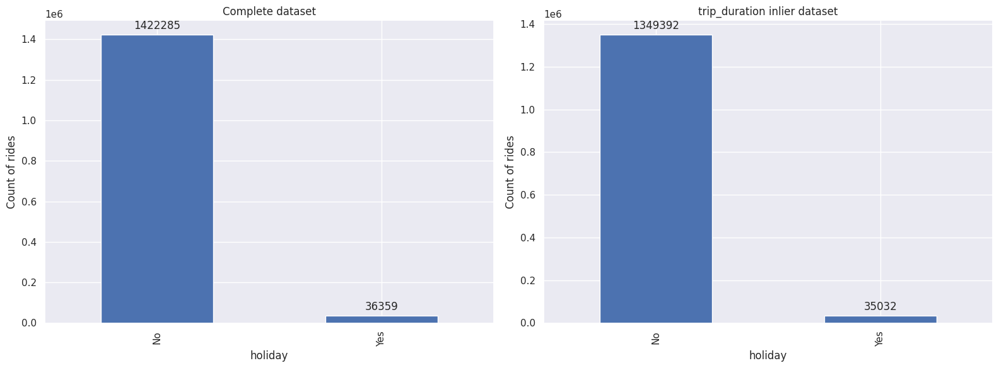

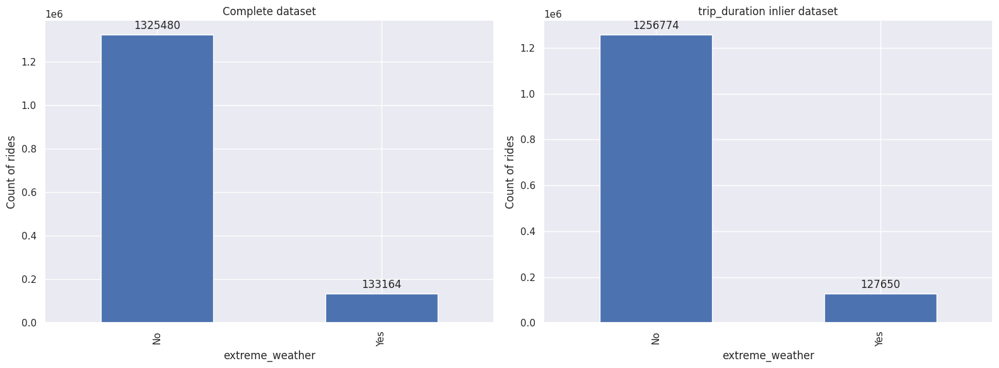

In [ ]:
# Plotting the count of rides of various classes of categorical variables

for var in (categ_vars + ['holiday', 'extreme_weather']):
  fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (16, 6))
  dfw[var].value_counts().sort_index().plot(kind = 'bar', ax = ax[0])
  dfw_inlier[var].value_counts().sort_index().plot(kind = 'bar', ax = ax[1])

  for i, d in enumerate(['Complete dataset', 'trip_duration inlier dataset']):
    ax[i].set(ylabel = 'Count of rides', xlabel = var, title = d)
    if var not in ['day_of_month', 'hour_of_day']:
      display_vals(ax[i])
  plt.tight_layout()

##### 1. Why did you pick the specific chart?

Barplots are useful to understand discrete variables since they help to visualize the frequency or proportion of each category in the variable occuring in the dataset. These plots also help to identify any imbalances or patterns in the data and for comparing these across different groups or subgroups in the dataset.

##### 2. What is/are the insight(s) found from the chart?

*   Both the complete dataset and the dataset with no outliers of trip_duration have a similar distribution for all these discrete features.
*   More than half of the rides are from **vendor 2**
*   Highest number of rides are from **single passengers**. However, **faulty data also exists**, with zero passengers and some as high as 7, 8 and 9. These need to be removed if this feature is to be chosen for model fitting.
*   Only ~**0.5%** of the rides' data were **stored and forwarded later**, while most of the rides had their data recorded in time - indicating a very high class imbalance in this feature.  
*   About **2.5%** of taxi trips happened during the days which were holidays in NYC
*   About **9.1%** of taxi trips happened during days of extreme weather conditions in NYC

#### Chart - 3 - Distribution of the temporal discrete independent variables

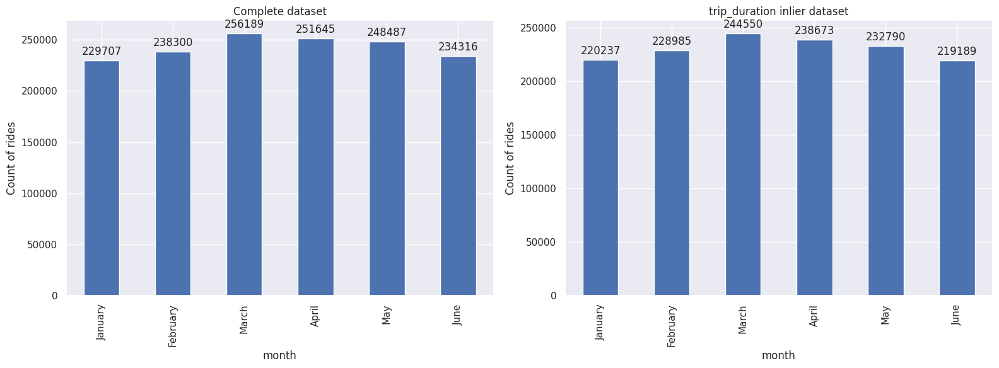

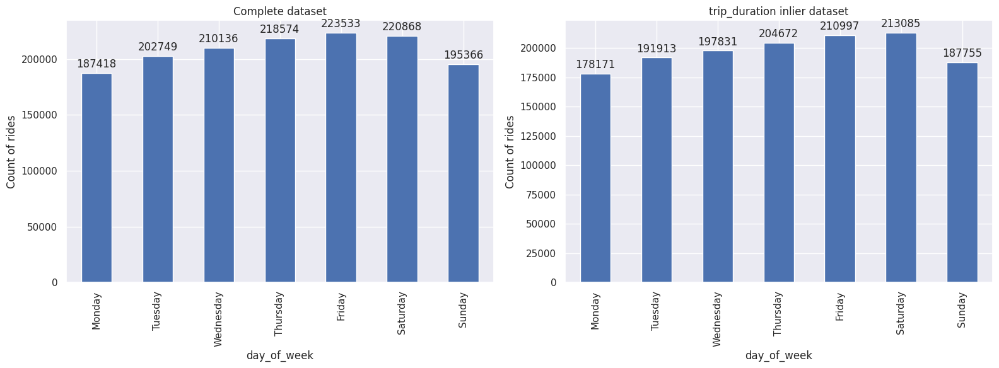

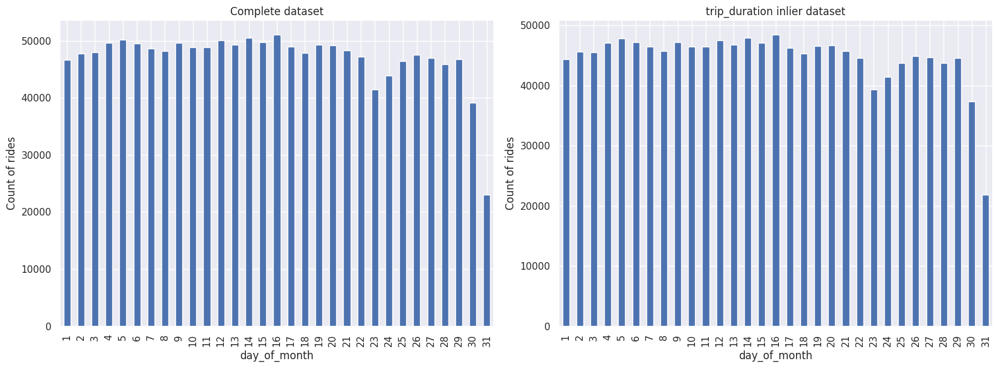

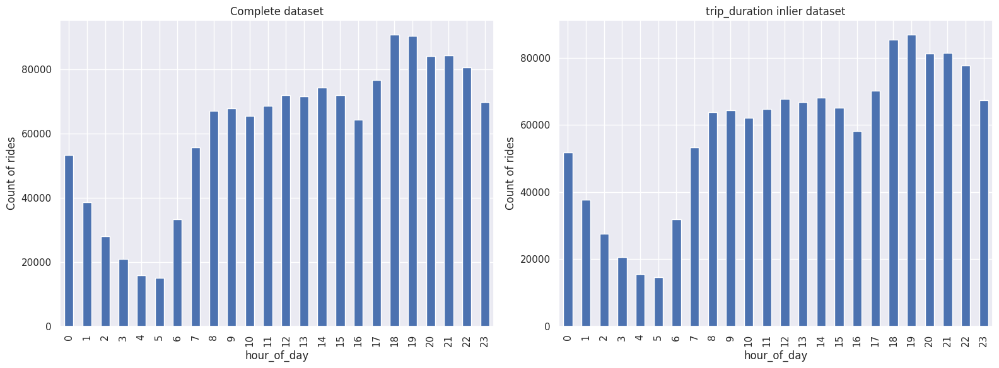

In [ ]:
# Plotting the count of rides of various classes of categorical variables

for var in ['month', 'day_of_week', 'day_of_month', 'hour_of_day']:
  fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (16, 6))
  # Arranging month and days of the week according to calendar
  if var == 'month':
    dfw[var].value_counts().sort_index(key = lambda x: pd.to_datetime(x, format='%B').month).plot(kind = 'bar', ax = ax[0])
    dfw_inlier[var].value_counts().sort_index(key = lambda x: pd.to_datetime(x, format='%B').month).plot(kind = 'bar', ax = ax[1])
  elif var == 'day_of_week':
    days = ['Mon', 'Tues', 'Wednes', 'Thurs', 'Fri', 'Satur', 'Sun']
    dfw[var].value_counts().reindex([(x + 'day') for x in days]).plot(kind = 'bar', ax = ax[0])
    dfw_inlier[var].value_counts().reindex([(x + 'day') for x in days]).plot(kind = 'bar', ax = ax[1])
  else:
    dfw[var].value_counts().sort_index().plot(kind = 'bar', ax = ax[0])
    dfw_inlier[var].value_counts().sort_index().plot(kind = 'bar', ax = ax[1])
  for i, d in enumerate(['Complete dataset', 'trip_duration inlier dataset']):
    ax[i].set(ylabel = 'Count of rides', xlabel = var, title = d)
    if var not in ['day_of_month', 'hour_of_day']:
      display_vals(ax[i])
  plt.tight_layout()

##### 1. Why did you pick the specific chart?

Similar to Chart 2, barplots are used here since discrete variables are being plot.

##### 2. What is/are the insight(s) found from the chart?

Both the complete dataset and the dataset with no outliers of trip_duration have a similar distribution for all these discrete features.

Regarding the distribution of each of the temporal features:
1. **Months of the year**
  *  It is observed that the maximum number of rides occured in the month of March followed by the successive months of April and May. January and February had a relatively lesser count of rides.
  *  This could be because of a lot of reasons. March through June is considered the tourist season in NYC (of the first half of the year). With more favourable weather (since March falls between the transition between winter and spring), and many significant festivities such as St. Patrick's Day and Easter, increased domestic and international visits to NYC could lead to increased usage of taxi services.
  *  This is also reflected in the high median air-fare rates in these months of the year 2016. ([source](https://www.statista.com/statistics/411249/monthly-airfare-to-new-york-city/))
2. **Days of the week**
  *   It is observed that Friday has the maximum nunber of taxi trips followed by Saturday, and Sunday had the least amount of rides.
  *   This pattern is expected, since Friday is usually considered the end of the work-week, and Friday and Saturday nights are busiest in NYC for socialising, going out to restaurants, bars and clubs.
  *   On Sundays, however, people tend to stay back at home and and have more relaxed schedules to rest from their work schedules during the weekdays.
3. **Days of the month**
  *   It is observed that the number of taxi trips is relatively the same across the days of a given month, but a slight reduction in taxi trips can be seen in the final week of the month.
  *   This may seem counter-intuitive at first. But most people follow monthly budget and expenditure plans, and towards the end of the month they would have expended a significant portion of their budget till their payday arrives towards the end of the month.
  *   The 31st has the lowest number of rides as some months do not have the 31st as per the calendar.
4. **Hours of the day**
  *   Highest nunber of taxi trips is observed during the evening to night of any given day. Least number of rides is observed late into the night till early morning, after which number of rides increases and becomes constant till evening.
  *   Evening is the end of the usual 9-5 work-time and hence the high number of taxi trips. Also, most socialising and partying starts from evening and till late night. Hence, the high number of taxi rides from 6pm till late night.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

*   Understanding the temporal factors which influence taxi trip duration is very important. Here, the temporal features extracted from the datetime stamps have all been proved to be necessary factors to people choosing to commute. Some features, like minutes of the day, would have been redundant information.

#### Chart - 4 - Relationship between the discrete variables and the dependent variable

In the previous two Charts, the distribution of the discrete variables were plot. This chart is a natural extension of the same; to visualize the distribution of **trip_duration** for each of the classes of the same discrete variables.

Since the main dataset contains outliers with very high value, it will be fuitle to visualize it. Hence, the dataset where **trip_duration has no outliers** is chosen.

In [ ]:
# Defining a function for categorical plot with median
def catplot_with_median(dataset, variable, legend, median = False, unit = None, kind_ = 'violin', aspect_ = 11):
  ''' Returns a categorical plot with median. Inputs: Dataframe dataset, continuous variable to plot,
  the discrete variable to legend on, median (True/False), unit, type of plot and the aspect parameter'''

  sns.catplot(data = dataset, x = legend, y = variable, height = 5, aspect = aspect_/6, kind = kind_)
  plt.ylabel(variable + f' ({unit})')
  if median == True:
    colour = ['green', 'red', 'yellow', 'pink']
    i = 0
    for value in dataset.dropna()[legend].unique():
      plt.axhline(dataset[dataset[legend] == value][variable].median(), color = colour[i], linestyle = '--', label = f"Median ({legend} = {value}) = {dataset[dataset[legend] == value][variable].median():.2f} {unit}")
      i+=1
    plt.legend(bbox_to_anchor=(1, 0.54))
  plt.show()

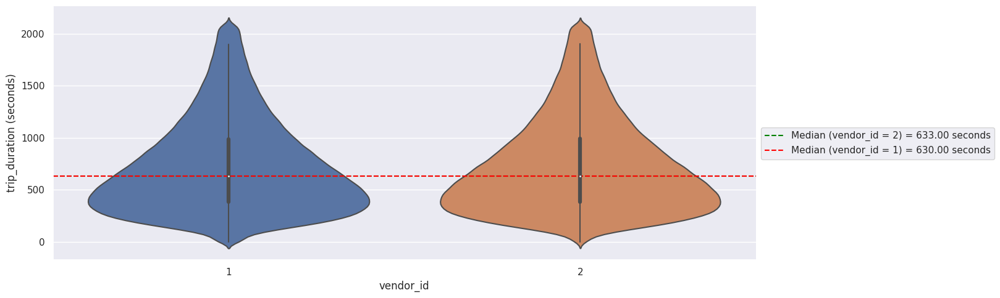

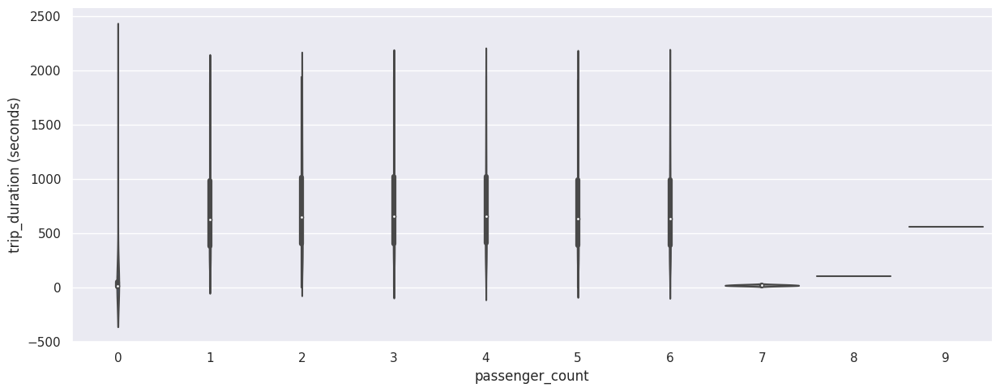

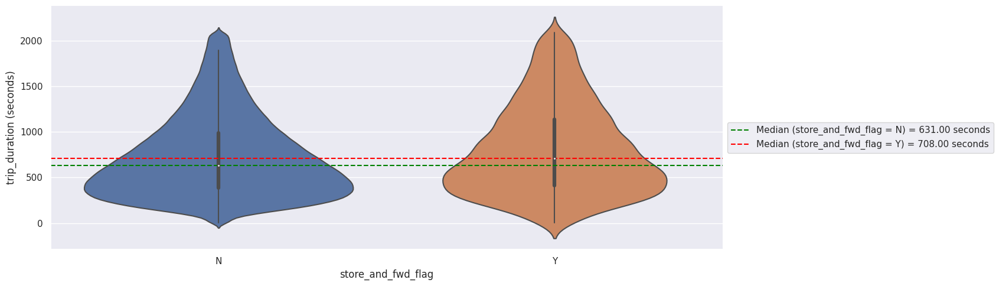

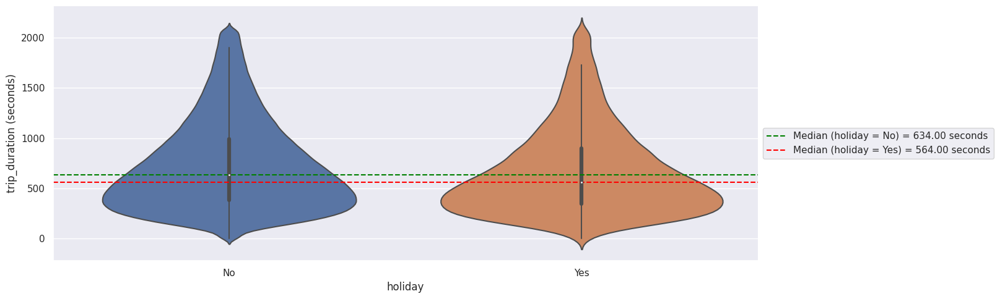

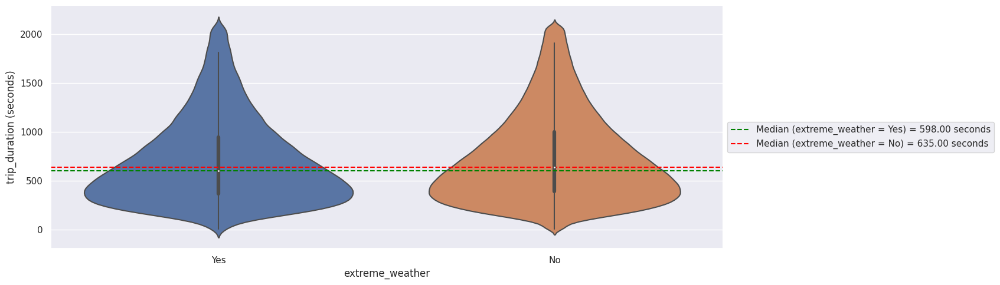

In [ ]:
# Violing plot for non-temporal variables
for var in (categ_vars + ['holiday', 'extreme_weather']):
  med_bool = True
  if var in ['passenger_count']:
    med_bool = False
  catplot_with_median(dataset = dfw_inlier, variable = 'trip_duration', legend = var, unit = 'seconds', median = med_bool, kind_ = 'violin', aspect_ = 15)

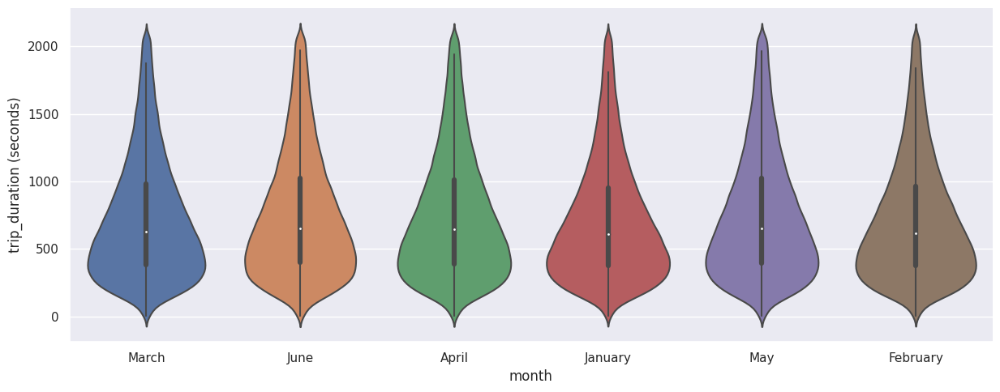

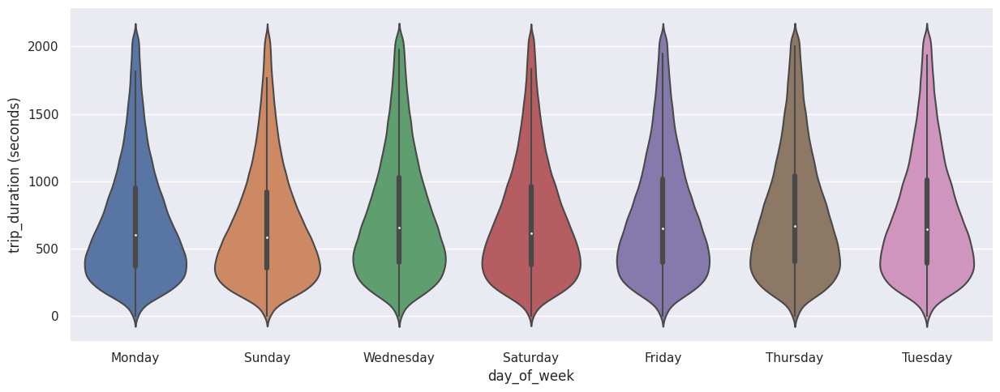

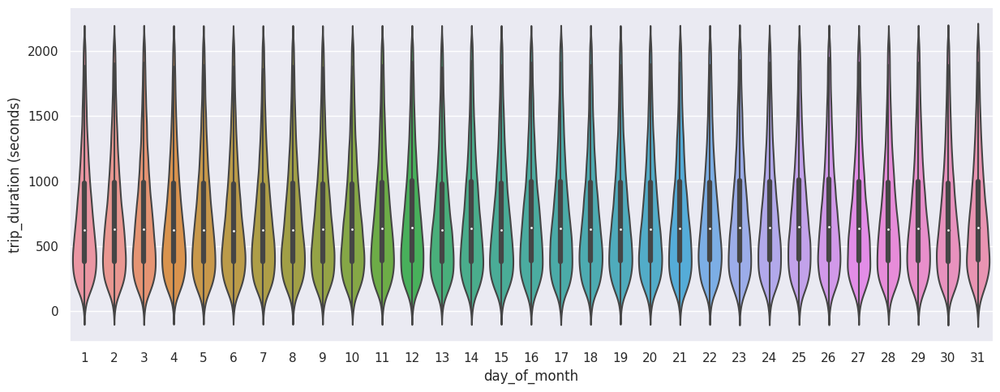

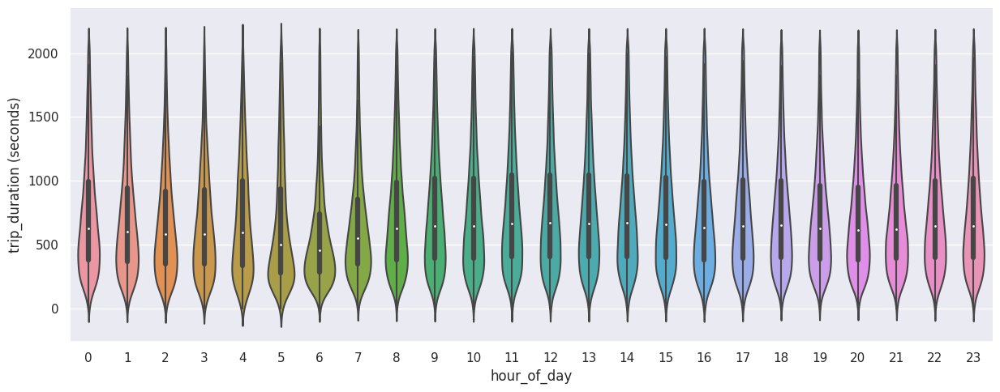

In [ ]:
# Violing plot for temporal variables
for var in ['month', 'day_of_week', 'day_of_month', 'hour_of_day']:
  catplot_with_median(dataset = dfw_inlier, variable = 'trip_duration', legend = var, unit = 'seconds', kind_ = 'violin', aspect_ = 15)

##### 1. Why did you pick the specific chart?

A **violin plot** is typically used in bivariate analysis for visualizing the relationship between a continuous variable and a categorical variable. It helps to effectively visualise the distribution of a continuous variable across the different categories of a categorical variable. A violin plot combines the features of box and kernel density plots in that the width of the violin at a particular point represents the density or frequency of the data at that point, while the height represents the range of values for the data.

##### 2. What is/are the insight(s) found from the chart?

**Among the non-temporal variables:**
*   The distribution of **trip_duration** for both the **vendors** are relatively the same, with very similar medians.
*   The distribution is again very similar for each class of **passenger_count** feature. The categories of 0, 7, 8 and 9 were already deemed to be with faulty data in the section of Chart - 2.
*   The median of **trip_duration** is slightly higher (by about 22 seconds) when the trip record is **stored and forwarded later**. One reason could be the delay in the taxi-driver's recording. But at the same time, there is no sufficient data enough to conclude anything from this (the category only has 0.5% of the dataset).
*   It is also observed that the median is slightly lesser for the days when it is a **holiday** or when there is presence of **extreme weather**. This is counter-intuitive. The reasons could be:
  *   Holidays and extreme weather conditions can affect people's travel behavior. For example, on holidays, there may be fewer commuters and more people staying home. Similarly, during extreme weather events, people may choose to avoid unnecessary travel or opt for alternative transportation modes. These reasons will lead to less congestion which can reduce overall trip durations.
*   But the reduction in the median in case of **extreme_weather** is significantly lesser (only about half a minute) compared to the day being a **holiday** (more than 1 minute)

**Among the temporal variables**:
*   The distribution of **trip_duration** is relatively the same, with similar medians, for each **month of the year**, **days of the month** and **days of the week**.
*   The distribution varies when it comes to **hours of the day**. It can be seen that the median is considerably lower at early morning and post-midnight hours compared to morning and evening hours. This is because of the relatively lesser traffic in these hours.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

*   Logically, **passenger_count** does not have an effect on the duration of a taxi trip. This can also be observed in the dataset where distributions are almost the same for each count of passener.
*   Also, the distribution and median of **extreme_weather** and **store_and_fwd_flag** are very similar with little difference to each other. Add to this fact, the categorical distribution of both are extremely imbalanced.

The above points should be taken into account for the choice of the 3 variables in Maching Learning prediction modeling. (**Read more in the [Feature Selection](#scrollTo=9QJ7c8kij3cY&line=5&uniqifier=1) section**)

*   Regarding the temporal features extracted from the dataset; they are useful factors for a better prediction of trip duration. Also, **holidays** definitely have an effect in the duration of a trip, and their effect could be analysed.

#### Chart - 5 - Distribution of the continuous independent variables

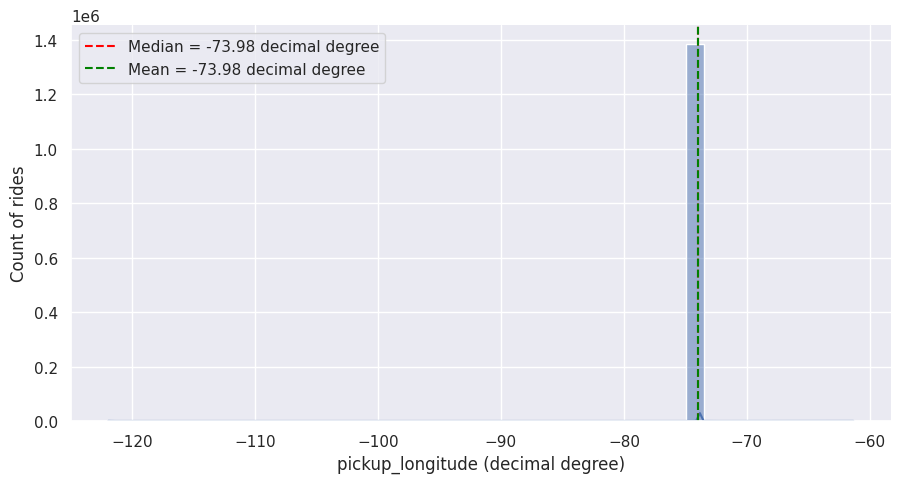

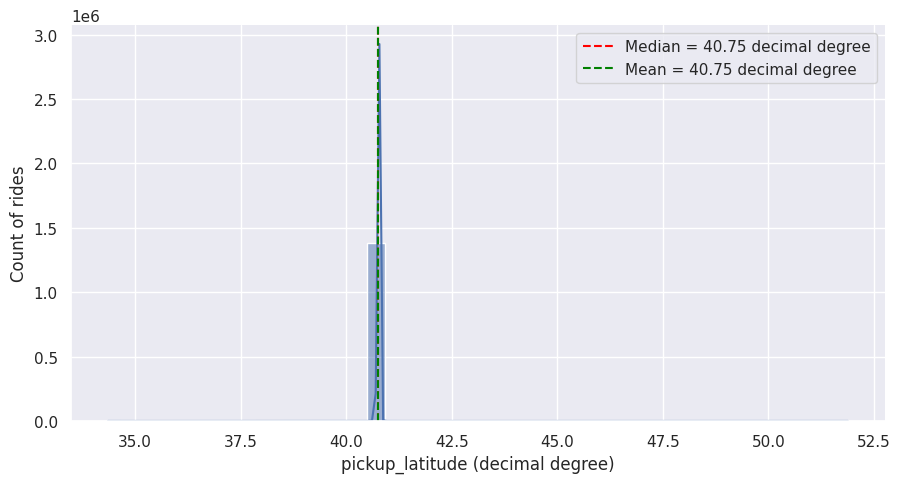

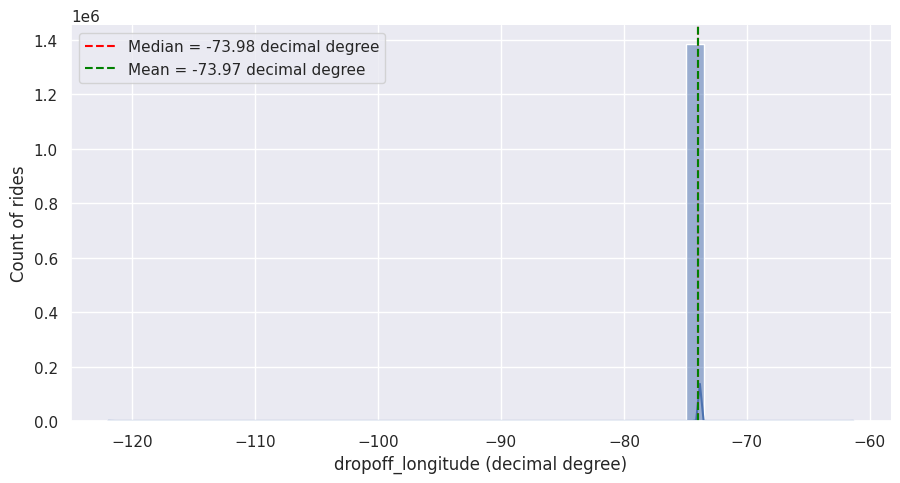

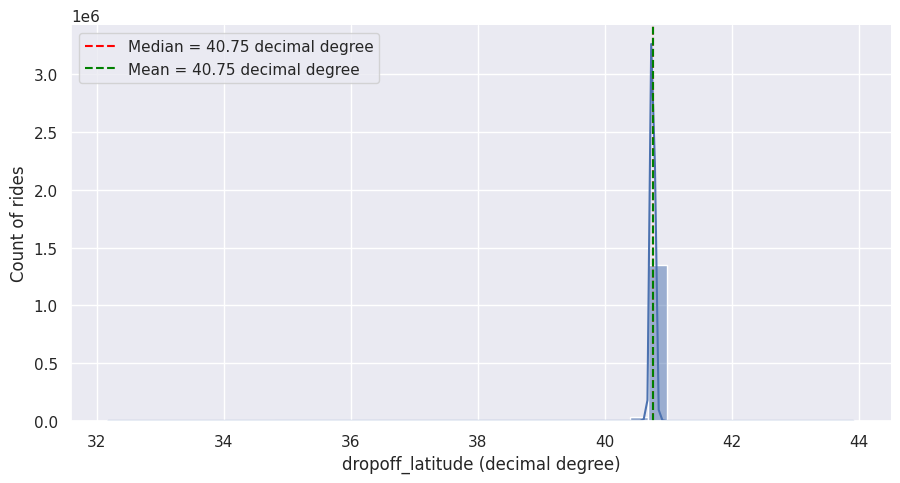

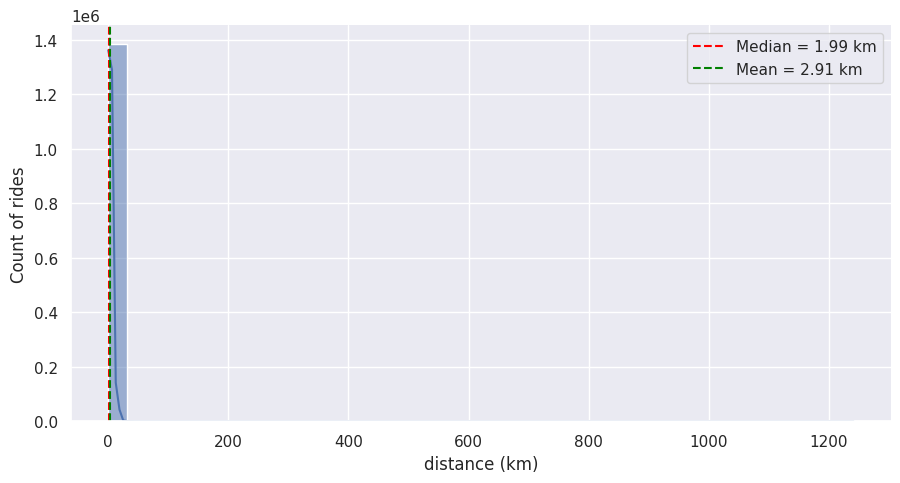

In [ ]:
# Plotting displot of continuous variables
for var in (cont_vars + ['distance']):
  unit_ = "km" if var == 'distance' else "decimal degree"
  displot_with_median(dfw_inlier, var, median = True, mean = True, unit = unit_)

##### 1. Why did you pick the specific chart?

Similar to displot chosen for Chart - 1, which is ideal for visualizing continuous features

##### 2. What is/are the insight(s) found from the chart?

*   The mean latitude and longitude of Newyork City is (40.730610, -73.935242) respectively. It can be observed that there exists pickup and dropoff locations which are way afar from NYC.
*   This is also reflected in the fact that there's trip distances as high as 1000kms which is unreasonable.
*   These locations will be first visualized in a map in the next Chart, so that these outliers can be dealt with.

#### Chart - 6 - Visualizing the pickup and dropoff locations on a map of NYC


##### Visualizing pickup and dropoff points using Geopandas

In [ ]:
# Installing and importing libraries for map-plotting
!pip install geopandas matplotlib descartes --quiet
!pip install cartopy --quiet

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 10.9/10.9 MB 69.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.5/46.5 kB 4.2 MB/s eta 0:00:00


In [ ]:
import geopandas as gpd
from cartopy import crs as ccrs

In [ ]:
def get_coordinates(row):
  '''Returns pickup and dropoff coordinates of any particular row from the dataset
  Exception handling for when multiple rows are passed through iterrows() instead of a single row'''
  try:
    pickup = (row['pickup_latitude'].values[0], row['pickup_longitude'].values[0])
    dropoff = (row['dropoff_latitude'].values[0], row['dropoff_longitude'].values[0])
  except AttributeError: # to handle error when iterrows is passed instead of single row
    pickup = (row['pickup_latitude'], row['pickup_longitude'])
    dropoff = (row['dropoff_latitude'], row['dropoff_longitude'])
  return pickup, dropoff

def get_scale(axi):
  '''Returns the scale of the x/y axis of latitude and longitudes for a geopandas axes'''
  lon_min, lon_max = axi.get_xlim()
  lat_min, lat_max = axi.get_ylim()
  axi.set_xlabel(f'{round(haversine((lat_min, lon_min), (lat_min, lon_max)), 2)}km')
  axi.set_ylabel(f'{round(haversine((lat_min, lon_min), (lat_max, lon_min)), 2)}km')

def plot_shapefile(shapef, data, legend_ = False, scale_ = False):
  '''Plots a shapefile for a given dataset with pickup and dropoff coordinates
  Inputs are the shapefile, dataset, legend (boolean) and scale (boolean)'''
  fig, ax = plt.subplots(figsize=(13, 8))
  shapef.plot(ax = ax, facecolor = 'silver', edgecolor = 'black', alpha = 0.7)
  ax.set_title('NYC map')

  # Plotting the pickup and dropoff coordinates with different colours
  for index, row in data.iterrows():
    pick_drop_coords = get_coordinates(row)
    location = []
    for lat, lon in pick_drop_coords:
      location.append(gpd.GeoDataFrame({'geometry': [Point(lon, lat)]}, crs='EPSG:4326'))
    location[0].plot(ax = ax, color = 'lightcoral', markersize = 30)
    location[1].plot(ax = ax, color = 'steelblue', markersize = 30, label = 'Dropoff')

  # Temporary handle creation for legend
  if legend_ == True:
    p_legend = ax.scatter([], [], color='lightcoral', s=30, label = 'Pickup')
    d_legend = ax.scatter([], [], color='steelblue', s=30, label = 'Dropoff')
    labels = ['Pickup', 'Dropoff']
    ax.legend([p_legend, d_legend], labels, bbox_to_anchor = (1, 0.54))

  # Plotting the scale (km) in x and y axes
  if scale_ == True:
    get_scale(ax)

  plt.show()

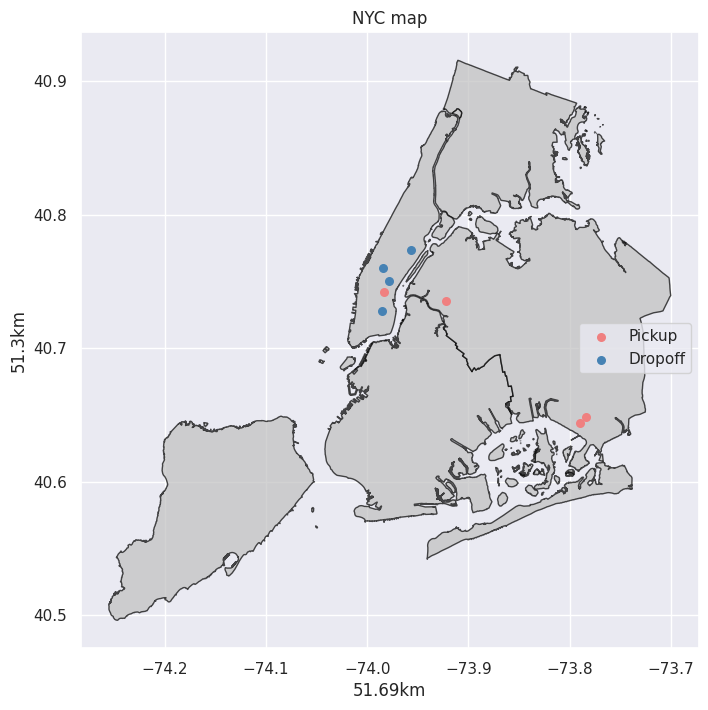

In [ ]:
# Reading and plotting the shapefile
path_sf = '/content/drive/MyDrive/ALMA BETTER/Module 4/#CAPSTONE 1 - REGRESSION/Map_files/'
nyc_sf = gpd.read_file(path_sf + 'geo_export_ba75dc3e-f1f0-47c0-ad14-3f5a4f2d5b96.shp')

# Plotting pickup and dropoff points for trip_duration outliers
plot_shapefile(shapef = nyc_sf, data = dfw[dfw['trip_duration'] > 1.5e6], legend_ = True, scale_ = True)

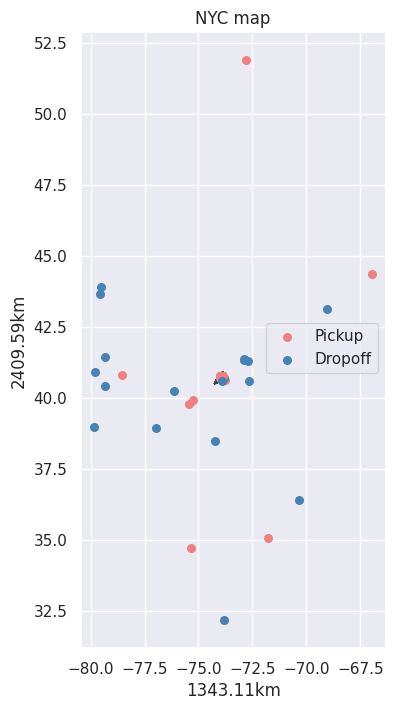

In [ ]:
# Plotting pickup and dropoff points for distance outliers
plot_shapefile(shapef = nyc_sf, data = dfw[dfw['distance'] > 100], legend_ = True, scale_ = True)

##### Setting the latitude and longitude boundaries to contain dataset within NYC using Folium

In [ ]:
# Defining a function to plot using folium and overwrite the pre-existing dosplay with the geoJSON file
def plot_folium(gjson_path, limits = None, coords = None):
  '''Plots an interactive folium map using the geoJSON file. Coordinates of pickupand dropoff
  also plot with red and blue markers respectively. Linear bounds also plot if limits are provided.
  Inputs include the geojson path, limits (longitude, latitude) and coordinates (pickup, dropoff)'''
  # Create a map centered around NYC
  nyc_coordinates = (40.7128, -74.0060)
  nyc_map = folium.Map(location = nyc_coordinates, zoom_start = 10, tiles = None, control_scale = True, prefer_canvas = True, background_color = 'white',
                       scrollWheelZoom = False)

  # Add geoJSON layers for NYC
  state_style = {'fillColor': 'white', 'color': 'black', 'weight': 1, 'fillOpacity': 1}
  folium.GeoJson(gjson_path, style_function = lambda feature: state_style).add_to(nyc_map)

  # Add linear limits
  if limits != None:
    for lat_limits in limits[1]:
      folium.PolyLine(locations=[[lat_limits, limits[0][0]], [lat_limits, limits[0][1]]], color='blue', weight=2).add_to(nyc_map)
    for lon_limits in limits[0]:
      folium.PolyLine(locations=[[limits[1][0], lon_limits], [limits[1][1], lon_limits]], color='blue', weight=2).add_to(nyc_map)

  # Add markers for each coordinate to the map
  if coords != None:
    pickup_coords, drop_coords = coords
    for pick, drop in zip(pickup_coords, drop_coords):
        folium.Marker(location = pick, icon = folium.Icon(color = 'red')).add_to(nyc_map)
        folium.Marker(location = drop, icon = folium.Icon(color = 'blue')).add_to(nyc_map)

  display(nyc_map)

In [ ]:
# Defining the limit coordinates
limits = [[-74.3, -73.65], [40.46, 40.93]]

# Plotting the coordinates for an arbitrary subset of the dataset, with the limits
path_gj = path_sf + 'Borough Boundaries.geojson'
pick_coords, drop_coords = [], []
for index, row in dfw[(dfw['trip_duration'] < 60000) & (dfw['trip_duration'] > 50000)].iterrows():
  pick_cor, drop_cor = get_coordinates(row)
  pick_coords.append(pick_cor)
  drop_coords.append(drop_cor)
plot_folium(path_gj, limits, (pick_coords, drop_coords))

##### 1. Why did you pick the specific chart?

*   **Geopandas** is the go-to tool for visualization of coordinates on a map. It's integration with matplotlib and python, and ability to handle vector-based geospatial formats such as shapefiles make it one of the best methods to visualise maps.
*   **Folium** is utilised for visualizing and setting the boundaries from the dataset to be used for analysis. The linear plot in folium offers a much better visualization and robustness than through matplotlib.
*   For the above plots, NYC shapefile and GeoJSON files were used which can be downloaded from [here](https://data.cityofnewyork.us/City-Government/Borough-Boundaries/tqmj-j8zm)

##### 2. What is/are the insight(s) found from the chart?

*   In the first plot of this Chart, the **outliers of trip_duration** (which were observed in **Chart 1**) were checked. Here, it is found that despite being within the boundaries of NYC, the duration of trip is coming as high as 3 million seconds or 35 days which proves how unreasonable and faulty these values are.
*   In the second plot, the **outliers of distance** are visualised (which were observed in **Chart 5**). All the pickup and dropoff points which had distance of above 100kms were plot in the map. It can be seen that these points lie very far outside the boundaries of NYC.

##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

*   From the plots, it can be concluded that the outliers in **trip_duration** should all be **trimmed off** rather than handling them through **Winsorizing**. Winsorizing may add bias since the actual values of trip_duration is unknown to us. And since the dataset is already huge, trimming these outliers does not have a large effect. (**This is also discussed in the Outlier Handling section of Feature Engineering**)
*   Since the project is about taxi trip duration in NewYork City, it is only logical that the bounds of pickup and dropoff locations be set within the areas near NYC and not those much further off (the effect of trimming out this data will be discussed in the **Outlier Handling** section). This boundary is visualized in the final part of this chart using **folium**.

#### Chart - 7 - Relationship between the continuous independent variables and the dependent variable

<Axes: xlabel='distance (km)', ylabel='trip_duration (seconds)'>

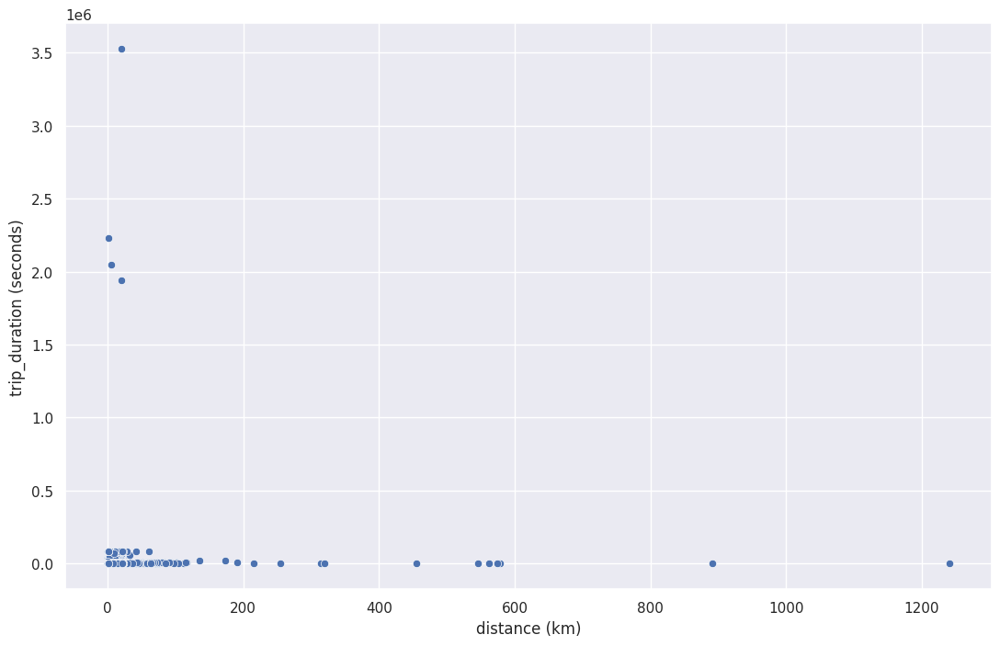

In [ ]:
# Function to plot bivariate scatter plots
def cont_bivar_plot(data, var_x, var_y, unit_x = None, unit_y = None):
  '''Plots bivariate scatter plots with var_x and var_y in x and y axes respectively from the data provided
  Inputs also include the units for var_x and var_y if any'''
  plt.figure(figsize = (13, 8))
  ax = sns.scatterplot(x = var_x, y = var_y, data = data)
  ax.set(xlabel = var_x + f' ({unit_x})', ylabel = var_y + f' ({unit_y})')
  return ax

# Bivariate plot of distance and trip_duration for entire dataset
cont_bivar_plot(dfw, 'distance', 'trip_duration', 'km', 'seconds')

<Axes: xlabel='distance (km)', ylabel='trip_duration (seconds)'>

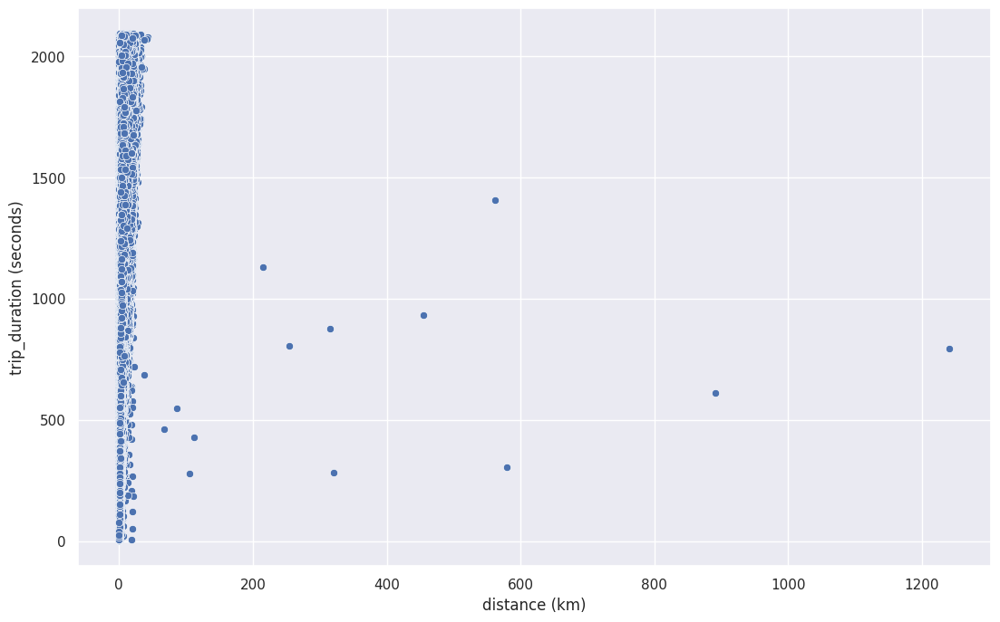

In [ ]:
# Bivariate plot of distance and trip_duration for dataset with no outliers for trip_duration
cont_bivar_plot(dfw_inlier, 'distance', 'trip_duration', 'km', 'seconds')

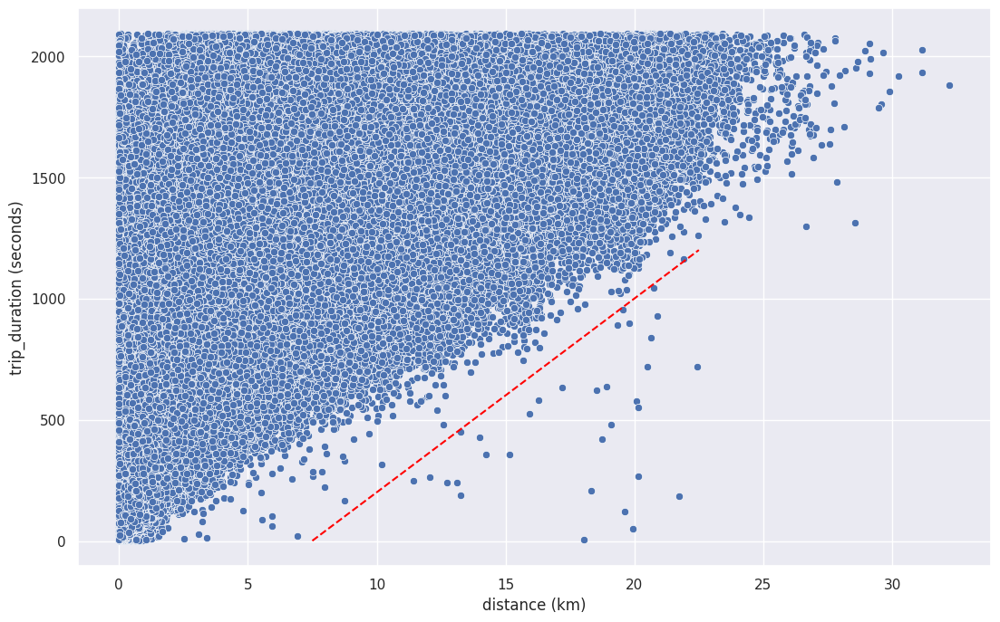

In [ ]:
# Bivariate plot of distance and trip_duration for dataset with no outliers for both
dfw_inlier_nyc = dfw_inlier[
    dfw_inlier['pickup_latitude'].between(40.46, 40.93) &
    dfw_inlier['dropoff_latitude'].between(40.46, 40.93) &
    dfw_inlier['pickup_longitude'].between(-74.3, -73.65) &
    dfw_inlier['dropoff_longitude'].between(-74.3, -73.65)
].copy()

ax = cont_bivar_plot(dfw_inlier_nyc, 'distance', 'trip_duration', 'km', 'seconds')
ax.plot([7.5, 22.5], [1, 1200], color = 'red', linestyle = '--')

##### 1. Why did you pick the specific chart?

**Scatter plots** are widely used in bivariate analysis to visualize the relationship between two continuous variables. It helps identify the patterns and trends between the two variables, as well as the strength of their relationship. These plots also help isolate outliers which may be missed out in univariate analyses.

##### 2. What is/are the insight(s) found from the chart?

*   In the first plot, due to presence of outliers of **trip_duration**, no relationship between the two variables can be seen. Similarly, in the second plot because of the outliers in **distance** variable.
*   As per the discussion in **Chart 1** and **Chart 6** (outliers of **trip_duration** was removed in **Chart 1**, and the dataset was bound within NYC in **Chart 6**), the outliers of **trip_duration** and **distance** were dealt with, which is shown in the 3rd plot of this Chart. In this plot, a solid relationship between **distance** and **trip_duration** is seen.
*   The general trend is that, as the distance increases, the duration of the trip also increases (hence, a positive correlation).
*   The datapoints at the left hand side of the plot (i.e., less **distance** but high **trip_duration**) can be because of high traffic conditions, which made the trip take much longer time despite the distance being small. Also, the **distance** computed here is the shortest distance, which does not take into account the distance by road, which is always higher.
*   The datapoints at the bottom right region of the plot (below the arbitrary red dashed line) indicate less **trip_duration** for high **distances**. While some of them are definitely faulty datapoints, many of them could be explained because of the less traffic conditions or wider road provisions in the route.


##### 3. Will the gained insights help creating a positive business impact?
Are there any insights that lead to negative growth? Justify with specific reason.

*   As per the above observations, there is no need to further clean the datapoints in the third plot. The amount of outliers in it is very small compared to the size of the dataset which comes out to near 1.5 million. Out of these outliers, there's much fewer of them which could potentially be faulty data. Most models can handle this little amount of outliers in the dataset.

#### Chart - 8 - Correlation Heatmap

In [ ]:
# Encoding categorical variables for correlation heatmap visualization
for datas in (dfw, dfw_inlier, dfw_inlier_nyc):
  datas['store_and_fwd_flag'] = datas['store_and_fwd_flag'].map({'N':0, 'Y':1})
  datas['day_of_week'] = datas['pickup_datetime'].dt.weekday
  datas['month'] = datas['pickup_datetime'].dt.month
  datas['holiday'] = datas['holiday'].map({'No':0, 'Yes':1})
  datas['extreme_weather'] = datas['extreme_weather'].map({'No':0, 'Yes':1})

<Axes: >

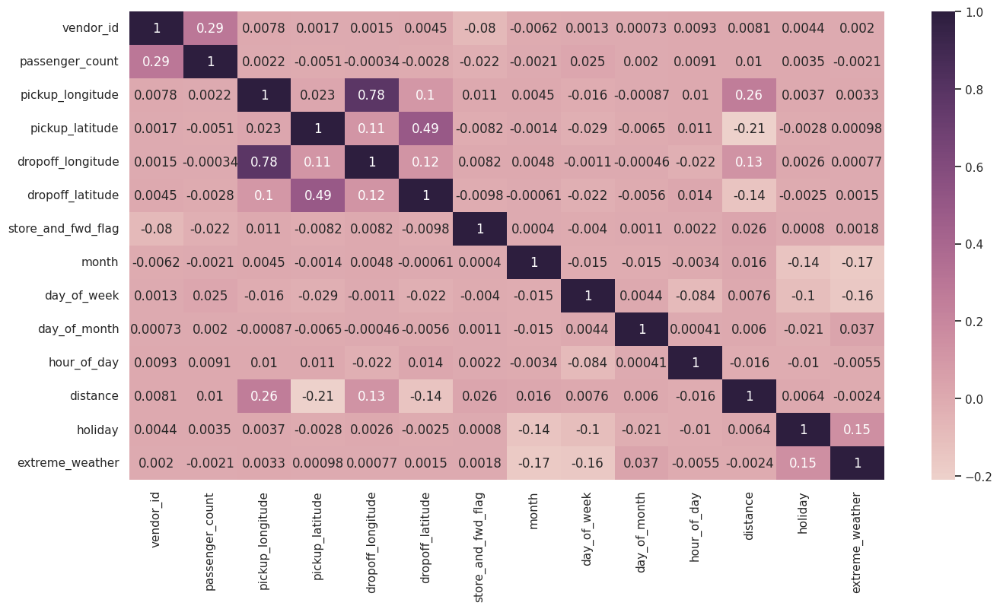

In [ ]:
# Correlation heatmap for dataset with no outliers for entire dataset
plt.figure(figsize = (16, 8))
sns.heatmap(dfw.drop('trip_duration', axis = 1).corr(), annot = True, cmap = sns.cubehelix_palette(as_cmap = True))

<Axes: >

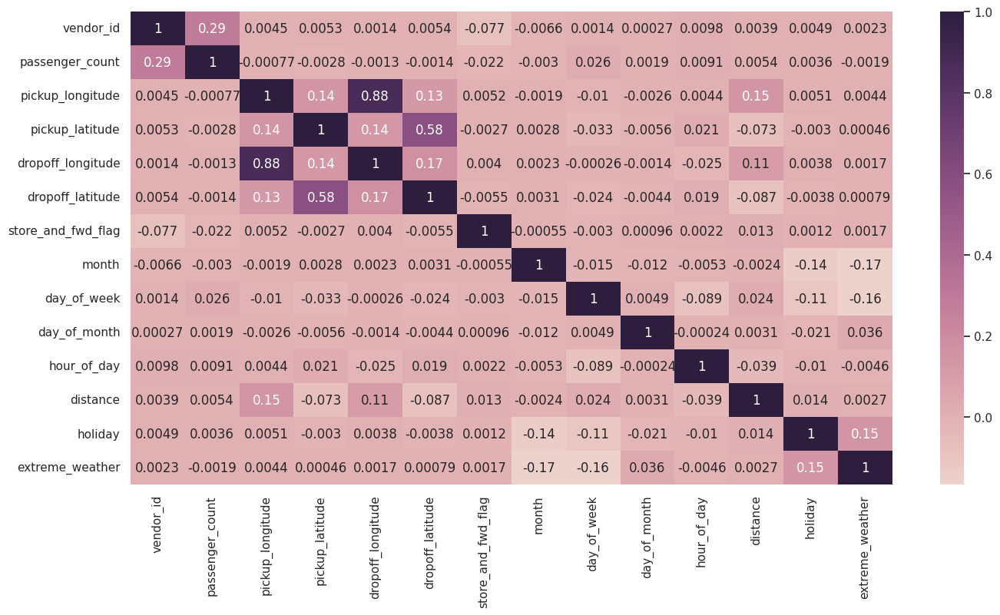

In [ ]:
# Correlation heatmap for dataset with no outliers for trip_duration
plt.figure(figsize = (16, 8))
sns.heatmap(dfw_inlier.drop('trip_duration', axis = 1).corr(), annot = True, cmap = sns.cubehelix_palette(as_cmap = True))

<Axes: >

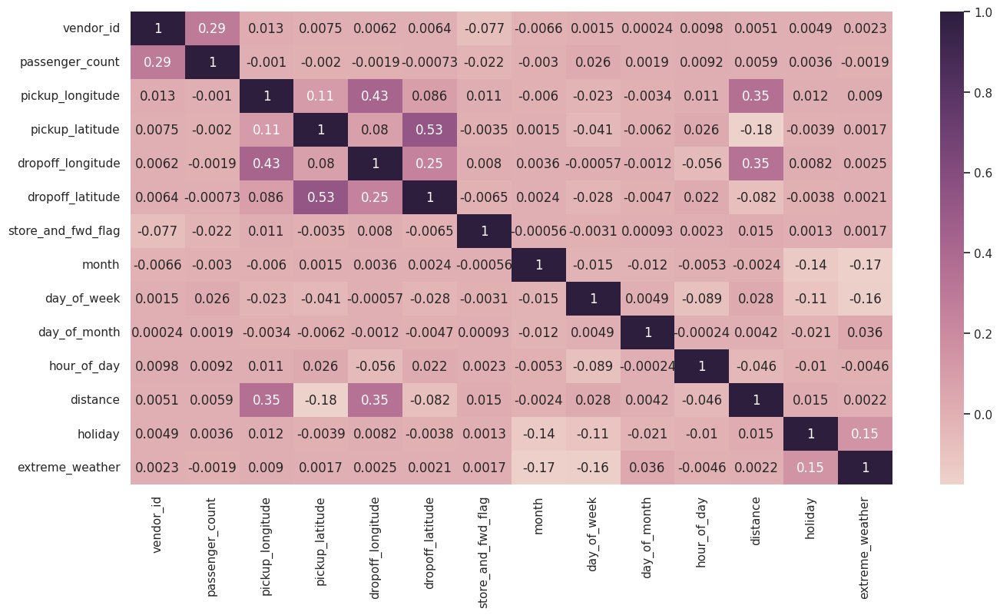

In [ ]:
# Correlation heatmap for dataset with no outliers for trip_duration and distance
plt.figure(figsize = (16, 8))
sns.heatmap(dfw_inlier_nyc.drop('trip_duration', axis = 1).corr(), annot = True, cmap = sns.cubehelix_palette(as_cmap = True))

In [ ]:
def colorise(val, threshold, equality = 'greater', font = None, absolute = False):
  '''Function to conditionally format the fonts for int and float cells in a dataframe:
  Inputs - value to compare, threshold value, equality (greater or lesser), font color and absolute (Boolean)'''

  if not isinstance(val, (int, float)):
    return None
  else:
    if absolute == True:
      val = abs(val)
    if equality == 'lesser':
      threshold*= -1
      val*= -1
    if val > threshold and val != 1:
      return f'color : {font}; font-weight : bold'

In [ ]:
dfw_inlier_nyc.drop('trip_duration', axis = 1).corr().style.applymap(colorise, threshold = 0.5, equality = 'greater', absolute = True, font = 'red')

,vendor_id,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,month,day_of_week,day_of_month,hour_of_day,distance,holiday,extreme_weather
vendor_id,1.000000,0.290480,0.013453,0.007514,0.006184,0.006399,-0.076555,-0.006583,0.001452,0.000244,0.009801,0.005055,0.004872,0.002309
passenger_count,0.290480,1.000000,-0.001031,-0.001972,-0.001894,-0.000726,-0.021861,-0.002978,0.025682,0.001864,0.009151,0.005924,0.003570,-0.001894
pickup_longitude,0.013453,-0.001031,1.000000,0.111039,0.427077,0.085785,0.010877,-0.005953,-0.023277,-0.003418,0.010683,0.352577,0.011598,0.009035
pickup_latitude,0.007514,-0.001972,0.111039,1.000000,0.079706,0.526244,-0.003529,0.001466,-0.041003,-0.006225,0.026276,-0.176280,-0.003856,0.001735
dropoff_longitude,0.006184,-0.001894,0.427077,0.079706,1.000000,0.245406,0.007983,0.003559,-0.000566,-0.001223,-0.056214,0.345210,0.008181,0.002493
dropoff_latitude,0.006399,-0.000726,0.085785,0.526244,0.245406,1.000000,-0.006503,0.002353,-0.027821,-0.004728,0.021812,-0.081986,-0.003763,0.002124
store_and_fwd_flag,-0.076555,-0.021861,0.010877,-0.003529,0.007983,-0.006503,1.000000,-0.000563,-0.003094,0.000932,0.002251,0.014803,0.001258,0.001703
month,-0.006583,-0.002978,-0.005953,0.001466,0.003559,0.002353,-0.000563,1.000000,-0.015316,-0.012264,-0.005319,-0.002436,-0.137862,-0.166722
day_of_week,0.001452,0.025682,-0.023277,-0.041003,-0.000566,-0.027821,-0.003094,-0.015316,1.000000,0.004869,-0.088901,0.027532,-0.105324,-0.162414
day_of_month,0.000244,0.001864,-0.003418,-0.006225,-0.001223,-0.004728,0.000932,-0.012264,0.004869,1.000000,-0.000242,0.004218,-0.020927,0.036092


##### 1. Why did you pick the specific chart?

**Heat maps** provide a clear and intuitive representation of the relationships between variables in a tabular format, hence are typically used for visualizing correlation between variables. The color intensities in a heat map represents the magnitude of the correlation which allows one to focus on the strength of the relationship between variables rather than just the direction.

##### 2. What is/are the insight(s) found from the chart?

*   High amount of correlation can be observed between **pickup_longitude** and **pickup_latitude** with each of **dropoff_longitude** and **dropoff_latitude** in each of the dataframe created in this section and the Data Wrangling section. The dataframe of our particular interest - which involves no outliers for **trip_duration** and which contains data only within the boundaries of NYC - has less amount of correlation as compared to the other dataframes.
*   A higher correlation can also be observed between **distance** and the **pickup** and **dropoff longitudes**.
*   But these correlations are not high and do not exceed over 0.55, so the case of multicollinearity could be satisfied from this viewpoint. Nevertheless, a VIF analyses should also be performed to conclude the same. (Refer **Feature Manipulation** section)

## **5. Hypothesis Testing**

Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

In **Chart - 4** it was visually observed that the mean/median of **trip_duration** was significantly higher from **evening to night of any given day** than compared to the rest of the day. This shall be tested in this section using statistical hypothesis tests.

The Null and Alternate Hypothesis are as follows:
*   Null Hypothesis: The trip duration during evening of any given day is higher than the same during rest of the day.
*   Alternative Hypothesis: The trip duration during evening of any given day is smaller than the same during rest of the day.

For this, a t-test is utilised. It requires the continuous variable whose mean is compred across different categories (in this case, trip duration) to have a normal distribution. The test is one-tailed with a significance value of 0.05

#### 2. Perform an appropriate statistical test.

In [ ]:
dfh1 = dfw_inlier_nyc.copy()

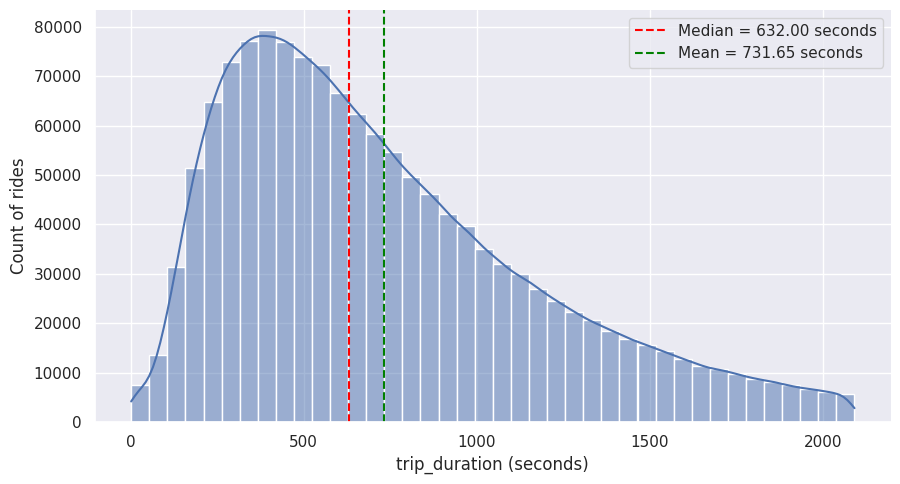

In [ ]:
# Plotting distribution of trip duration
displot_with_median(dfh1, 'trip_duration', median = True, mean = True, unit = 'seconds')

In [ ]:
# Variable Transformation
dfh1['trip_duration'] = np.sqrt(dfh1['trip_duration'])

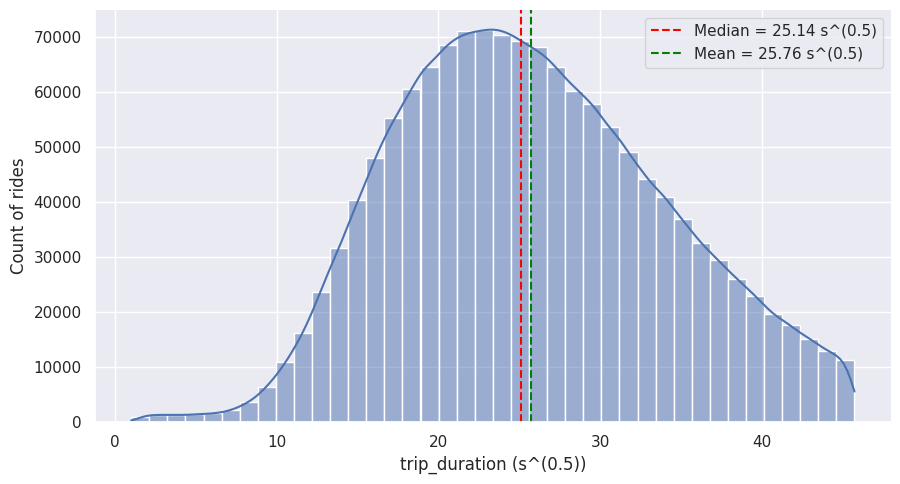

In [ ]:
# Plotting distribution of trip duration
displot_with_median(dfh1, 'trip_duration', median = True, mean = True, unit = 's^(0.5)')

In [ ]:
# Separate trip_duration data for evening and rest of the day
td_evening = dfh1[dfh1['hour_of_day'].isin(range(17, 24))]['trip_duration']
td_rest = dfh1[~dfh1['hour_of_day'].isin(range(17, 24))]['trip_duration']

# Performing the statistical test
p_value = stats.ttest_ind(td_rest, td_evening, alternative = 'greater')[1]
alpha = 0.05
if p_value < alpha:
  print(f'P-value = {p_value} < {alpha}. The Null Hypothesis stands rejected. The trip duration during the evening is significantly lesser than that during rest of the day')
else:
  print(f'P-value = {p_value} > {alpha}. The Null Hypothesis that trip duration during evening is greater than the same during rest of the day is failed to be rejected')

P-value = 1.0 > 0.05. The Null Hypothesis that trip duration during evening is greater than the same during rest of the day is failed to be rejected


##### Which statistical test have you done to obtain P-Value?

A one-tailed **two-sample t-test** is used to check whether the mean of the trip duration was indeed higher during evening to night of any given day than the same during the rest of the day.

##### Why did you choose the specific statistical test?

The two-sample t-test is used here since the goal was to check the hypothesis statement about the variation of the mean of a metric across different categories. Also, the t-test is utilised for this purpose when the number of categories across which the mean is being compared is two.

### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

**Manhattan** is often known to be the busiest borough of the NYC. And most of the taxi trips happen through here, especially through Central Park, which is the [most visited park](https://en.wikipedia.org/wiki/Central_Park#:~:text=with%20an%20estimated%2042%C2%A0million%20visitors%20annually%20as%20of%202016.) not just in NYC but in the entire United States, with about 42million visitors in 2016 alone.

Based on this information, the second hypothesis test is formulated.

*   Null Hypothesis: Atleast 80% of taxi trips have the pickup or dropoff points in Manhattan.
*   Alternative Hypothesis: The taxi trips with pickup or dropoff points in Manhattan is less than 80% of total taxi trips.

For this purpose, a one-tailed proportion test is being used with a significance value of 0.05. A large sample of the entire dataset is selected due to computational expenses.

#### 2. Perform an appropriate statistical test.

In [ ]:
# Extracting the Manhattan shapefile from the NYC shapefile
man_sf = nyc_sf[nyc_sf['boro_name'] == 'Manhattan']

# Defining an empty list to store values
in_man = []

# Selecting a random sample and computing whether a particular ride has pickup/dropoff point in Manhattan
dfh2 = dfw_inlier_nyc.sample(n = 50000, random_state = 10).copy()
for index, row in dfh2.iterrows():
  plon, plat, dlon, dlat = row['pickup_longitude'], row['pickup_latitude'], row['dropoff_longitude'], row['dropoff_latitude']
  in_man.append(man_sf.contains(Point(plon, plat)).values[0] or man_sf.contains(Point(dlon, dlat)).values[0])

In [ ]:
# Visualising the structure of the in_man list
in_man[:10]

[True, True, True, True, False, True, True, True, True, True]

In [ ]:
# Performing the one-tailed proportional hypothesis test
h_val = 0.8
equality = 'larger'
alpha = 0.05

alt_equality = 'larger' if equality == 'smaller' else 'smaller'
num_sample = len(in_man)
num_in_man = sum(in_man)
p_value = proportions_ztest(count = num_in_man, nobs = num_sample, value = h_val, alternative = alt_equality)[1]
if p_value < alpha:
  print(f'P-value = {p_value} < {alpha}. The Null Hypothesis stands rejected. The true proportion of rides into or from Manhattan is {alt_equality} than {h_val * 100}%\n')
else:
  print(f'P-value = {p_value} > {alpha}. The Null Hypothesis that the true proportion of rides into or from Manhattan is {equality} than {h_val*100}% is failed to be rejected')

P-value = 1.0 > 0.05. The Null Hypothesis that the true proportion of rides into or from Manhattan is larger than 80.0% is failed to be rejected


##### Which statistical test have you done to obtain P-Value?

The **one-sample proportion test** is utilised for this statistical Hypothesis test. One-sample proportion test is used to determine if a proportion of a single sample differs significantly from a hypothesized value. It is also known as the one-sample z-test for proportions. This test is typically used to test a hypothesis about a population proportion based on a sample proportion.

##### Why did you choose the specific statistical test?

The test assumes that the sample is randomly selected and that the sample size is large enough to meet the conditions for a normal approximation of the sampling distribution, i.e., it is not necessary that the sample or population be normally distributed. The one-sample proportion test is used to test hypotheses about a single proportion or percentage, and it is based on the binomial distribution. Since the hypothesized values were for testing proportions, this particular test was utilised.

### Hypothetical Statement - 3


#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

The three variables of possible particular interest in the **Feature Engineering** section are - **passenger_count**, **store_and_fwd_flag** and **vendor_id**.

*   Since the dataset contains only one set of pickup and dropoff points and datetimes for each ride, it will be logical to conclude that in the case of multiple **passenger_counts**, the ride does not stop anywhere else for picking them up and that all boarded at the same place. Hence, there is no logical relationship between **passenger_count** and trip duration which can also be seen in Chart Visualization section.
*   There is no logical relationship between **store_and_fwd_flag** and trip duration (explained in the Feature Engineering section). Also, there is a very high class imbalance in this category.
*   Whether the significance of a vendor (in providing better service in terms of trip duration) on the trip duration is present or not, needs to be tested.

**Hence, these 3 variables are under scrutiny, to test their effect on the trip duration.**

*   Null Hypothesis: The trip duration is not dependent on each of these categorical variables.
*   Alternative Hypothesis: The trip duration is dependent on each of these categorical variables.

Since there is explicit dependency test between categorical and continuous variables, along with the one-way ANOVA or t-test (based on if whether the number of categories is two, or three-plus), the chi-squared test is also performed after categorising the trip duration into bins of small intervals. A significance value of 0.05 is maintained.



#### 2. Perform an appropriate statistical test.

In [ ]:
dfh3 = dfw_inlier_nyc.copy()
dfh3 = dfh3[dfh3['passenger_count'].isin(range(1, 7))]
dfh3['trip_duration'] = np.sqrt(dfh3['trip_duration'])
alpha = 0.05
p_vals = []
for var in categ_vars:
  # List of values of trip duration grouped by each category of given categorical variable
  grouped_data = [dfh3[dfh3[var] == val]['trip_duration'] for val in dfh3[var].unique()]

  # Performing the statistical test
  if len(grouped_data) > 2:
    p_value = stats.f_oneway(*grouped_data)[1]
  elif len(grouped_data) == 2:
    p_value = stats.ttest_ind(*grouped_data)[1]

  p_vals.append(p_value)
  print(f'Variation of trip_duration mean with different classes of {var}. Number of classes = {len(grouped_data)}')
  if p_value < alpha:
    print(f'P-value = {p_value} < {alpha}. The Null Hypothesis stands rejected. There is sufficient variation of trip_duration means in different classes of {var}\n')
  else:
    print(f'P-value = {p_value} > {alpha}. The Null Hypothesis that there is no significant variation of trip_duration means in different classes of {var} is failed to be rejected\n')

Variation of trip_duration mean with different classes of vendor_id. Number of classes = 2
P-value = 9.634608403656982e-14 < 0.05. The Null Hypothesis stands rejected. There is sufficient variation of trip_duration means in different classes of vendor_id

Variation of trip_duration mean with different classes of passenger_count. Number of classes = 6
P-value = 5.926142590992755e-205 < 0.05. The Null Hypothesis stands rejected. There is sufficient variation of trip_duration means in different classes of passenger_count

Variation of trip_duration mean with different classes of store_and_fwd_flag. Number of classes = 2
P-value = 1.642505944495241e-35 < 0.05. The Null Hypothesis stands rejected. There is sufficient variation of trip_duration means in different classes of store_and_fwd_flag



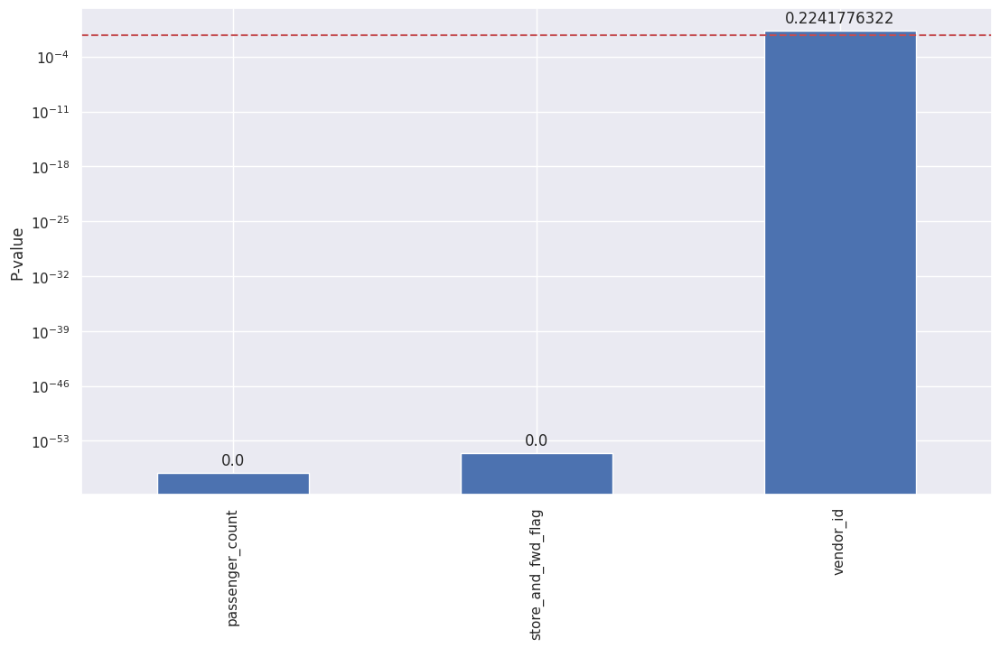

In [ ]:
# Categorize trip durations into bins
bins = [x*60 for x in list(range(0, 31, 3)) + [60]]
labels = [x for x in range(len(bins) - 1)]
dfh3 = dfw_inlier_nyc.copy()
dfh3['trip_duration_bin'] = pd.cut(dfh3['trip_duration'], bins = bins, labels = labels, right = False)

# Performing the statistical test
alpha3 = 0.05
p_vals = chi2(dfh3[categ_vars], dfh3['trip_duration_bin'])[1]

# Plotting the p_values for each categorical variable
categ_score_df = pd.DataFrame(p_vals, categ_vars).sort_values(0)
ax = categ_score_df.plot(kind = 'bar', figsize = (13, 7))
ax.legend_.remove()
ax.set(yscale = 'log', ylabel = 'P-value')
plt.axhline(alpha3, color = 'r', linestyle = '--')
display_vals(ax, 10)
plt.show()

*   As per test 1 - There is no conclusive evidence to accept that there is no significant difference to mean of trip duration across classes of each of the categorical variables.

*   As per test 2 - A very high p-value can be observed for the case of **vendor_id**, showing low dependency of trip duration. (This will also be discussed in the [model explanation](#scrollTo=rTjS9S5YTovl&line=4&uniqifier=1) section)

##### Which statistical test have you done to obtain P-Value?

*   For test 1 - A **one-way ANOVA** test and **two-sampled t-test**, both two-tailed, is used. Since both these tests require normal distribution of the continuous variable, it has been transformed as earlier.

*   For test 2 - The **two-sampled chi-squared test** statistic has been used for this test. It measures the dependency between two categorical variables, and higher statistical value indicate stronger dependency.

##### Why did you choose the specific statistical test?

*   The one-way ANOVA was used for when the categories in one categorical variable across which the means of trip durarion are being compared is greater than two (in this case, the passenger_count variable), and for the rest the two-sampled t-test is used, for reasons mentioned earlier.
*   For the two-sampled chi-squared test, the p-value measures the statistical significance of the observed dependency between two categorical variables, and lower p-values indicate stronger evidence against the null hypothesis of no dependency between the variables. This test is used since there is no explicit test statistic for comparing dependency between a continuous variable and a categorical variable.

## **6. Feature Engineering & Data Pre-processing**

In [ ]:
data = df.copy()

categ_vars = ['vendor_id', 'passenger_count', 'store_and_fwd_flag']
cont_vars = ['pickup_longitude', 'pickup_latitude', 'dropoff_longitude', 'dropoff_latitude']

### 1. Handling Missing Values

In [ ]:
# Checking the count of missing values
data.isna().sum()

id                    0
vendor_id             0
pickup_datetime       0
dropoff_datetime      0
passenger_count       0
pickup_longitude      0
pickup_latitude       0
dropoff_longitude     0
dropoff_latitude      0
store_and_fwd_flag    0
trip_duration         0
dtype: int64

Since no missing values are present in the dataset, we can proceed to handle outliers in the dataset

### 2. Handling Outliers

The **continuous variables** in this dataset are:
*   pickup_latitude
*   pickup_longitude
*   dropoff_latitude
*   dropoff_longitude
*   trip_duration

In the first section, the outliers of pickup and dropoff coordinates will be dealt with, while the same of trip_duration will be dealt in the second one. The method and logic of outlier removal has already been discussed in the **Data Visualization** section.

#### 2.1 Pickup and Dropoff latitudes	and longitudes

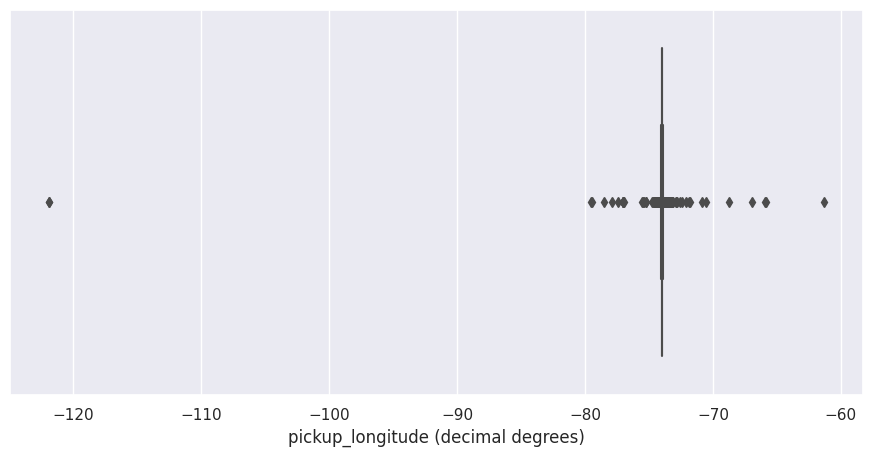

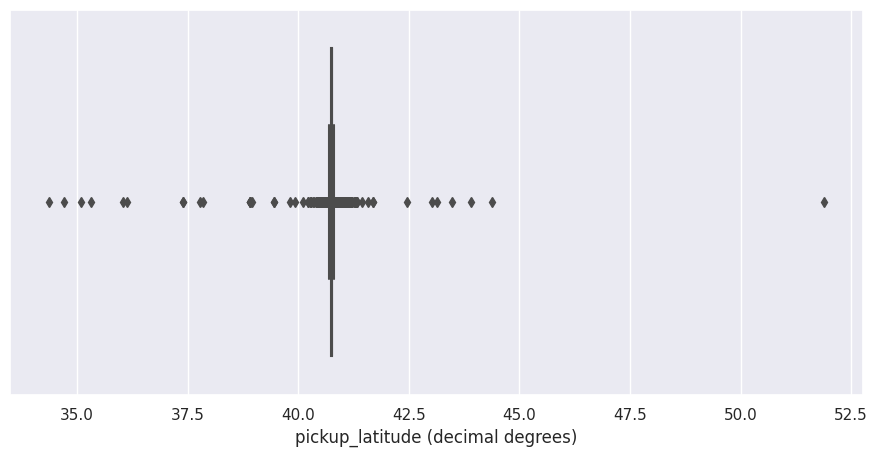

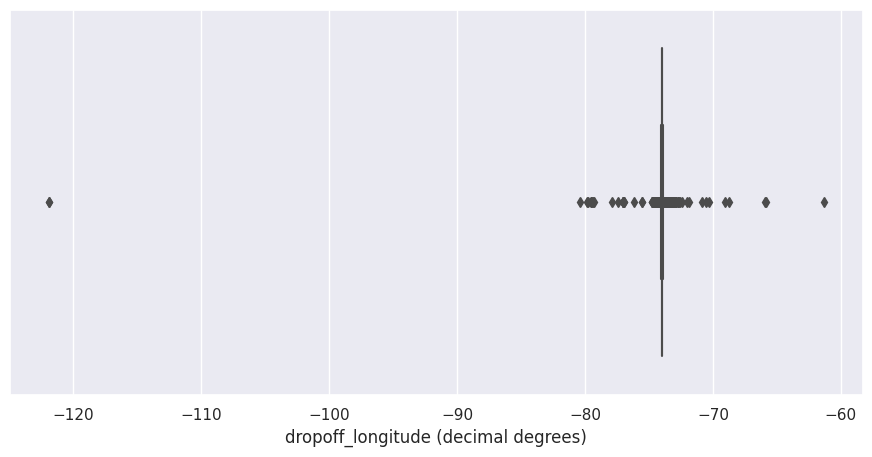

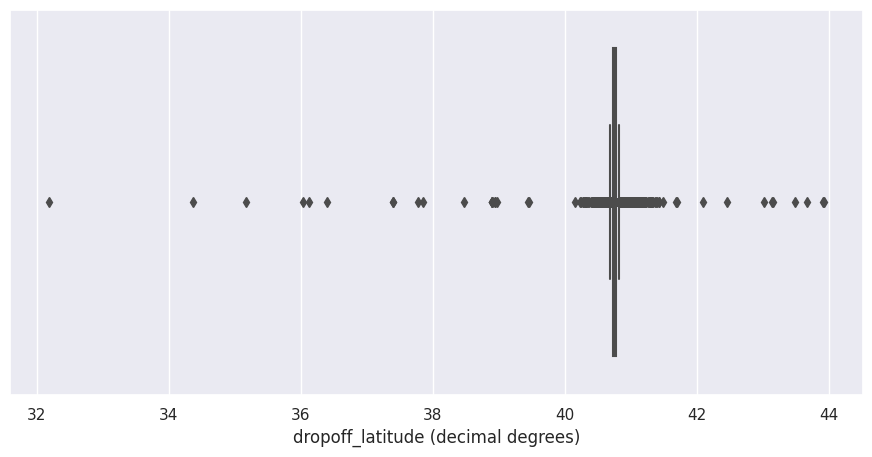

In [ ]:
# Plotting the outlier distribution of pickup and dropoff lats and lons
for var in cont_vars:
  plt.figure(figsize = (11, 5))
  sns.boxplot(data = data, x = var)
  plt.xlabel(var + ' (decimal degrees)')
  plt.show()

As can be seen above, many outliers of pickup and dropoff coordinates are located way outside NYC. Since the objective is to predict taxi trip duration **within NYC**, the dataset shall be limited within the near boundaries of the city, as shown below

In [ ]:
# Defining the limit coordinates
limits = [[-74.3, -73.65], [40.46, 40.93]]

# Plotting the geographical limit to contain the dataset in
path_gj = '/content/drive/MyDrive/ALMA BETTER/Module 4/#CAPSTONE 1 - REGRESSION/Map_files/Borough Boundaries.geojson'
plot_folium(gjson_path = path_gj, limits = limits, coords = None)

In [ ]:
# Containing the pickup and dropoff coordinates within the boundaries of NYC
data = data[
            data['pickup_latitude'].between(40.46, 40.93) &
            data['dropoff_latitude'].between(40.46, 40.93) &
            data['pickup_longitude'].between(-74.3, -73.65) &
            data['dropoff_longitude'].between(-74.3, -73.65)
            ]

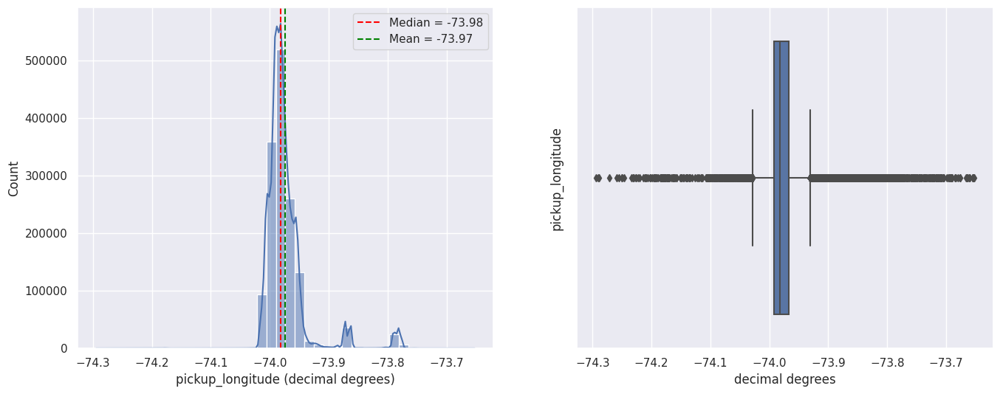

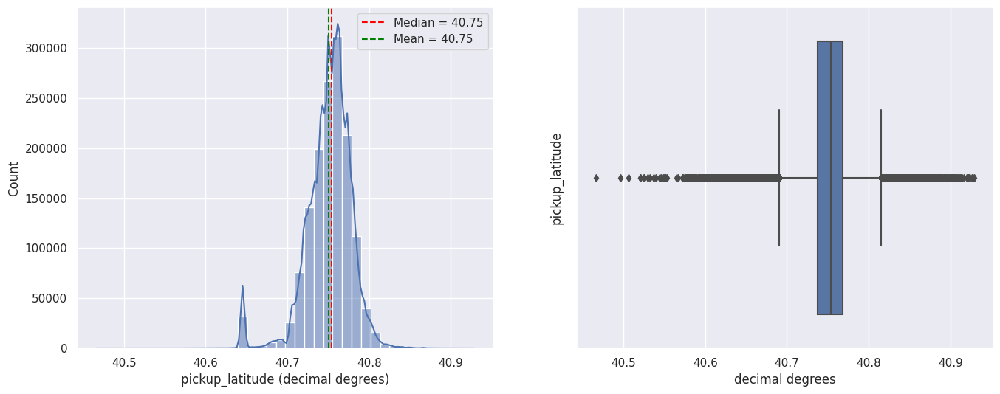

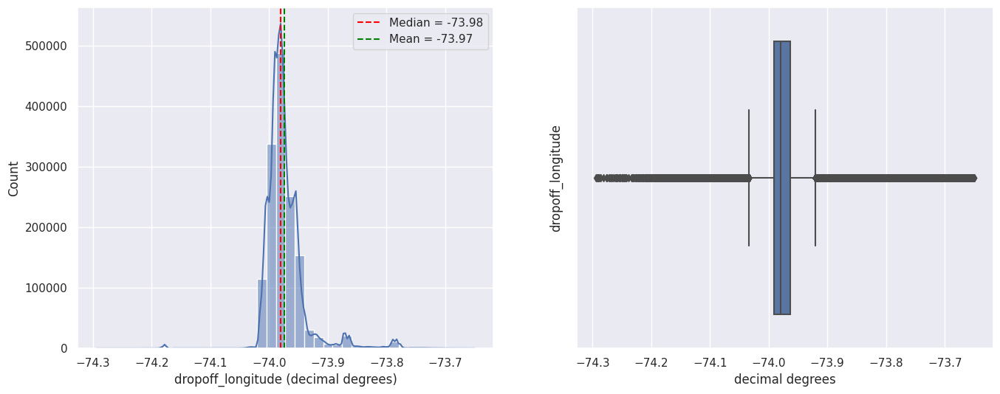

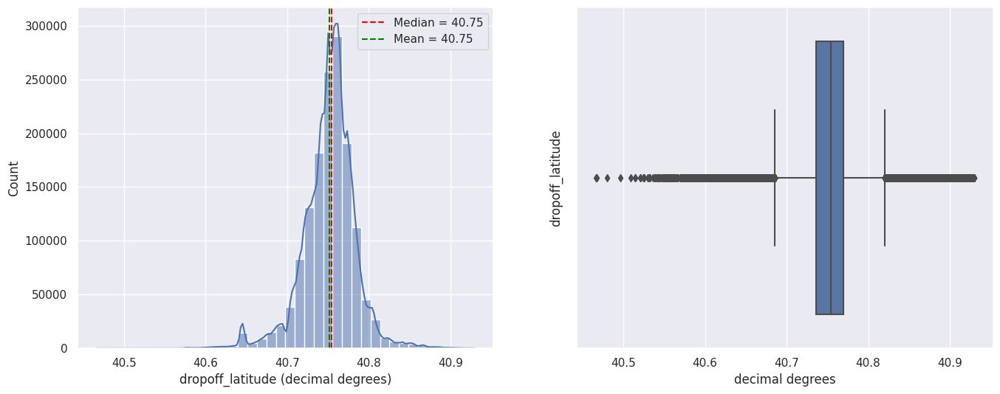

In [ ]:
# Function to plot histogram and boxplot
def hist_box_plots(dataset, vars, units = None):
  '''Plots both the histogram plot and boxplot of a given variable
  Inputs - dataset, variables to plot (list), and units (same length as vars)'''
  for var, unit in zip(vars, units):
    fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (16, 6))
    sns.histplot(dataset[var], bins = 40, kde = True, ax = ax[0])
    ax[0].axvline(dataset[var].median(), color = 'red', linestyle = '--', label = f'Median = {round(dataset[var].median(), 2)}')
    ax[0].axvline(dataset[var].mean(), color = 'green', linestyle = '--', label = f'Mean = {round(dataset[var].mean(), 2)}')
    ax[0].set(xlabel = var + f' ({unit})')
    ax[0].legend()
    sns.boxplot(data, x = var, orient = 'h', ax = ax[1])
    ax[1].set(ylabel = var, xlabel = unit)
  plt.show()

# Plotting the updated outlier distribution of pickup and dropoff lats and lons
hist_box_plots(data, cont_vars, ['decimal degrees'] * 4)

In [ ]:
print(f'Number of rows removed after trimming = {df.shape[0] - data.shape[0]}')
print(f'Percentage of rows removed from original dataset = {(df.shape[0] - data.shape[0])*100/df.shape[0]}%')

Number of rows removed after trimming = 997
Percentage of rows removed from original dataset = 0.06835115353712078%


#### 2.2 Trip duration

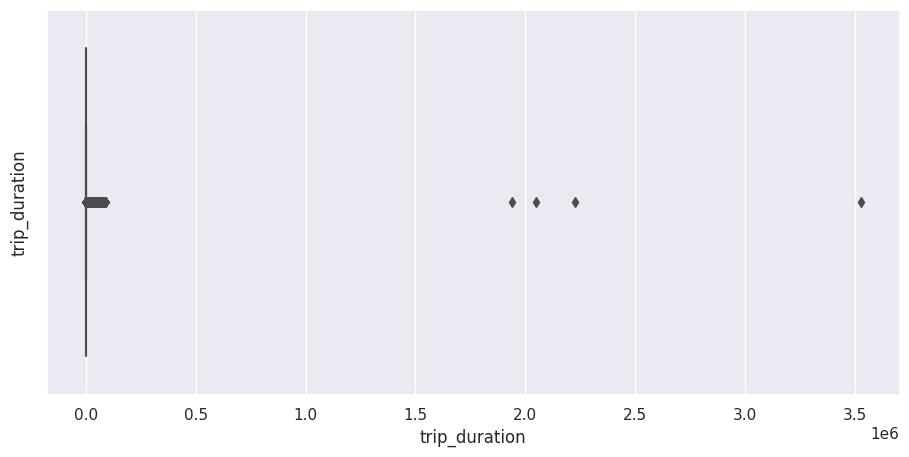

In [ ]:
# Plotting a boxplot to check the values of the outliers
plt.figure(figsize = (11, 5))
sns.boxplot(data = data, x = 'trip_duration')
plt.ylabel('trip_duration')
plt.show()

As it can be seen, **trip_duration** has outliers which go up to the value of millions of seconds (or 40 days). This data is unreasonable, especially considering the dataset now contains only rides within NYC.

Hence, the values of trip_duration shall be contained within a maximum value calculated from the **interquartile region**. The formulae for them are:

\begin{align*}
\text{Max value} &= Q_3 + 1.5 \times IQR \\
IQR &= Q_3 - Q_1
\end{align*}

In [ ]:
# Computing the IQR and maximum value for trip_duration
td_iqr = data['trip_duration'].quantile(0.75) - data['trip_duration'].quantile(0.25)
max_q3 = data['trip_duration'].quantile(0.75) + 1.5*td_iqr
print(max_q3)

2089.5


In [ ]:
# Trimming trip_duration outliers
n_rows = data.shape[0]
data = data[(data['trip_duration'] <= max_q3)]
print(f'Number of rows removed after trimming = {n_rows - data.shape[0]}')
print(f'Percentage of rows removed from original dataset = {(n_rows - data.shape[0])*100/n_rows}%')

Number of rows removed after trimming = 73991
Percentage of rows removed from original dataset = 5.076057509122579%


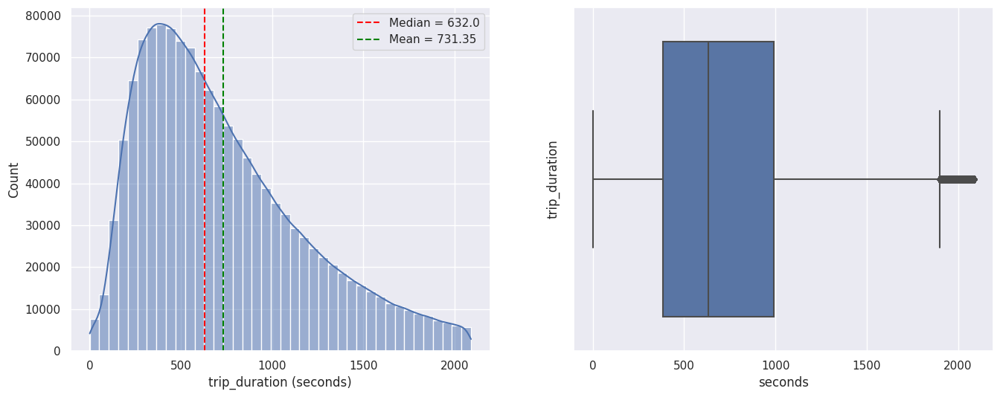

In [ ]:
# Plotting the updated outlier distribution of trip_duration
hist_box_plots(data, ['trip_duration'], ['seconds'])

#### What all outlier treatment techniques have you used and why did you use those techniques?

**Trimming** has been utilised for removing outliers for the following reasons:
*   The amount of outliers of the coordinates is very less (997 rows or 0.06% in first case and ~5% in second), since the dataset is very huge. Hence, removing such a small amount of data will not lead to loss of information, but will infact remove noise.
*   Trimming does not distort the rest of the dataset. It preserves their original distribution and characteristics.

### 3. Categorical Encoding

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1383656 entries, 0 to 1458643
Data columns (total 11 columns):
 #   Column              Non-Null Count    Dtype         
---  ------              --------------    -----         
 0   id                  1383656 non-null  object        
 1   vendor_id           1383656 non-null  int64         
 2   pickup_datetime     1383656 non-null  datetime64[ns]
 3   dropoff_datetime    1383656 non-null  datetime64[ns]
 4   passenger_count     1383656 non-null  int64         
 5   pickup_longitude    1383656 non-null  float64       
 6   pickup_latitude     1383656 non-null  float64       
 7   dropoff_longitude   1383656 non-null  float64       
 8   dropoff_latitude    1383656 non-null  float64       
 9   store_and_fwd_flag  1383656 non-null  object        
 10  trip_duration       1383656 non-null  int64         
dtypes: datetime64[ns](2), float64(4), int64(3), object(2)
memory usage: 126.7+ MB


It can be seen that only **store_and_fwd_flag** has an object datatype and needs to be encoded.

In [ ]:
# Using binary encoding
data['store_and_fwd_flag'] = data['store_and_fwd_flag'].map({'N' : 0, 'Y' : 1})

In [ ]:
data['store_and_fwd_flag'].value_counts(dropna = False)

0    1376607
1       7049
Name: store_and_fwd_flag, dtype: int64

#### What all categorical encoding techniques have you used & why did you use those techniques?

Since this feature only has two values, binary encoding has been used. Using binary encoding, the feature with values "Y" and "N" are transformed to a single binary variable where "Y" is encoded as 1 and "N" is encoded as 0. This encoding preserves the information about the presence or absence of the category characteristic without introducing additional variables.

### 4. Feature Manipulation & Selection

#### 4.1. Feature Manipulation

In this section, new features are created (either from existing features or anew) which are useful (if not more) for predicting taxi trip duration. The features created are:
*   Temporal features (from pickup_datetime)
*   Distance (from pickup and dropoff latitudes and longitudes)
*   Holidays

##### 4.1.1 Temporal features from pickup_datetime

From **pickup_datetime**, the following features are extracted with respect to which **trip_duration** has a possibility of displaying periodicity because of the dependency of traffic on these features.
*  **Day of the week**: Weekdays (especially the end of weekdays) typically experience higher traffic volumes compared to weekends. This is primarily due to commuting and work-related travel
*  **Day of the month**: The day of the month cann effect the taxi trip durations, influenced by pay daya and social activities.
*   **Month of the year**: The trip duration can vary depending on the month due to local festivities, tourist seasons, climate etc.
*   **Hour of the day**: Rush hour periods during morning and evening of weekdays typically experience the highest traffic congestion due to commuting in contrast to hours of late night and early morning.

The distribution and analysis of these features are performed in **Chart 3** of **Data Visualization** section

In [ ]:
data['day_of_week'] = data['pickup_datetime'].dt.weekday
data['day_of_month'] = data['pickup_datetime'].dt.day
data['month'] = data['pickup_datetime'].dt.month
data['hour_of_day'] = data['pickup_datetime'].dt.hour

##### 4.1.2 Distance from pickup and dropoff coordinates

One of the most basic factors influencing trip duration is distance. A rough idea of the road distance can be obtained by computing the shortest distance between the pickup and dropoff coordinates.

The haversine distance is used to compute the geological distance instead of geodesic calculation. While the latter is more accurate, it is also very computationally expensive especially for such a large dataset. Furthermore, the dataset is limited to NYC which is of a much smaller scale compared to the earth's radius, hence the difference between both the methods will be negligible

In [ ]:
data['distance'] = data.apply(lambda x: compute_distance(x), axis=1)

In [ ]:
data['distance'].sort_values().head()

1087738    0.0
941151     0.0
773368     0.0
1248602    0.0
1358358    0.0
Name: distance, dtype: float64

It can be seen that there are some rows which have a trip distance of zero. These are eliminated from the dataset

In [ ]:
data = data[data['distance'] != 0]

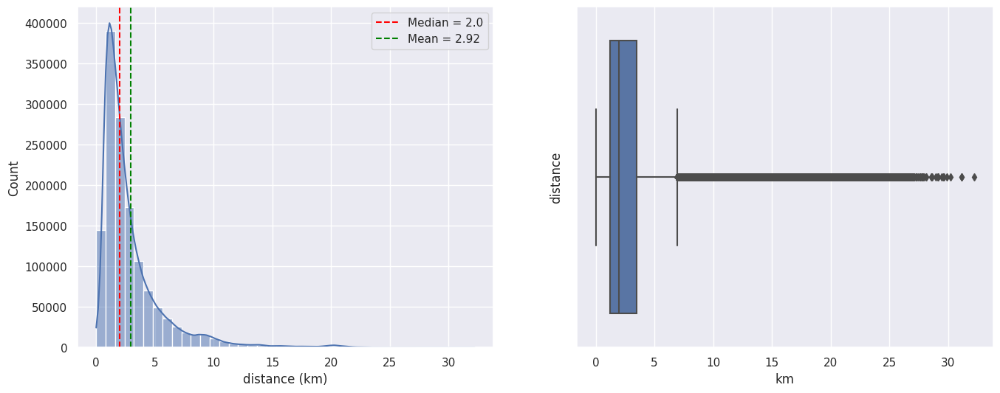

In [ ]:
# Plotting the distribution of distance
hist_box_plots(data, ['distance'], ['km'])

##### 4.1.3 holidays

Specifying whether a given day is holiday or not could have a significant influence on prediction of the taxi trip duration. The analysis of this is done in **Charts 2** and **4** of **Data Visualization**

In [ ]:
nyc_holidays = holidays.UnitedStates(state = 'NY', years = [2016])
data['holiday'] = data['pickup_datetime'].dt.date.isin(nyc_holidays).map({True : 1, False : 0})

In [ ]:
data['holiday'].value_counts()

0    1343127
1      34862
Name: holiday, dtype: int64

#### 4.2. Feature Selection

In this section, certain features will be dropped which are deemed unimportant. The features being dropped are:
*   pickup and dropoff datetime
*   passenger_count
*   store_and_fwd_flag
*   trip id

##### 4.2.1 pickup and dropoff datetime

Since pickup and dropoff times are of datetime format, and necessary variables have been extracted from the former, we can drop these two variables after checking if their difference matches the **trip_duration**

In [ ]:
# Calculating whether the difference of pickup/dropoff datetimes match trip_duration
calculated_td = (data['dropoff_datetime'] - data['pickup_datetime']).dt.seconds
td_error = data['trip_duration'] - calculated_td
td_error.value_counts()

0    1377989
dtype: int64

In [ ]:
# Dropping the features
data = data.drop(['dropoff_datetime', 'pickup_datetime'], axis = 1)

##### 4.2.2 passenger_count

*   **Passenger count** would ideally have been a potential factor for predicting **trip_duration**. An example is multiple passengers boarding at different locations which may cause larger trip durations.

*   But in the dataset, only one set of **pickup and dropoff datetimes and coordinates** are provided. And the datetime features are when the meter is switched on and off. In NYC, the meter is engaged typically AFTER the passenger boards and starts the trip.

*   From the above observations, it is logical to assume that the multiple passengers start at the same time and place and are not picked up from different places. From this, **passenger count** has logically no impact on the **trip_duration**, as the latter is independent of the former.

*   Also, this effect is seen in **[Chart 4](#scrollTo=_WtzZ_hCYuh4&line=4&uniqifier=1)**, where it is observed that **passenger_count** has minimal impact in the distribution of **trip_duration**. This is also reflected in the low correlation between the features as seen below.

*   Hence, it is concluded that **passenger_count** should be dropped from analysis.

In [ ]:
# Checking the pearson's correlation
data[['passenger_count', 'trip_duration']].corr()

,passenger_count,trip_duration
passenger_count,1.000000,0.011419
trip_duration,0.011419,1.000000


In [ ]:
data = data.drop('passenger_count', axis = 1)

##### 4.2.3 store_and_fwd_flag

*   The **store_and_fwd_flag** variable itself is unlikely to have a direct impact on taxi **trip_duration**. It primarily indicates whether the trip data was temporarily stored in the vehicle's memory due to connectivity issues or sent immediately without storage.

*   Also, the minimal effect of **store_and_fwd_flag** on the distribution of **trip_duration** was also concluded in **[Chart - 4](#scrollTo=_WtzZ_hCYuh4&line=4&uniqifier=1)**.

*   The classes in **store_and_fwd_flag** is highly imbalanced as seen in **Chart 2** (Only 0.5% in one class). The highly imbalanced distribution of this variable could limit its usefulness in predicting **trip_duration**. With such a small proportion of 'Y' values, it may not provide sufficient variability or predictive power to contribute meaningfully to the regression models.

Due to the above reasons, it is concluded that **store_and_fwd_flag** will be dropped from this analysis.

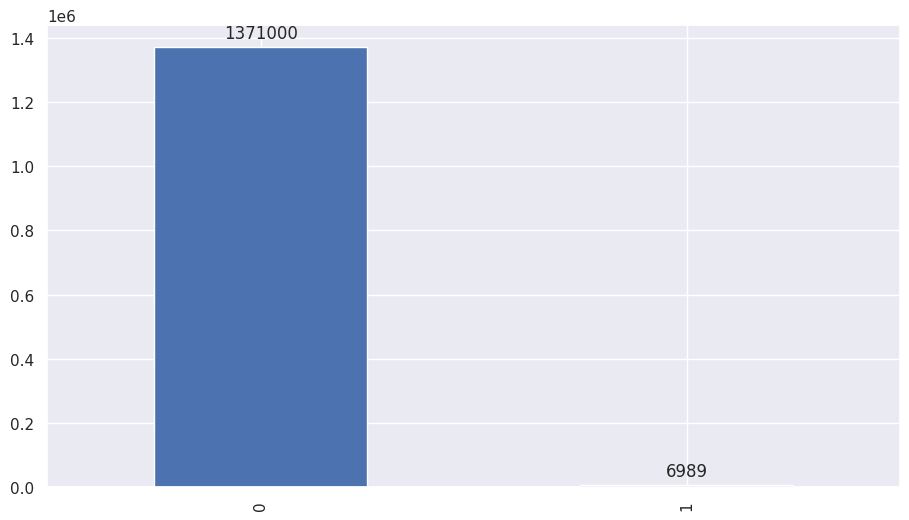

In [ ]:
# Plotting the store_and_fwd_flaf distribution
var = 'store_and_fwd_flag'
fig, ax = plt.subplots(figsize = (11, 6))
data[var].value_counts().sort_index().plot(kind = 'bar', ax = ax)
display_vals(ax)

In [ ]:
data = data.drop('store_and_fwd_flag', axis = 1)

##### 4.2.4 trip id

Since the **trip_id** is a primary identifier key, it is independent of **trip_duration** and is hence dropped from analysis

In [ ]:
data = data.drop('id', axis = 1)

##### 4.2.5 Checking multicollinearity using VIF

<Axes: >

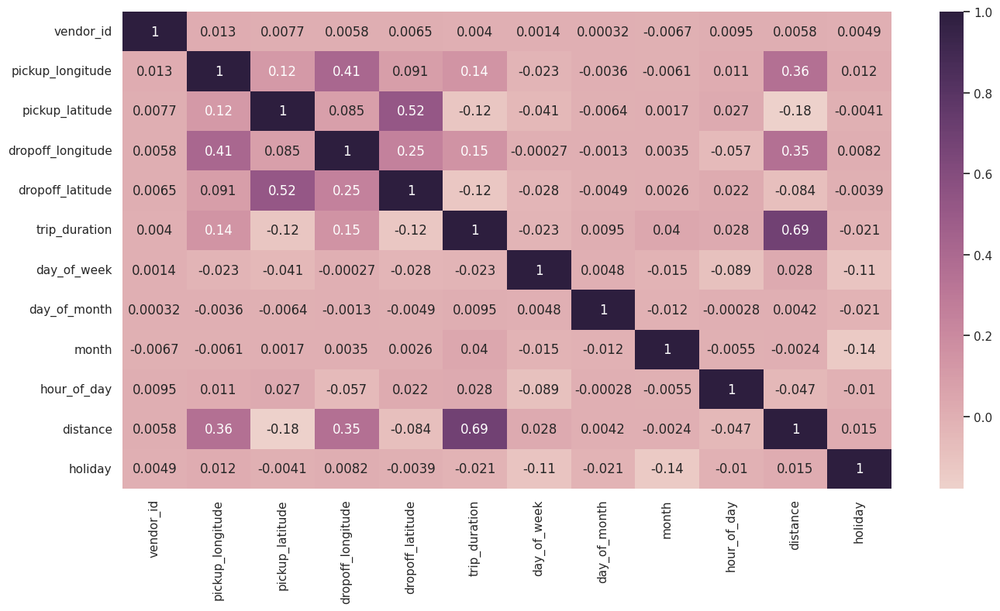

In [ ]:
# Correlation heatmap for dataset
plt.figure(figsize = (16, 8))
sns.heatmap(data.corr(), annot = True, cmap = sns.cubehelix_palette(as_cmap = True))

In [ ]:
def compute_vif(inputs):
  vif = pd.DataFrame()
  vif['Features'] = inputs.columns
  vif['VIF'] = [vif_(inputs.values, i) for i in range (inputs.shape[1])]
  return vif

compute_vif(data[cont_vars]).style.applymap(colorise, threshold = 10, font = 'red')

,Features,VIF
0,pickup_longitude,5952000.800000
1,pickup_latitude,3311480.521395
2,dropoff_longitude,5754534.869905
3,dropoff_latitude,2474801.476588


*    It should be noted that, despite the high multicollinearity occurring in the pickup and dropoff coordinates, they shall be chosen as inputs in the analysis.

*   This is because the spatial patterns and its effects on **trip_duration** can not be captured by features such as **distance** alone. The coordinates of the pickup and dropoff locations are also relevant as it indirectly points to possible trip routes and traffic intensity when coupled with the timestamp. These geographical features are hence necessary especially when it interacts with the other features in the input dataset.

*   Furthermore, not even a single one of them can be dropped since the pickup or dropoff latitude or longitude alone does not specify the location. Also, the longitudes and latitudes can't be combined as well, since both of them distinctly form the unique fingerprint to a given location.

*   Finally, to corroborate the above points, the regression models were run without including the pickup and dropoff coordinates. They resulted in a significant decrease of the of the model evaluation scores despite removal of multicollinearity.  

#### 4.3 Feature Selection iterations

##### Which all features you found important and why?

In [ ]:
# Printing the selected input features
cont_vars += ['distance']
categ_vars = categ_vars[0].split(' ') + ['day_of_week', 'day_of_month', 'month', 'hour_of_day', 'holiday']

print('The input features selected are:\n')
print(*(cont_vars + categ_vars), sep = '\n')

The input features selected are:

pickup_longitude
pickup_latitude
dropoff_longitude
dropoff_latitude
distance
vendor_id
day_of_week
day_of_month
month
hour_of_day
holiday


*   It should be noted that, for all the features that have been dropped with assumptions, even if logical (viz., **passenger_count** and **store_and_fwd_flag**), their various combinations along with other features of interest have been tried as iterations and regression models fit into them. The features are:
  *   passenger_count (P)
  *   (extreme) weather (W)
  *   holidays (H)
  *   store_and_fwd_flag (S)

*   The nomenclature of each iteration is as follows: A combination of **'PWHS'** (where each letter represents the first letter from each feature) and a boolean representing the pariticpation of that feature in the iteration. For example, **PWHS1001** signifies that **passenger_count** and **store_and_fwd_flag** has been included in that iteration, while **extreme_weather** and **holidays** have been neglected.

*   In the current notebook, since only **holiday** is included while others have been dropped from the dataset, it shall be named **PWHS0010**. The **Hypothesis** is that this iteration performs the best based on the aforementioned logical assumptions. This shall be tested out while evaluating the results from the regression models. (Check [here](#scrollTo=gq7eFB4Z8nFX&line=1&uniqifier=1))

### 5. Data Transformation

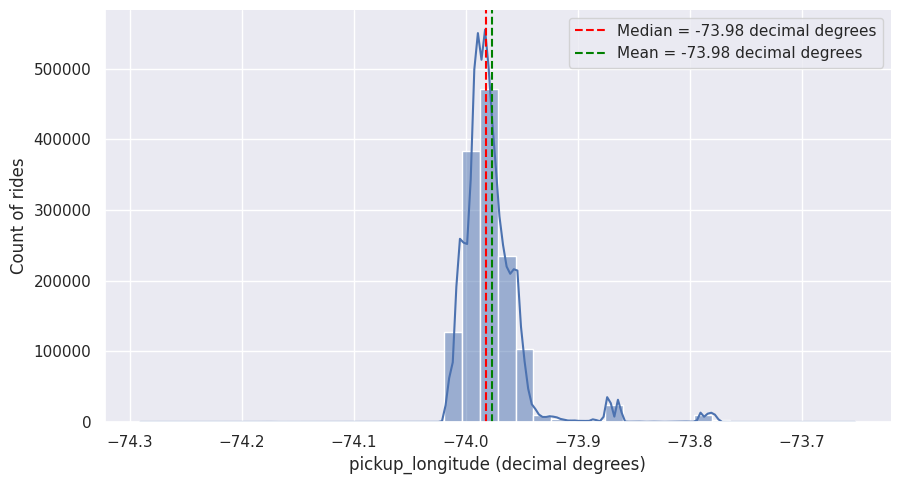

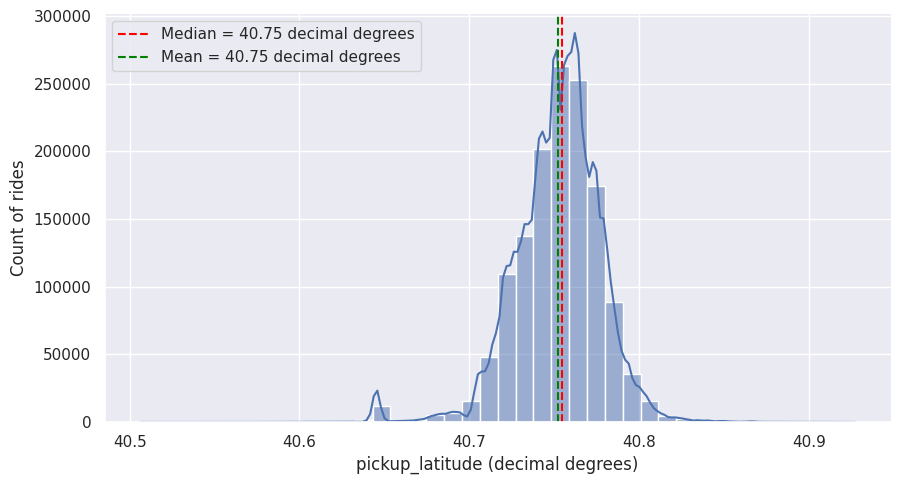

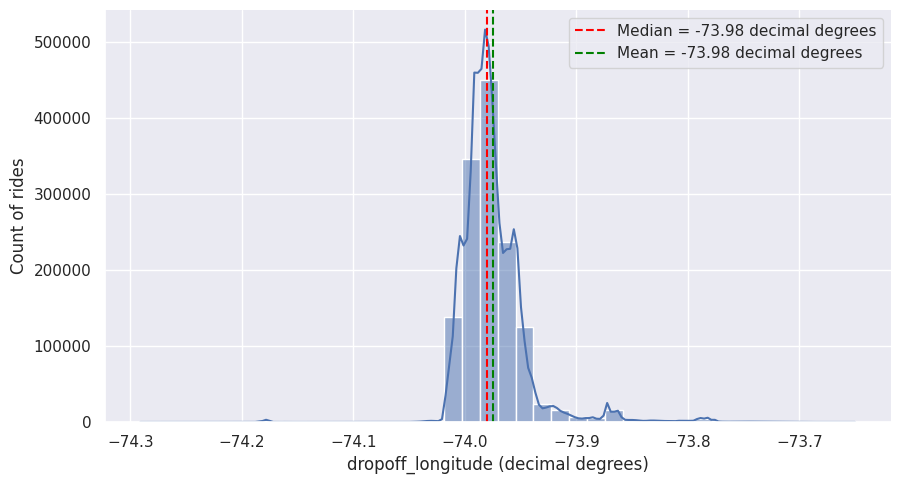

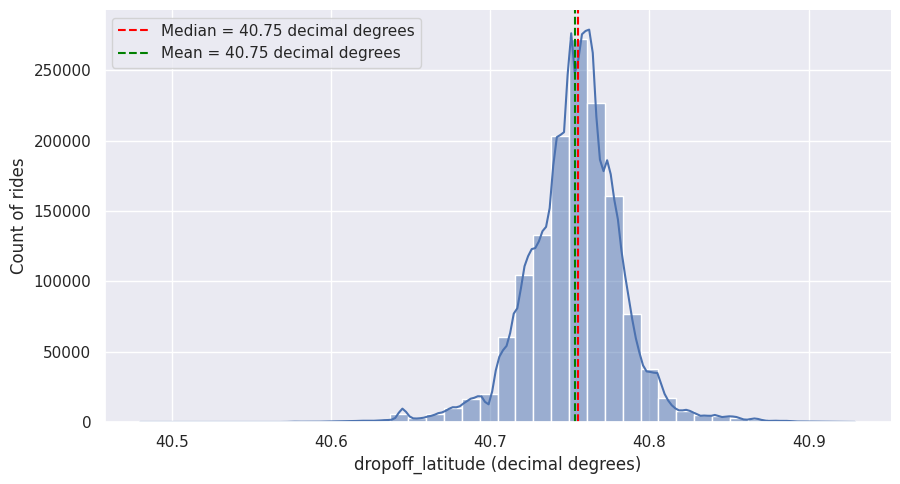

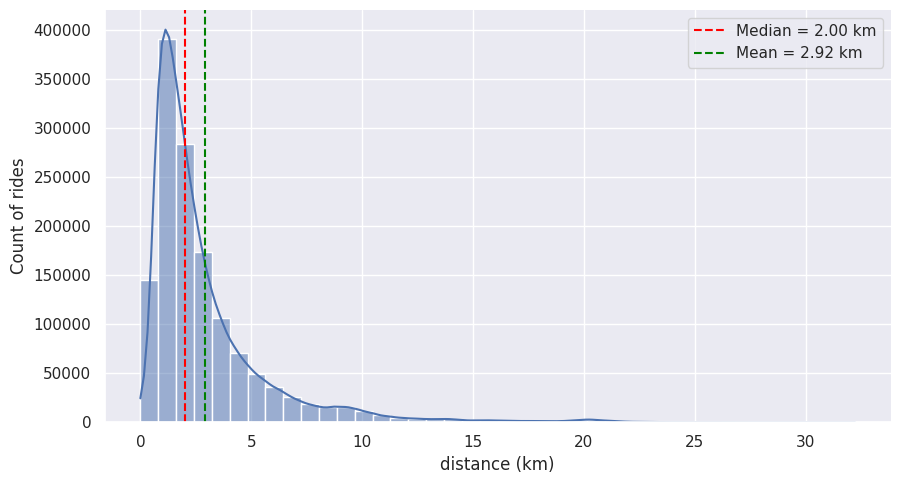

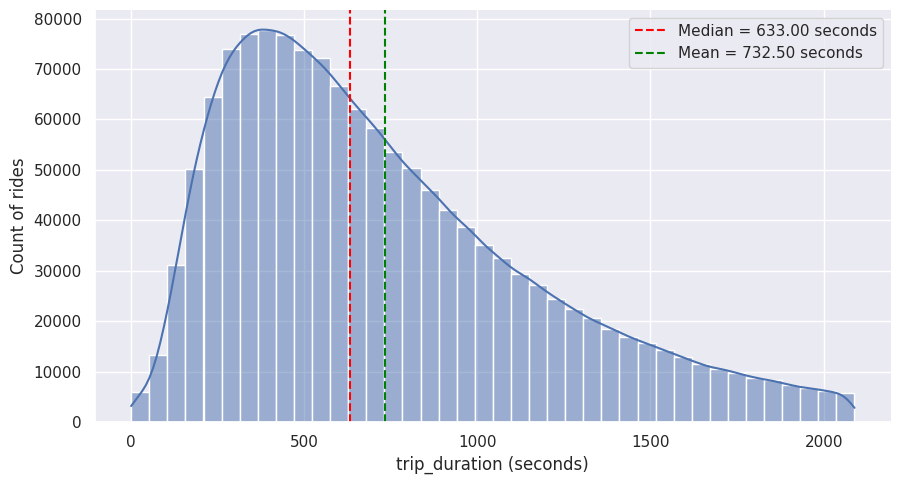

In [ ]:
# Checking the distribution for continuous variables
for var, unit in zip(cont_vars + ['trip_duration'], ['decimal degrees']*4 + ['km', 'seconds']):
  displot_with_median(dataset = data, variable = var, median = True, mean = True, unit = unit)

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

It can be observed that the pickup and dropoff coordinates have means and medians which are very close to each other, and are symmetrical. But **distance** and **trip_duration** have moderate right sided skew. Hence, they have to be subjected to logarithmic transformation to make their distributions close to the normal distribution.

Many regression models can handle skewed distributions of continuous variables, however some models do benefit from a normal distribution of its features.

In [ ]:
# Transforming the variables
data['trip_duration'] = np.sqrt(data['trip_duration'])
data['distance'] = np.sqrt(data['distance'])

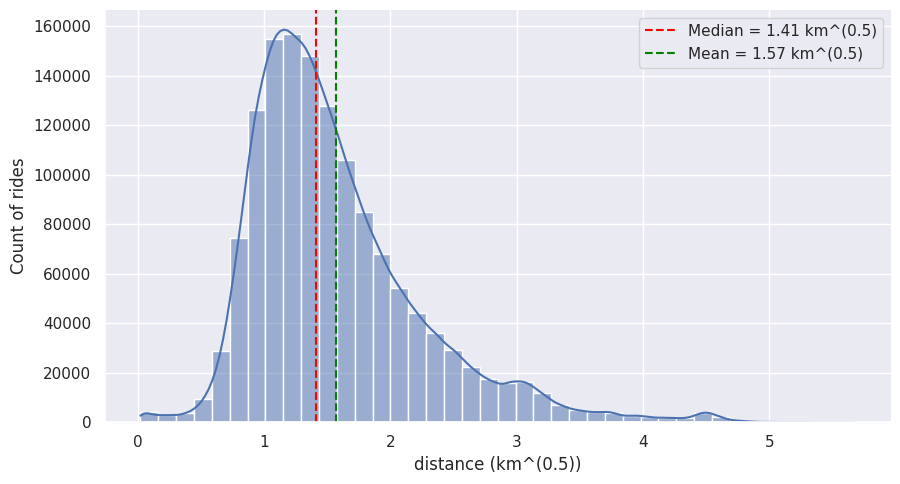

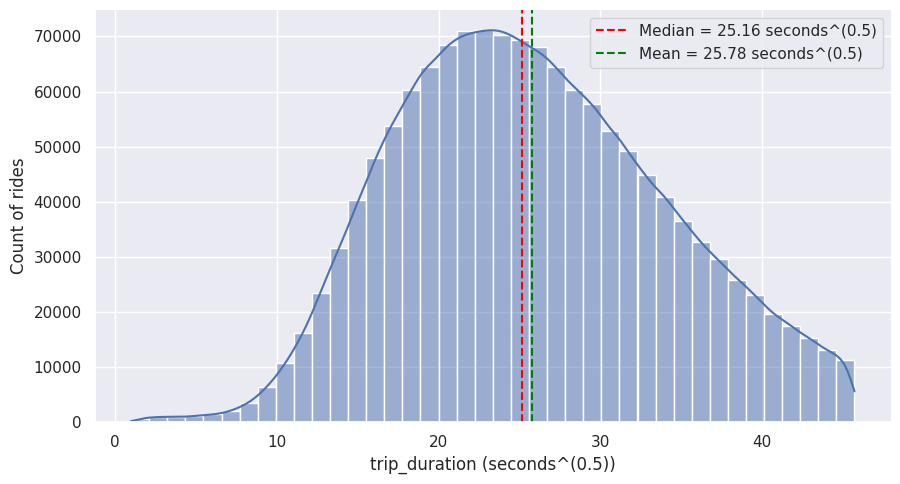

In [ ]:
# Checking ethe distribution
for var, unit in zip(['distance', 'trip_duration'], ['km^(0.5)', 'seconds^(0.5)']):
  displot_with_median(dataset = data, variable = var, median = True, mean = True, unit = unit)

### 6. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.
X = data.drop('trip_duration', axis = 1)
Y = data['trip_duration']

rs = 8
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.2, random_state = rs)

##### What data splitting ratio have you used and why?

Since this is a large dataset, sufficient amount of data can be provided for training using the 80-20 train-test split, instead of the 70-30 split. A larger training data is feasible since there will be sufficient data availaible for testing the regression models as well.

### 7. Data Scaling

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

##### Which method have you used to scale you data and why?

As a general thumb rule, **standardization** (Z-score normalization) is often a good starting point for scaling numerical features in regression problems. **Standardization** is widely used and is effective in ensuring that variables have zero mean and unit variance. It is also robust to outliers and works well with algorithms that assume zero-centered data.

## **7. ML Model Implementation**

*   The following 7 models (followed by stacking of any of these 7) are implemented in this section on the train dataset, and then tested on the test data.

  *   Linear Regression
  *   Lasso Regularized Linear Regression
  *   Ridge Regularized Linear Regression
  *   Polynomial Regression
  *   Decision Tree
  *   LightGBM
  *   XGBoost
  *   Stacking

*   Due to the computational expense, Support Vector Regression has not been implemented. Also, the hyperparameter tuning of XGBoost and Stacking has been limited for the same reason.

*   Since model explainability is not a strict requirement in taxi trip duration prediction (unlike, for eg., prediction of cancer or heart diseases in patients), explainability models have not been utilised.

*   The scoring metrics stored for each model here includes the **Root-Mean-Squared-Error (RMSE)**, **R<sup>2</sup> score** and the **adjusted R<sup>2</sup> score.** The adjusted r<sup>2</sup> score is also included to capture redundancy of independent predictors in the model. Altough, it is expected that both would remain the same due to the large number of observations in the dataset.

*   For visualization of the train and test predictions, the following three charts are used:
  *   Line plot of the predicted and true values.
  *   Scatter plot of predicted value vs true values: In an ideal model this is a straight line called the **identity line**, with slope = 1 and passing through origin (i.e., predicted value = true value). Hence, the model performance can be visualized by viewing **how close the scatter plot datapoints are to the identity line.**
  *   Density plot to visualize the distribution of the predicted and true values instead of plotting individual data points. This can provide an overview of the overall shape and spread of the predictions w.r.t true values.



### Defining functions for model fitting, evaluation and plotting

In [ ]:
# Function to evaluate regression model
def evaluate_model(y_true, y_pred, X_true, print_scores = False):
  '''Returns the regression model scores; RMSE, R2_score and Adjusted R2_score.
  Inputs are true y, predicted y, true x and boolean for printing scores if required'''
  rmse = mean_squared_error(y_true, y_pred)
  r2 = r2_score(y_true, y_pred)
  adj_r2 = 1 - (1 - r2) * ((X_true.shape[0] - 1) / (X_true.shape[0] - X_true.shape[1] - 1))
  if print_scores == True:
    print(f'RMSE: {rmse}')
    print(f'r2_score: {r2}')
    print(f'Adjusted r2_score: {adj_r2}\n')
  return rmse, r2, adj_r2

In [ ]:
# Function to train a regression model
def train_model(inputs, model, params = None, gs = False):
  '''Fits a regression model using GridSearchCV.
  Returns predicted Y_train and Y_test along with their scores; best model and time for model fitting
  Inputs include a list/tuple including X_train, X_test, Y_train and Y_test in that order, the model,
  boolean for controlling GridSearchCV and its parameters'''
  start_time = time.time()
  X_train, X_test, Y_train, Y_test = inputs

  # Conditional code for gridsearch using Exception handling in case parameters are not provided
  if gs == True:
    try:
      model_grid = GridSearchCV(estimator = model, param_grid = params, cv = 5, scoring = 'r2', n_jobs = 3, error_score = 'raise')
      model_grid.fit(X_train, Y_train)
      best_model = model_grid.best_estimator_
      print(f'Best model parameters: {model_grid.best_params_}\n')
    except TypeError:
      print('ERROR: Parameter grid for GridSearch not provided')
      return [None]*4
  else:
    best_model = model
    best_model.fit(X_train, Y_train)

  # Model prediction and scores
  Y_train_pred = best_model.predict(X_train)
  Y_test_pred = best_model.predict(X_test)

  print('Train Scores:')
  train_scores = evaluate_model(Y_train, Y_train_pred, X_train, True)
  print('Test Scores:')
  test_scores = evaluate_model(Y_test, Y_test_pred, X_test, True)

  end_time = time.time()
  print(f'\nTime taken to train the model: {round(end_time - start_time, 2)} seconds')

  output_dict = {
                  'Train preds': Y_train_pred,
                  'Test preds': Y_test_pred,
                  'Train scores': train_scores,
                  'Test scores': test_scores,
                  'Model': best_model,
                  'Time': end_time - start_time
                }
  return output_dict

In [ ]:
# Function to plot the model predictions
def plot_preds(sample_size, Y_true, Y_pred):
  '''Returns three plots for visualizing the predictions with the true values
  Line plot, Scatter plot with identity line of x=y, and density plots.
  Inputs include the sample size for first plot and lists Y_true and Y_pred,
  with first element of each list being Y_train and the second, test'''

  # Selecting random indices as sample to plot
  indices = [random.sample(range(len(y_true)), sample_size) for y_true in Y_true]
  Y_true_sample = [y_true.values[indices[i]] for i, y_true in enumerate(Y_true)]
  Y_pred_sample = [y_pred[indices[i]] for i, y_pred in enumerate(Y_pred)]
  name = ['train', 'test']

  # Line plot
  fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (18, 6))
  for i in range(2):
    ax[i].plot(range(sample_size), Y_true_sample[i], color = sns.color_palette()[0], label = f'True Y_{name[i]}')
    ax[i].plot(range(sample_size), Y_pred_sample[i], color = sns.color_palette()[1], label = f'Predicted Y_{name[i]}')
    ax[i].set(xlabel = 'Datapoints', ylabel = f'Y values (s^(0.5))', title = f'{name[i]} sample')
    ax[i].legend()
  fig.suptitle('Line plot of True Y vs Predicted Y values (sample)')
  plt.show()

  # Scatter plot
  fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (18, 6))
  for i in range(2):
    ax[i].scatter(Y_true[i], Y_pred[i], alpha = 0.5)
    ax[i].set(xlabel = f'True Y_{name[i]} (s^(0.5))', ylabel = f'Predicted Y_{name[i]} (s^(0.5))', title = f'{name[i]} dataset')
    ax[i].axline((Y_true[i].mean(), Y_true[i].mean()), slope = 1, color = "red", linestyle = '--', label = 'Identity line')
    ax[i].legend()
  fig.suptitle('Scatter plot of True vs Predicted Y values (entire dataset)')
  plt.show()

  # Density plot
  fig, ax = plt.subplots(nrows = 1, ncols = 2, figsize = (18, 6))
  for i in range(2):
    sns.kdeplot(Y_true[i], label = f'True Y_{name[i]}', ax = ax[i])
    sns.kdeplot(Y_pred[i], label = f'Predicted Y_{name[i]}', ax = ax[i])
    ax[i].set(xlabel = f'Y values (s^(0.5))', ylabel = 'Density', title = f'{name[i]} dataset')
    ax[i].legend()
  fig.suptitle('Density of True Y vs Predicted Y values (entire dataset)')
  plt.show()

In [ ]:
# Defining a class which stores model scores and updates it through a function
class ScoresDB:
  def __init__(self, score_names_):
    self.score_names = score_names_
    self.dict_ = dict((score, []) for score in self.score_names)

  def update_dict(self, train_scores, test_scores):
    for i, score in enumerate(self.score_names):
      if 'train' in score:
        self.dict_[score].append(train_scores[i])
      elif 'test' in score:
        self.dict_[score].append(test_scores[i - len(train_scores)])

In [ ]:
# Defining the model inputs, score names and the ScoresDB() object
inputs = (X_train_scaled, X_test_scaled, Y_train, Y_test)
times = []
score_names = ['rmse_train', 'r2_train', 'adj_r2_train', 'rmse_test', 'r2_test', 'adj_r2_test']
scores = ScoresDB(score_names)
scores.dict_

{'rmse_train': [],
 'r2_train': [],
 'adj_r2_train': [],
 'rmse_test': [],
 'r2_test': [],
 'adj_r2_test': []}

In [ ]:
# Saving the inputs X and Y in a pickle file

path_misc = '/content/drive/MyDrive/ALMA BETTER/Module 4/#CAPSTONE 1 - REGRESSION/Misc files/'
# with open(path_misc + 'pre_processed_inputs.pkl', 'wb') as f:
#     pickle.dump(inputs, f)

### ML Model - 1 - Linear Regression

In [ ]:
# Fitting the regression model
reg = LinearRegression()
lr_outputs = train_model(inputs, reg)

Train Scores:
RMSE: 28.321849903781423
r2_score: 0.5814483267667758
Adjusted r2_score: 0.5814441502826396

Test Scores:
RMSE: 28.31182714021294
r2_score: 0.5833166534590128
Adjusted r2_score: 0.5833000215662028


Time taken to train the model: 0.43 seconds


In [ ]:
# Appending the model fitting time and scores
times.append(lr_outputs['Time'])
scores.update_dict(lr_outputs['Train scores'], lr_outputs['Test scores'])

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

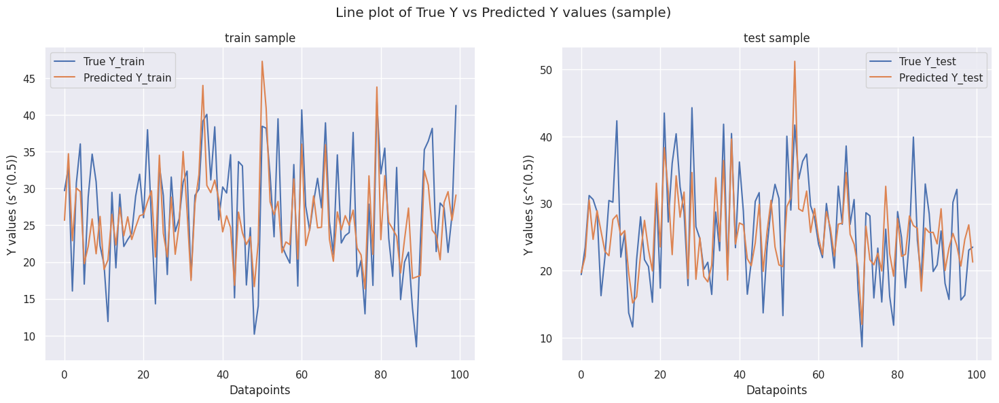

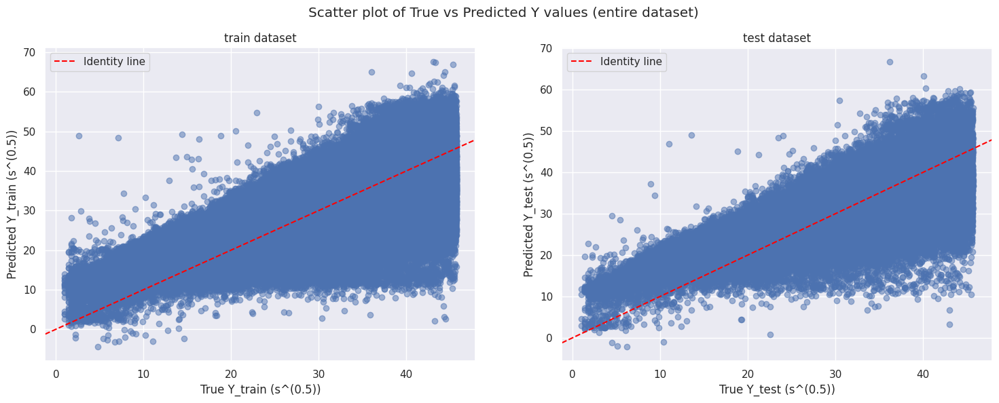

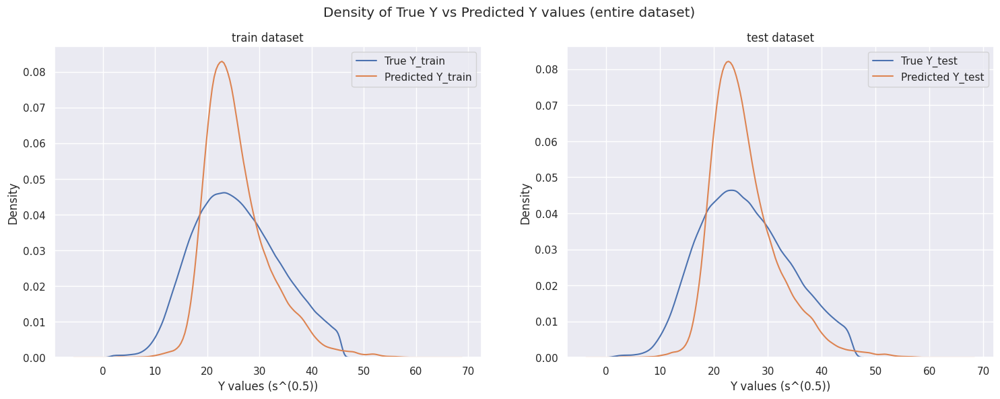

In [ ]:
# Prediction evaluation plots
plot_preds(sample_size = 100, Y_true = [Y_train, Y_test], Y_pred = [lr_outputs['Train preds'], lr_outputs['Test preds']])

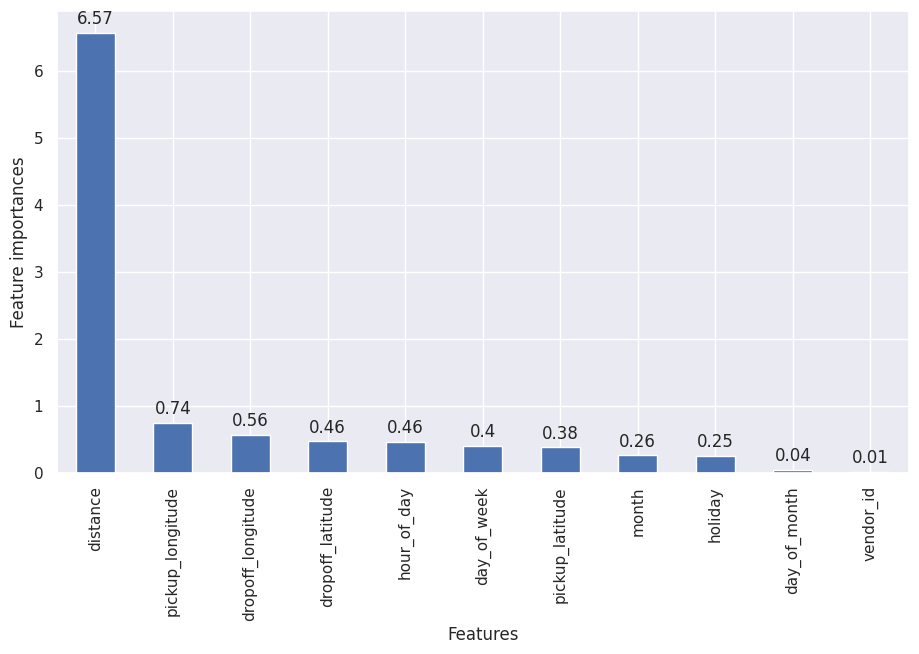

In [ ]:
# Displaying feature importances
lr_importances = pd.Series(abs(lr_outputs['Model'].coef_), index = X_train.columns)
plt.figure(figsize = (11, 6))
ax = lr_importances.sort_values(ascending = False).plot(kind = 'bar')
ax.set(xlabel = 'Features', ylabel = 'Feature importances')
display_vals(ax)

The following results can be observed from the Linear Regression model:
*   **Train RMSE of 28.321s<sup>-2</sup> and Test RMSE of 28.3118s<sup>-2</sup>**
*   **Train R<sup>2</sup> of 0.5814 and Test R<sup>2</sup> of 0.58331**
*   As expected, the Adjusted R<sup>2</sup> score is very similar to the R<sup>2</sup>.
*   A test score higher than train score is not uncommon. Since the value is only very slightly higher than the train score, the reasons for this could be the test set having a different distribution of data than the training set, or the model performing better on the test set due to chance.
*   **As reflected from the R<sup>2</sup> score, the density, scatter and line plots of predicted and true values of trip duration are not particularly much similar to each other.**
*   **Distance is the most important feature for taxi trip duration, while the vendor id is the least important**

### ML Model - 2 - Lasso Regularized Linear model

In [ ]:
# Fitting the regression model
reg = Lasso()
param_lasso = {'alpha' : [0.00001, 0.001, 0.1, 1]}
l1r_outputs = train_model(inputs, reg, param_lasso, gs = True)

Best model parameters: {'alpha': 1e-05}

Train Scores:
RMSE: 28.321849905081937
r2_score: 0.5814483267475563
Adjusted r2_score: 0.5814441502634199

Test Scores:
RMSE: 28.311828790695508
r2_score: 0.5833166291678007
Adjusted r2_score: 0.583299997274021


Time taken to train the model: 6.54 seconds


In [ ]:
# Appending the model fitting time and scores
times.append(l1r_outputs['Time'])
scores.update_dict(l1r_outputs['Train scores'], l1r_outputs['Test scores'])

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

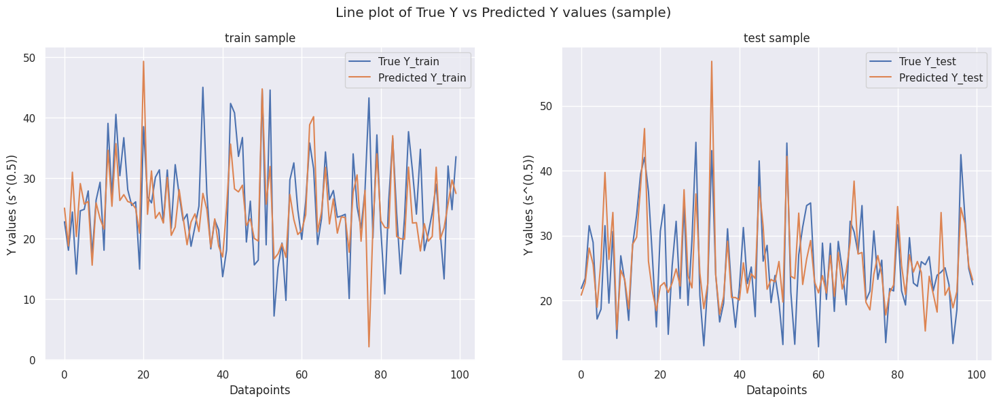

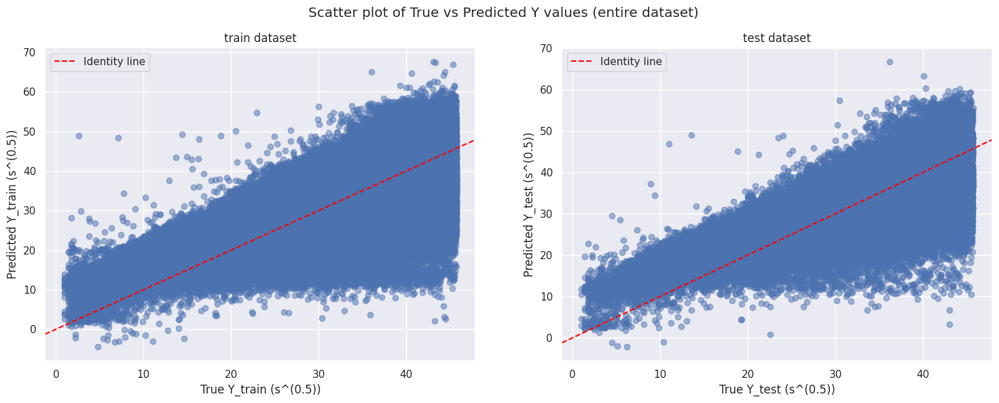

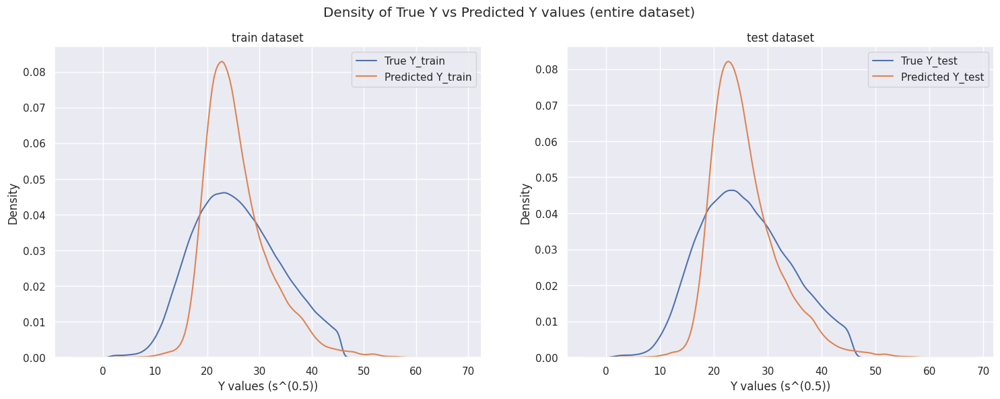

In [ ]:
# Prediction evaluation plots
plot_preds(sample_size = 100, Y_true = [Y_train, Y_test], Y_pred = [l1r_outputs['Train preds'], l1r_outputs['Test preds']])

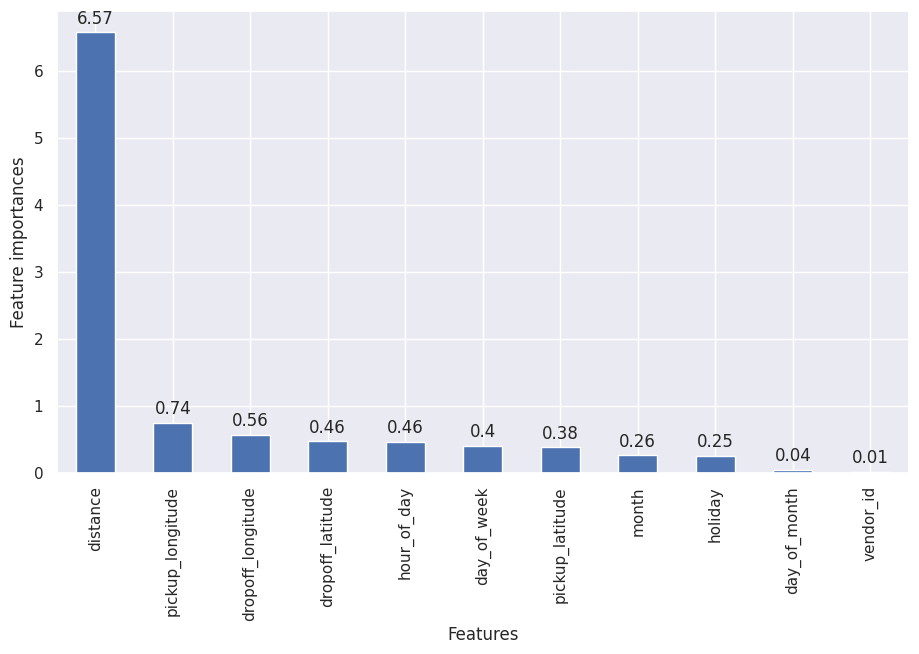

In [ ]:
# Displaying feature importances
l1r_importances = pd.Series(abs(l1r_outputs['Model'].coef_), index = X_train.columns)
plt.figure(figsize = (11, 6))
ax = l1r_importances.sort_values(ascending = False).plot(kind = 'bar')
ax.set(xlabel = 'Features', ylabel = 'Feature importances')
display_vals(ax)

The following results can be observed from the Lasso regularized linear regression model:
*   **Train and Test R<sup>2</sup> and RMSE are very similar to the Linear Regression model. No effect of the regularization can be observed**
*   The effect of Hyperparameter tuning produced with a best tuning parameter of 1E-5.
*   As in the Linear Regression model, **distance is the most important feature for taxi trip duration, while the vendor id is the least important**

### ML Model - 3 - Ridge Regression

In [ ]:
# Fitting the regression model
reg = Ridge()
param_ridge = {'alpha' : [0.000001, 0.00001, 0.001, 0.1, 1, 10]}
l2r_outputs = train_model(inputs, reg, param_ridge, gs = True)

Best model parameters: {'alpha': 10}

Train Scores:
RMSE: 28.321849908690606
r2_score: 0.581448326694226
Adjusted r2_score: 0.581444150210089

Test Scores:
RMSE: 28.311834278486558
r2_score: 0.5833165484004547
Adjusted r2_score: 0.5832999165034511


Time taken to train the model: 3.81 seconds


In [ ]:
# Appending the model fitting time and scores
times.append(l2r_outputs['Time'])
scores.update_dict(l2r_outputs['Train scores'], l2r_outputs['Test scores'])

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

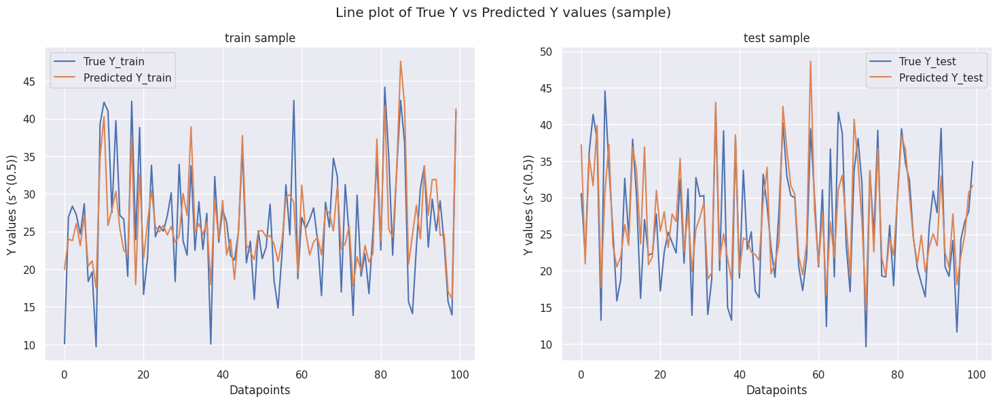

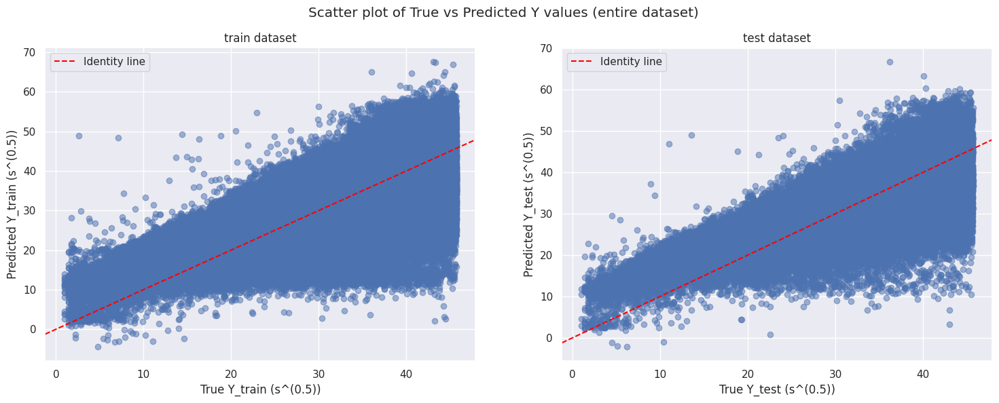

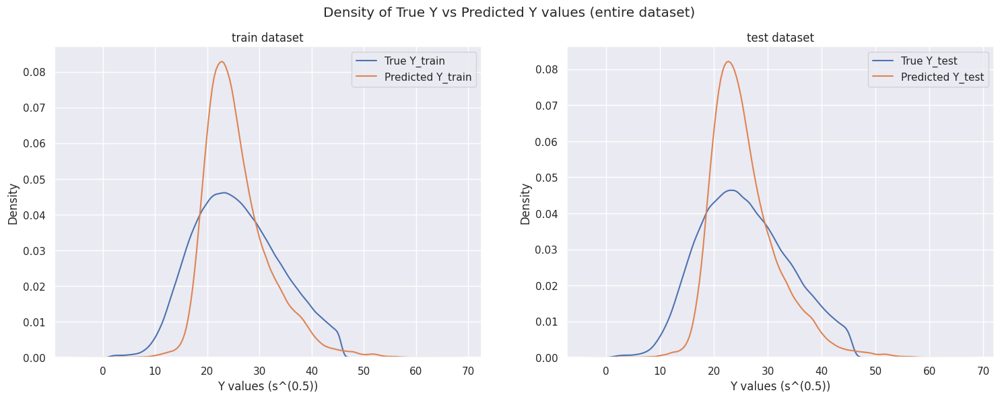

In [ ]:
# Prediction evaluation plots
plot_preds(sample_size = 100, Y_true = [Y_train, Y_test], Y_pred = [l2r_outputs['Train preds'], l2r_outputs['Test preds']])

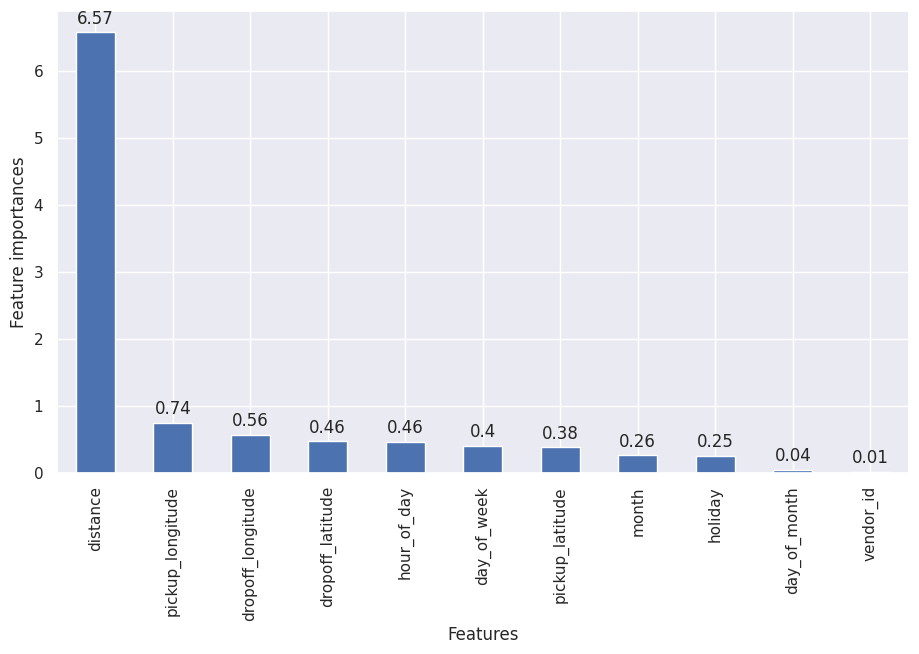

In [ ]:
# Displaying feature importances
l2_importances = pd.Series(abs(l2r_outputs['Model'].coef_), index = X_train.columns)
plt.figure(figsize = (11, 6))
ax = l2_importances.sort_values(ascending = False).plot(kind = 'bar')
ax.set(xlabel = 'Features', ylabel = 'Feature importances')
display_vals(ax)

The following results can be observed from the Ridge regularized linear regression model:
*   **Train and Test R<sup>2</sup> and RMSE are very similar to the Linear Regression model. No effect of the regularization can be observed**
*   The effect of Hyperparameter tuning produced with a best tuning parameter of 10.
*   As in the Linear Regression model, **distance is the most important feature for taxi trip duration, while the vendor id is the least important**.
*   The ridge regression model took considerably less time to run than the Lasso regression.

### ML Model - 4 - Polynomial Regression

In [ ]:
# Generating Polynomial features
poly_reg = PolynomialFeatures(degree = 2)
X_train_poly = poly_reg.fit_transform(X_train_scaled)
X_test_poly = poly_reg.transform(X_test_scaled)

# Polynomial model fitting
inputs_poly = (X_train_poly, X_test_poly, Y_train, Y_test)
reg = LinearRegression()
pr_outputs = train_model(inputs_poly, reg)

Train Scores:
RMSE: 23.41887396830096
r2_score: 0.6539064744015313
Adjusted r2_score: 0.6538819846971675

Test Scores:
RMSE: 23.406191754840528
r2_score: 0.6555160406325631
Adjusted r2_score: 0.6554185165096145


Time taken to train the model: 5.43 seconds


In [ ]:
# Appending the model fitting time and scores
times.append(pr_outputs['Time'])
scores.update_dict(pr_outputs['Train scores'], pr_outputs['Test scores'])

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

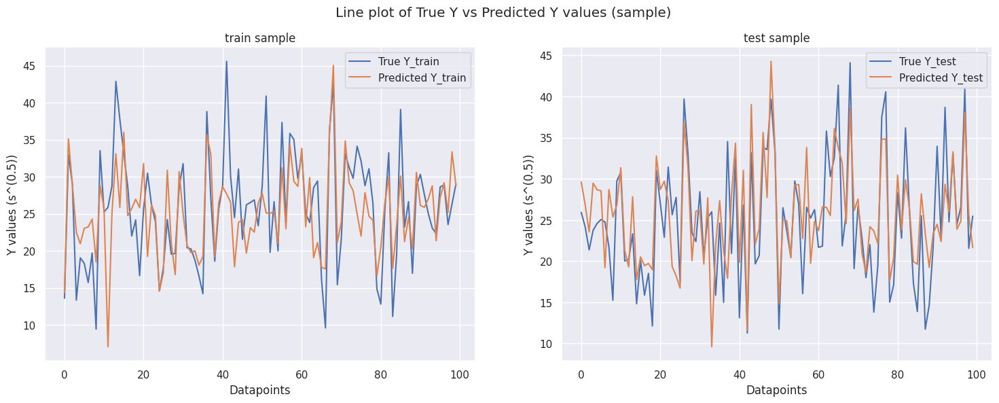

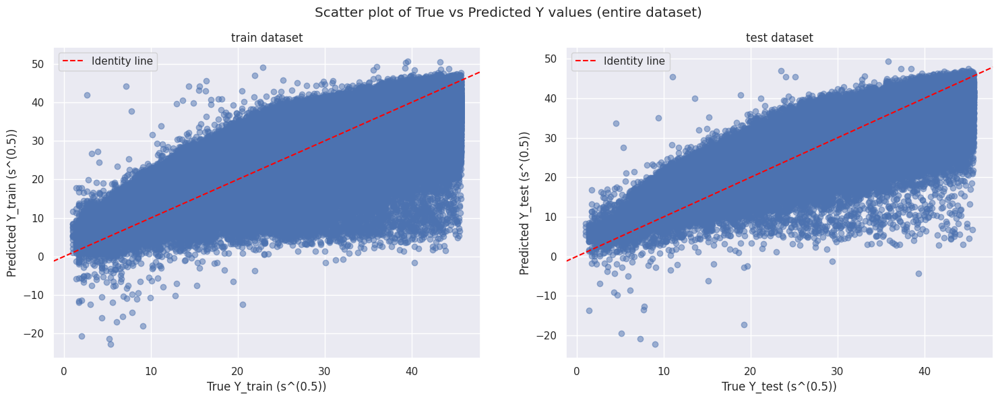

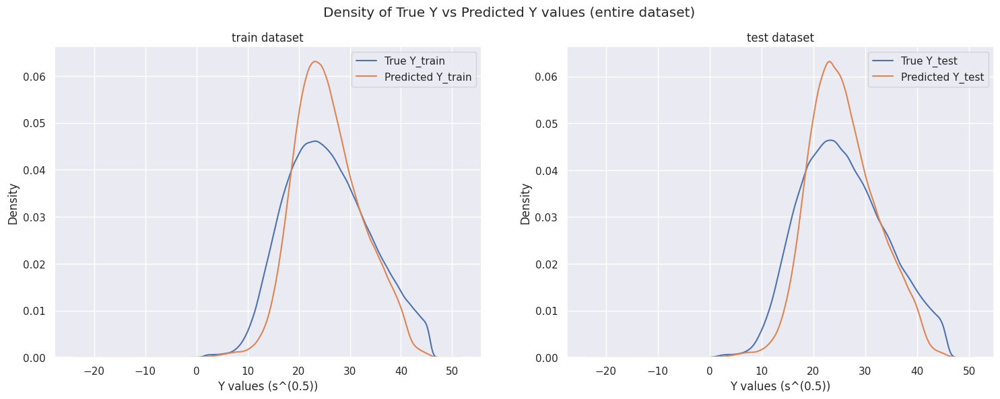

In [ ]:
# Prediction evaluation plots
plot_preds(sample_size = 100, Y_true = [Y_train, Y_test], Y_pred = [pr_outputs['Train preds'], pr_outputs['Test preds']])

The following results can be observed from the Linear Regression model:
*   **Train RMSE of 23.4188s<sup>-2</sup> and Test RMSE of 23.4062s<sup>-2</sup>** - considerably less than Linear Regression model.
*   **Train R<sup>2</sup> of 0.6539 and Test R<sup>2</sup> of 0.655** - again, showing improvement from the Linear model.
*   The density plot has improved from the linear model, as also the scatter plot. But there are several predictions which have a high negative value of the trip_duration which can is unrealistic considering time can't be negative, and that the variable has been transformed using the square-root.
*   Tuning the hyperparameter of **number of degrees** of the Polynomial model has not been implemented here, since it requires large amounts of processing power from the third degree onwards; the polynomial features extracted increase exponentially as the degrees increase.
*   The model implementation time also has increased significantly from the linear model, as expected from the second degree of fitting.

### ML Model - 5 - Decision Tree

In [ ]:
# Decision Tree fitting
reg = DecisionTreeRegressor()
param_dt = {'max_depth' : [20, 25], 'min_samples_split' : [40, 60, 80]}
dt_outputs = train_model(inputs, reg, param_dt, gs = True)

Best model parameters: {'max_depth': 20, 'min_samples_split': 80}

Train Scores:
RMSE: 13.972282601530518
r2_score: 0.7935119958044391
Adjusted r2_score: 0.7935099353805322

Test Scores:
RMSE: 18.102459943421195
r2_score: 0.7335744686313389
Adjusted r2_score: 0.7335638342709394


Time taken to train the model: 246.24 seconds


In [ ]:
# Appending the model fitting time and scores
times.append(dt_outputs['Time'])
scores.update_dict(dt_outputs['Train scores'], dt_outputs['Test scores'])

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

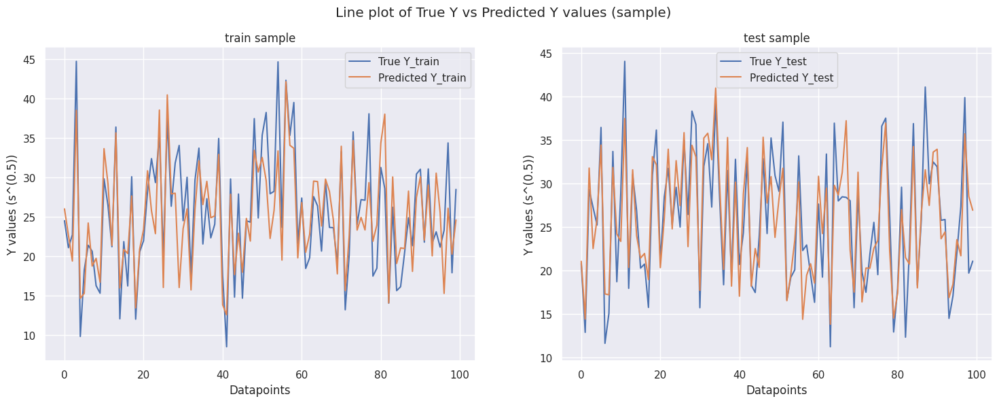

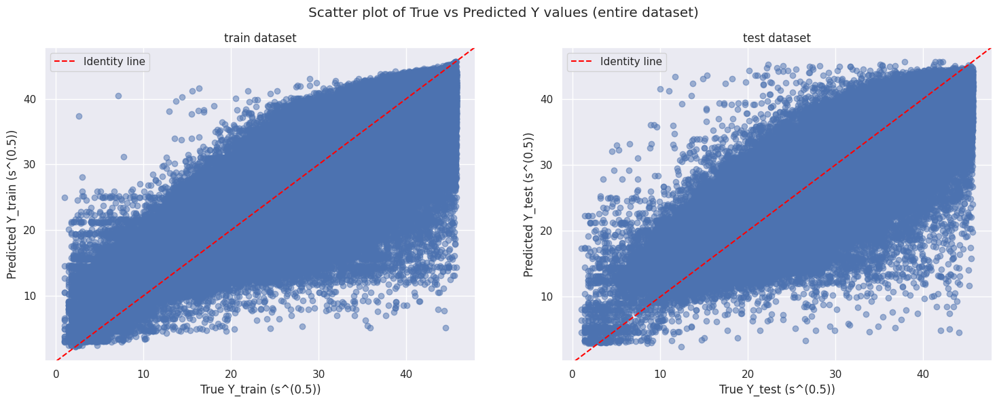

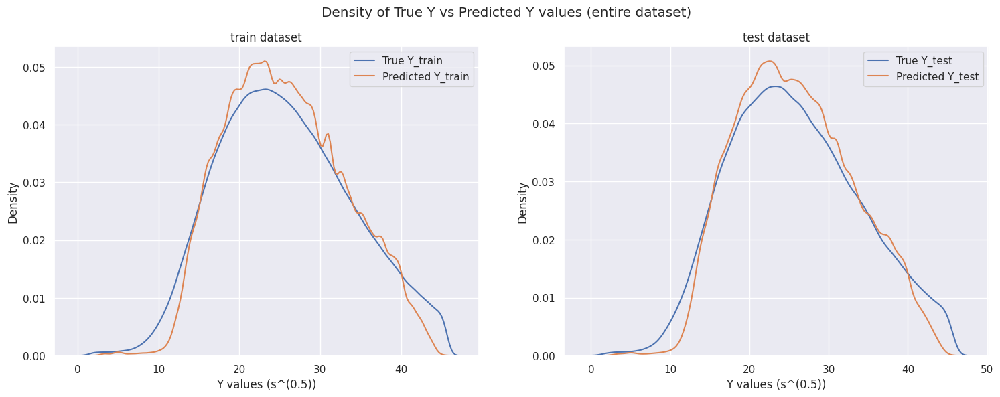

In [ ]:
# Prediction evaluation plots
plot_preds(sample_size = 100, Y_true = [Y_train, Y_test], Y_pred = [dt_outputs['Train preds'], dt_outputs['Test preds']])

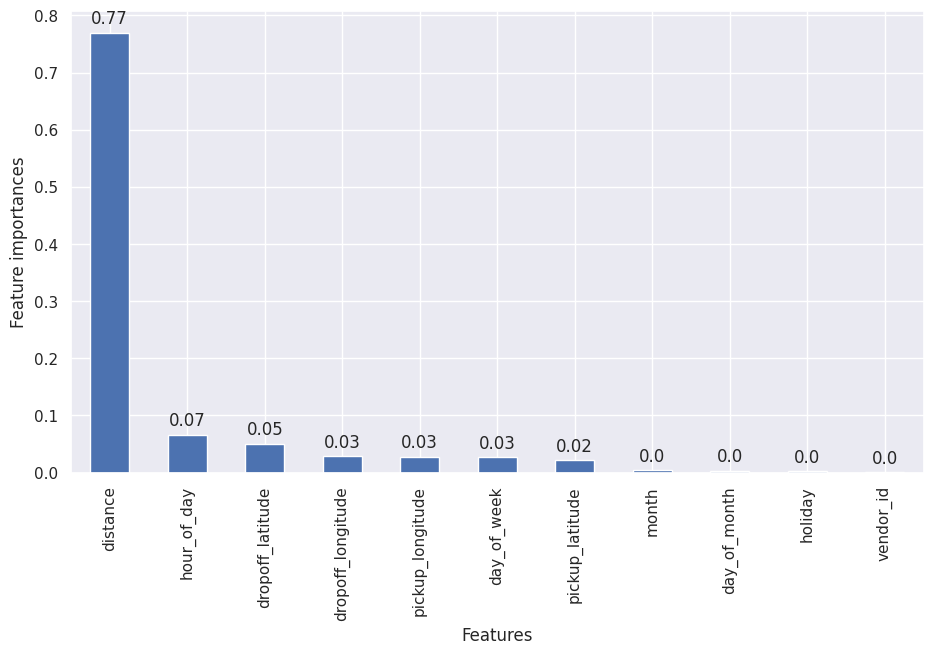

In [ ]:
# Displaying the Feature importances
dt_importances = pd.Series(dt_outputs['Model'].feature_importances_, index = X_train.columns)
plt.figure(figsize = (11, 6))
ax = dt_importances.sort_values(ascending = False).plot(kind = 'bar')
ax.set(xlabel = 'Features', ylabel = 'Feature importances')
display_vals(ax)

In [ ]:
# Exporting the decision tree
graph = Source(export_graphviz(dt_outputs['Model'], out_file = None, feature_names = X_train.columns, filled = True))
# graph.render(filename = 'decision_tree.pdf', directory = path_misc, format = 'jpg')

The following results can be observed from the Decision Tree model:
*   **Train RMSE of 13.972s<sup>-2</sup> and Test RMSE of 18.093s<sup>-2</sup>**
*   **Train R<sup>2</sup> of 0.795 and Test R<sup>2</sup> of 0.734**
*   Both of the above scores show significant improvement from the Linear and polynomial models.
*   As reflected from the scores, the line, scatter and density plots of the predicted values have shown significant improvement from the linear and polynomial models.
*   According to the Decision Tree model as well, **distance is the most important feature for taxi trip duration, while the vendor id is the least important**.
*   The Decision Tree took considerably longer to implement, with about 246.24 seconds of wall time, or ~4 minutes.

### ML Model - 6 - LightGBM

In [ ]:
# Fitting the LightGBM model
reg = lgb.LGBMRegressor()
param_lgb = {'num_leaves': [63, 127], 'learning_rate': [0.1], 'n_estimators': [200, 400], 'max_depth': [15]}
lgb_outputs = train_model(inputs, reg, param_lgb, gs = True)

Best model parameters: {'learning_rate': 0.1, 'max_depth': 15, 'n_estimators': 400, 'num_leaves': 127}

Train Scores:
RMSE: 12.051112010882376
r2_score: 0.8219038264233451
Adjusted r2_score: 0.8219020493050316

Test Scores:
RMSE: 13.053452410886003
r2_score: 0.8078839557918908
Adjusted r2_score: 0.8078762874905754


Time taken to train the model: 379.58 seconds


In [ ]:
# Appending the model fitting time and scores
times.append(lgb_outputs['Time'])
scores.update_dict(lgb_outputs['Train scores'], lgb_outputs['Test scores'])

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

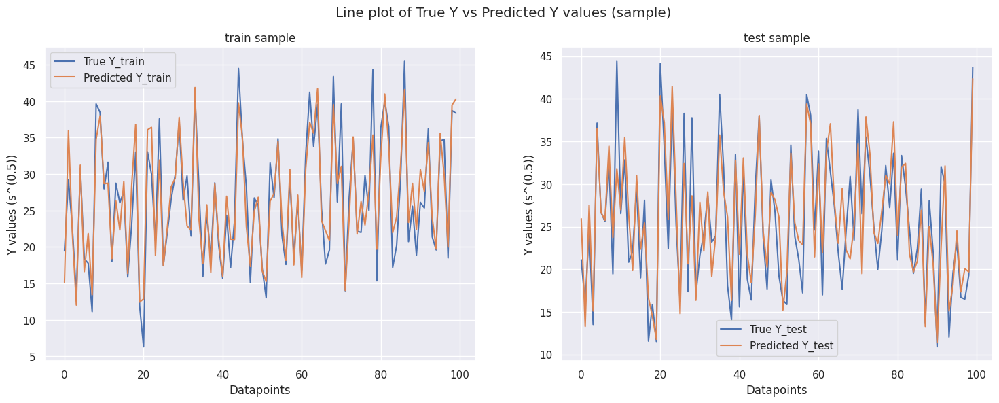

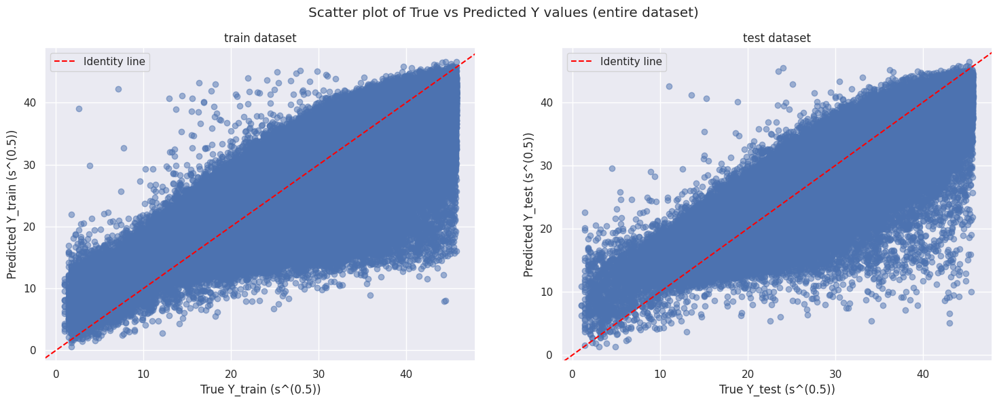

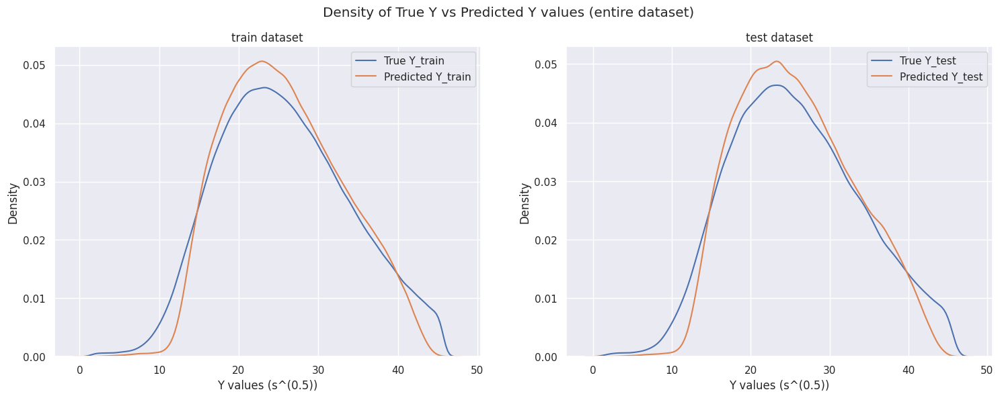

In [ ]:
# Prediction evaluation plots
plot_preds(sample_size = 100, Y_true = [Y_train, Y_test], Y_pred = [lgb_outputs['Train preds'], lgb_outputs['Test preds']])

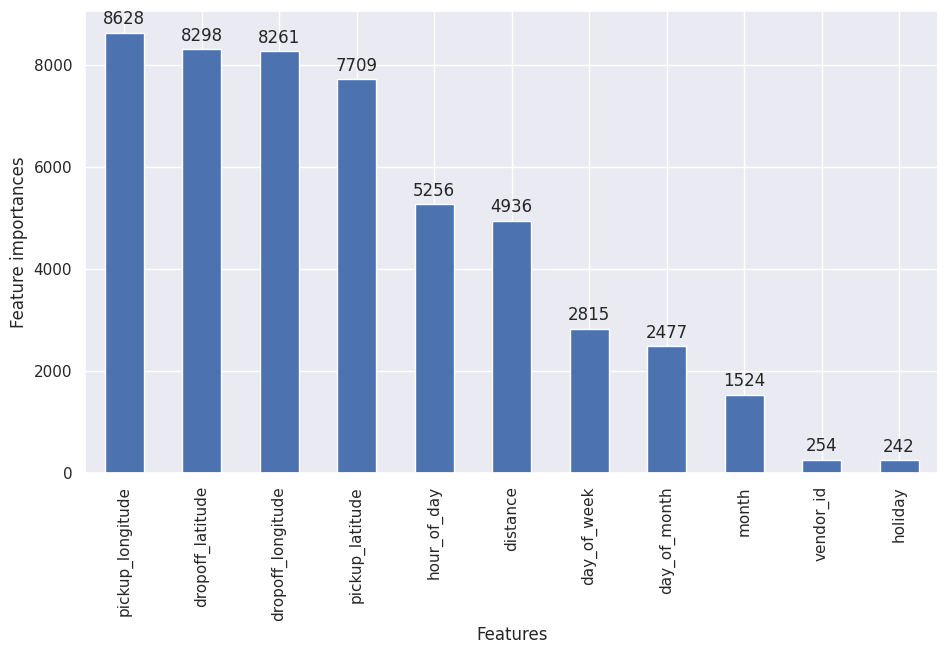

In [ ]:
# Displaying the Feature importances
lgb_importances = pd.Series(lgb_outputs['Model'].feature_importances_, index = X_train.columns)
plt.figure(figsize = (11, 6))
ax = lgb_importances.sort_values(ascending = False).plot(kind = 'bar')
ax.set(xlabel = 'Features', ylabel = 'Feature importances')
display_vals(ax)

The following results can be observed from the LightGBM model:
*   **Train RMSE of 12.05s<sup>-2</sup> and Test RMSE of 13.053s<sup>-2</sup>**
*   **Train R<sup>2</sup> of 0.822 and Test R<sup>2</sup> of 0.807**
*   Both of the above scores show significant improvement from the Decision Tree model. This is also reflected in the evaluation plots.
*   There is a slight difference in the feature importances according to LightGBM model. **pickup_longitude is the most important feature for taxi trip duration followed by the rest of the pickup and dropoff coordinates. distance** (which is predicted as the most important by all the previous models) **lies 6th in feature importances. vendor_id and holiday are among the least important**.
*   The LightGBM model took longer time to implement than the Decision Tree model, with 379.6 seconds of wall time, or ~6.5 minutes.

### ML Model - 7 - XGBoost

In [ ]:
pip install xgboost

In [ ]:
import xgboost as xgb

In [ ]:
with open('inputs.pkl', 'rb') as f:
    inputs = pickle.load(f)

# Fitting XGBoost
reg = xgb.XGBRegressor()
param_xg = {'max_depth' : [15], 'learning_rate' : [0.1], 'n_estimators' : [100]}
xgb_outputs = train_model(inputs, reg, param_xg, gs = True)

Best model parameters: {'learning_rate': 0.1, 'max_depth': 15, 'n_estimators': 100}

Train Scores:
RMSE: 5.952392550048216
r2_score: 0.9120331521412725
Adjusted r2_score: 0.9120322743711712

Test Scores:
RMSE: 12.687641622775336
r2_score: 0.8132678281444542
Adjusted r2_score: 0.813260374740107


Time taken to train the model: 1634.33 seconds


In [ ]:
# Saving/Reading the outputs from XGBoost model in/from a pickle file
read_ = True

if read_ == False:
    with open('xgb_outputs.pkl', 'wb') as f:
        pickle.dump(xgb_outputs, f)
elif read_ == True:
    with open(path_misc + 'xgb_outputs.pkl', 'rb') as f:
        xgb_outputs = pickle.load(f)

[04:13:11] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.



In [ ]:
# Appending the model fitting time and scores
times.append(xgb_outputs['Time'])
scores.update_dict(xgb_outputs['Train scores'], xgb_outputs['Test scores'])

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

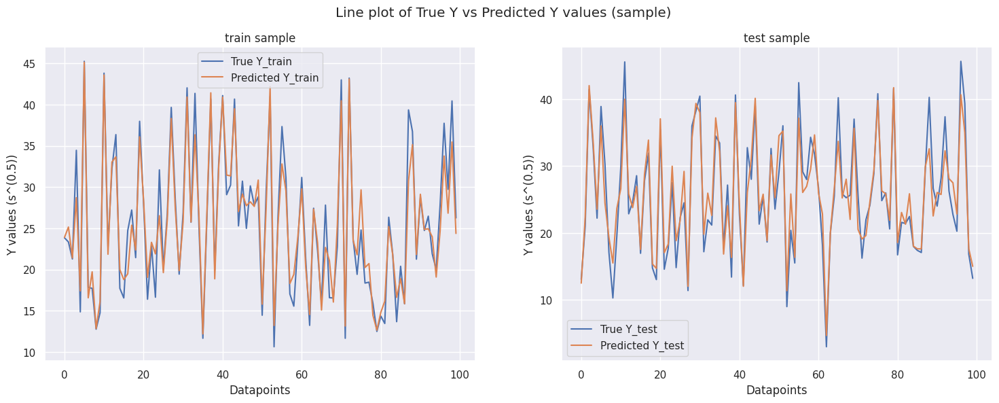

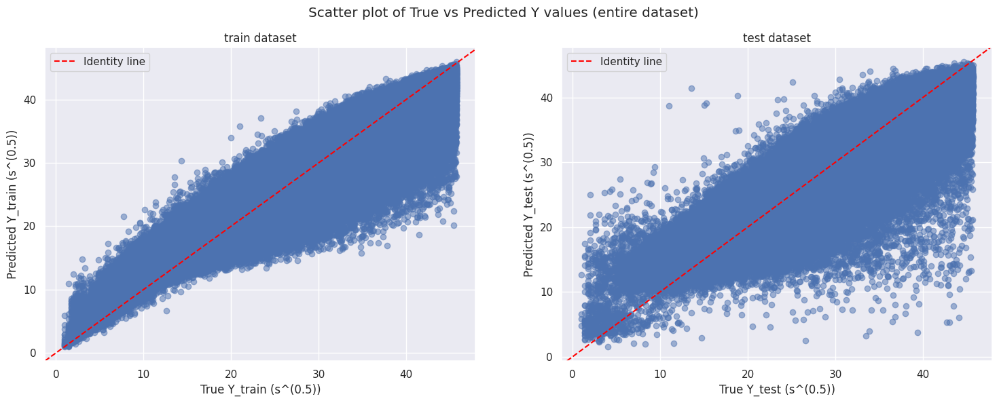

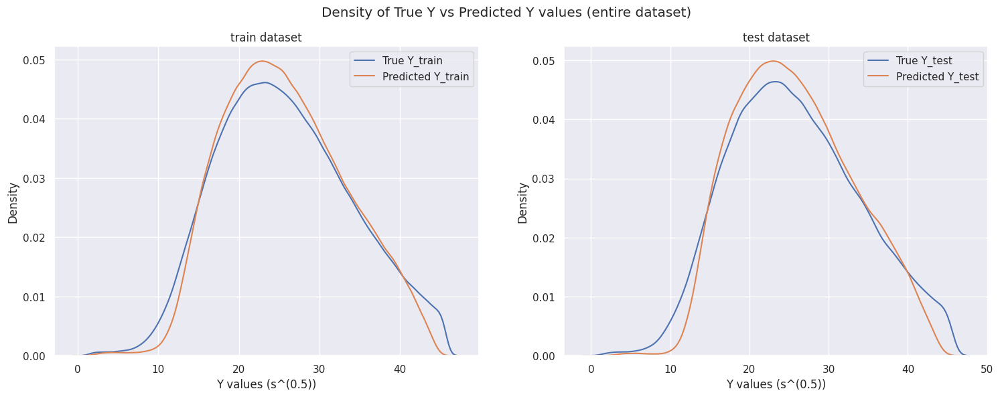

In [ ]:
# Prediction evaluation plots
plot_preds(sample_size = 100, Y_true = [Y_train, Y_test], Y_pred = [xgb_outputs['Train preds'], xgb_outputs['Test preds']])

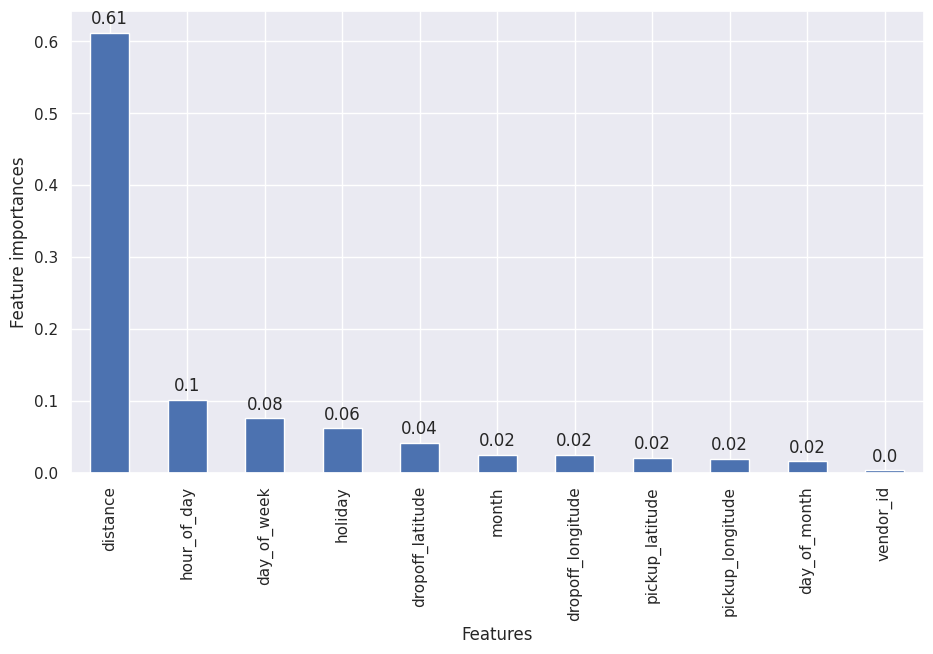

In [ ]:
# Displaying the Feature importances
xgb_importances = pd.Series(xgb_outputs['Model'].feature_importances_, index = X_train.columns)
plt.figure(figsize = (11, 6))
ax = xgb_importances.sort_values(ascending = False).plot(kind = 'bar')
ax.set(xlabel = 'Features', ylabel = 'Feature importances')
display_vals(ax)

The following results can be observed from the XGBoost model:
*   **Train RMSE of 5.952s<sup>-2</sup> and Test RMSE of 12.687s<sup>-2</sup>**
*   **Train R<sup>2</sup> of 0.912 and Test R<sup>2</sup> of 0.8132**
*   Both of the above scores show significant improvement from the Linear, polynomial and Decision Tree models, and slightly better performance than the LightGBM model.
*   As reflected from the scores, the line plot of the predicted values follows the true values much better than the Decision Tree model.
*   Also, the scatter plot shows much better alignment with the identity line than the previous models. As is characteristic of the XGBoost (since it is a Tree algorithm), the predictions are within the range of true values and no negative predictions are present.
*   The density plot of the predicted values also follows much more similarly to the distribution of the true values.
*   According to the XGBoost as well, **distance is the most important feature for taxi trip duration, while the vendor id is the least important**. Distance is followed by **hour of the day**, **day of the week** and **holiday** as the most important predictors.
*   The hyperparameter tuning of this model was not performed in this notebook. It was carried out in isolation for several factors to arrive at the best values of learning rate, max_depth and n_estimators.
*   The XGBoost took even longer than the Decision tree and LightGBM to implement, with about 1634 seconds of wall time, or ~30 minutes. **But this was performed in a (temporarily available) higher computational performance machine, that too with only the 5-fold cross-validation and no Hyperparameter Tuning.**

### ML Model - 8 - Stacking XGBoost and LightGBM

In [ ]:
# Stacking the XGBoost and LightGBM
base_models = [('XGBoost', xgb_outputs['Model']), ('LightGBM', lgb_outputs['Model'])]
meta_model = DecisionTreeRegressor()
stack_reg = StackingRegressor(estimators = base_models, final_estimator = meta_model)
stack_outputs = train_model(inputs, stack_reg)

Train Scores:
RMSE: 22.766780033727347
r2_score: 0.6635433804775211
Adjusted r2_score: 0.6635400231722615

Test Scores:
RMSE: 25.829008611110652
r2_score: 0.6198578886268019
Adjusted r2_score: 0.6198427152753795


Time taken to train the model: 1986.64 seconds


In [ ]:
# Saving/Reading the outputs from Stacked model in/from a pickle file
read_ = False

if read_ == False:
    with open(path_misc + 'stack_outputs.pkl', 'wb') as f:
        pickle.dump(stack_outputs, f)
elif read_ == True:
    with open(path_misc + 'stack_outputs.pkl', 'rb') as f:
        stack_outputs = pickle.load(f)

In [ ]:
# Appending the model fitting time and scores
times.append(stack_outputs['Time'])
scores.update_dict(stack_outputs['Train scores'], stack_outputs['Test scores'])

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

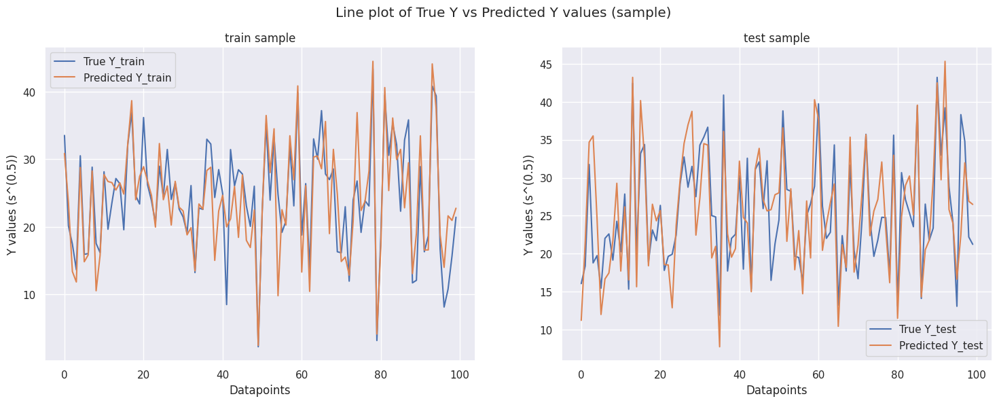

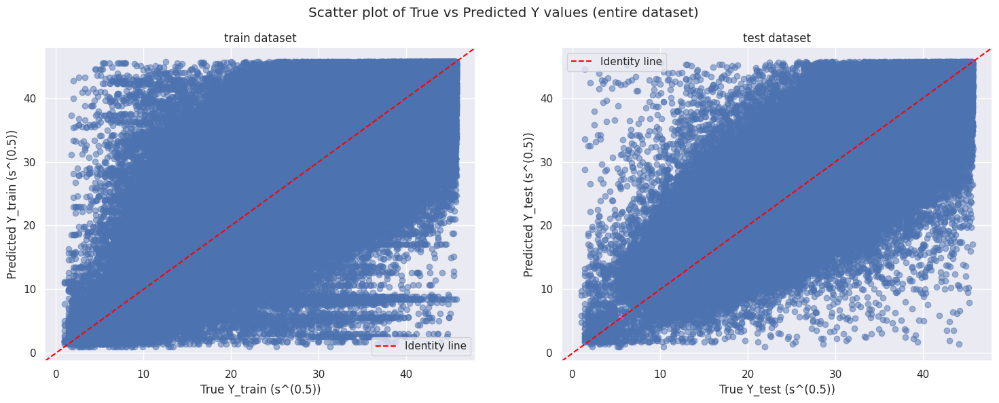

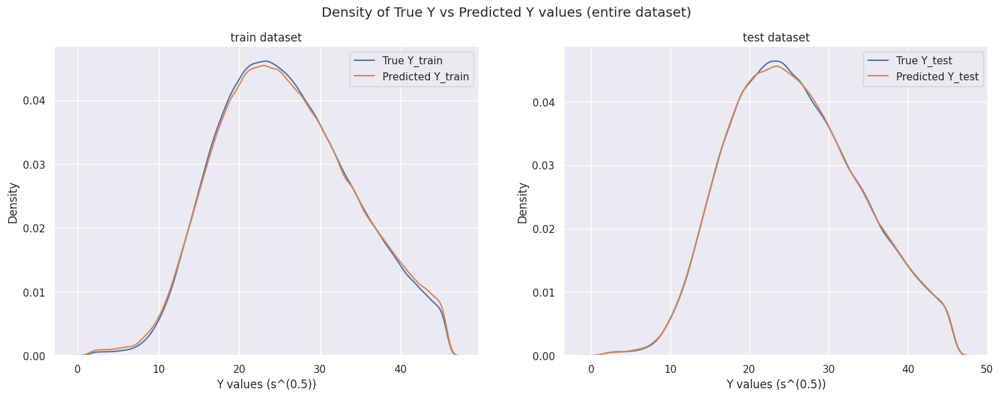

In [ ]:
# Prediction evaluation plots
plot_preds(sample_size = 100, Y_true = [Y_train, Y_test], Y_pred = [stack_outputs['Train preds'], stack_outputs['Test preds']])

In [ ]:
1986/60

33.1

The following results can be observed from the Stacking model:
*   **Train RMSE of 22.766s<sup>-2</sup> and Test RMSE of 25.83s<sup>-2</sup>**
*   **Train R<sup>2</sup> of 0.663 and Test R<sup>2</sup> of 0.62**
*   Both of the above scores show significant reduction compared to both the LightGBM and XGBoost.
*   **Despite having a near identical density plots for true and predicted values of train and test dataset, it is not reflected in the scatter plot or the model scores.** This is because, while the density plot provides an overview of the distribution, it does not capture the individual discrepancies between the predicted and true values. **It is possible that the model is making consistent errors across the data points, resulting in poor performance in terms of R<sup>2</sup> and RMSE scores, despite the overall similarity in the density plots.**
*   The Stacking algorithm took even longer than the XGBoost and LightGBM to implement despite the absence of Hyperparameter tuning, with about 1986 seconds of wall time, or ~35 minutes. Due to unavailability of higher performance machines, this was not further proceeded.

### 1. Which Cross-Validation & Hyperparameter Optimization technique have you used and why?

*   For regression tasks, **k-fold cross-validation** is commonly used and provides a good balance between performance estimation and computational efficiency. It leverages multiple iterations and allows for better utilization of the available data. Also, it is often used alongside Hyperparameter Tuning. By evaluating the model on different folds and averaging the results, one can better understand how different hyperparameter settings affect model performance, and hence help in selecting the optimal hyperparameters for the model.

*   The **GridSearchCV** method has been used in this analysis, since the maximum time taken up by a model for training was not very high. Even in the case of **XGBoost**, each combination of Hyperparameter settings took a long time to train, and hence limited number of hyperparameter combinations were utilised instead of resorting to **RandomSearchCV**.

### 2. Which Evaluation metrics did you consider for a positive business impact and why?

The **RMSE (Root-Mean-Squared Error)**, **R<sup>2</sup>** and the **Adjusted R<sup>2</sup>** score were together utilised for evaluation of each of the regression models.
*   **RMSE** measures the average magnitude of the residuals (i.e., the difference between the predicted and actual values). It gives an idea of how close the the predicted values are to the actual values. A lower RMSE indicates a better model performance. In this case, the RMSE is chosen over the MSE for better interpretability since RMSE maintains the same units as the actual values. It is given by

\begin{align}
RMSE = \sqrt{\frac{\sum_{i=1}^N(y_t(i)-y_p(i))^2}{N}}
\end{align}
>where $y_t(i)$ and $y_p(i)$ are the true and predicted values respectively.

*   The **R<sup>2</sup>** score, also called the **coefficient of determination**, represents the proportion of variance in the dependent variable (trip duration) that is predictable from the independent variables used in the model. It ranges from 0 to 1, the latter indicating a perfect fit (i.e., all variance is explained by the independent variables). A higher $R^2$ hence indicates a better model performance.

*   **Adjusted R<sup>2</sup>**, as the name suggests, is an adjusted version of R<sup>2</sup> score that takes into account the number of predictors (independent variables) in the model. It penalises unnecessary predictors, and hence is useful to identify presence of redundant features. It is calculated from the $R^2$ as follows:

\begin{align}
R_{adjusted} = 1-\frac{(1-R^2)(N-1)}{N-p-1}
\end{align}

> where $p$ is the number of predictors and $N$ is the total sample size.
As the equation indicates, $R_{adjusted}$ and $R^2$ are expected to remain the same for very high values of $N$


### 3. Which ML model did you choose from the above created models as your final prediction model and why?

#### 3.1. Model selection

In [ ]:
# Creating a dataframe from the RMSE, R2 score and model implementation times
model_names = ['Linear Regression', 'Lasso', 'Ridge', 'Polynomial Regression', 'Decision Tree', 'LightGBM', 'XGBoost', 'Stacking']
model_metrics = pd.DataFrame(scores.dict_, index = model_names)
model_metrics['runtime'] = times

# model_metrics.to_csv(path_misc + 'model_metrics.csv')
styler_list = [
                {'selector': 'th','props': [('border', '2px solid black')]},
                {'selector': 'td','props': [('border', '2px solid black')]}
              ]
styler = model_metrics.style.set_table_styles(styler_list)
display(styler)

,rmse_train,r2_train,adj_r2_train,rmse_test,r2_test,adj_r2_test,runtime
Linear Regression,28.321850,0.581448,0.581444,28.311827,0.583317,0.583300,0.427053
Lasso,28.321850,0.581448,0.581444,28.311829,0.583317,0.583300,6.543669
Ridge,28.321850,0.581448,0.581444,28.311834,0.583317,0.583300,3.810947
Polynomial Regression,23.418874,0.653906,0.653882,23.406192,0.655516,0.655419,5.429366
Decision Tree,13.972283,0.793512,0.793510,18.102460,0.733574,0.733564,246.243221
LightGBM,12.051112,0.821904,0.821902,13.053452,0.807884,0.807876,379.578703
XGBoost,5.952393,0.912033,0.912032,12.687642,0.813268,0.813260,1634.325324
Stacking,22.766780,0.663543,0.663540,25.829009,0.619858,0.619843,1986.644313


In [ ]:
model_metrics.to_csv(path_misc + 'model_scores.csv')

In [ ]:
# Checking the difference between r2 and adjr2 test scores
model_metrics['r2_test'] - model_metrics['adj_r2_test']

Linear Regression        0.000017
Lasso                    0.000017
Ridge                    0.000017
Polynomial Regression    0.000098
Decision Tree            0.000011
LightGBM                 0.000008
XGBoost                  0.000007
Stacking                 0.000015
dtype: float64

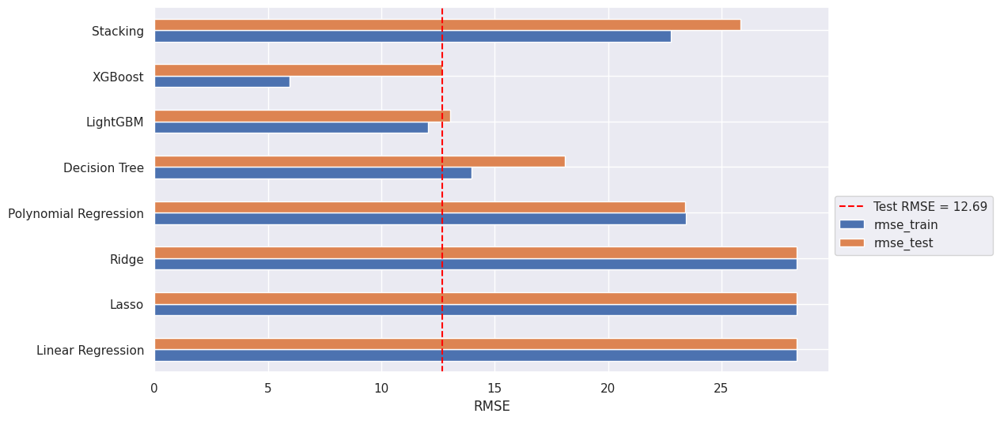


The model with minimum Test RMSE is the XGBoost model
Best model test RMSE score = 12.688


In [ ]:
# Function to choose optimum model based on score metric
def choose_opt_model(metric, metric_df, equality = 'max'):
  '''Returns a plot of train and test scores of the metric for the different models used,
  and the best model based on the best scoring test metric.
  Inputs include the metric name, dataframe of all metric scores and equality - whether max or min is best scoring'''
  metrics_list = [metric.lower() + '_train', metric.lower() + '_test']
  metric_df[metrics_list].plot(kind = 'barh', figsize = (11, 6))
  best_test_metric = getattr(metric_df[metrics_list[1]], equality)()
  plt.xlabel(metric.upper())
  plt.axvline(best_test_metric, color = 'red', linestyle = '--', label = f'Test {metric.upper()} = {round(best_test_metric, 2)}')
  plt.legend(bbox_to_anchor = (1, 0.5))
  plt.show()

  best_model = metric_df[metric_df[metrics_list[1]] == best_test_metric].index[0]
  print(f'\nThe model with {equality}imum Test {metric.upper()} is the {best_model} model\nBest model test {metric.upper()} score = {round(best_test_metric, 3)}')

# Choosing best model based on RMSE
choose_opt_model('RMSE', model_metrics, 'min')

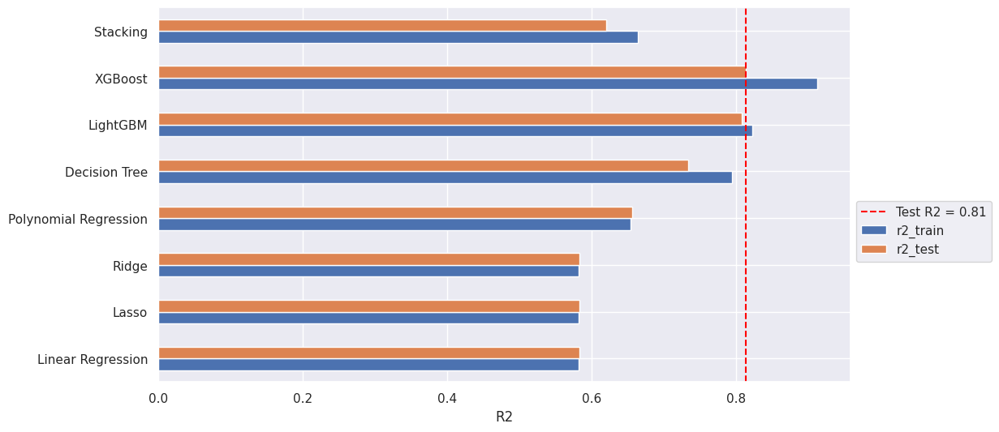


The model with maximum Test R2 is the XGBoost model
Best model test R2 score = 0.813


In [ ]:
# Choosing best model based on R2
choose_opt_model('R2', model_metrics, 'max')

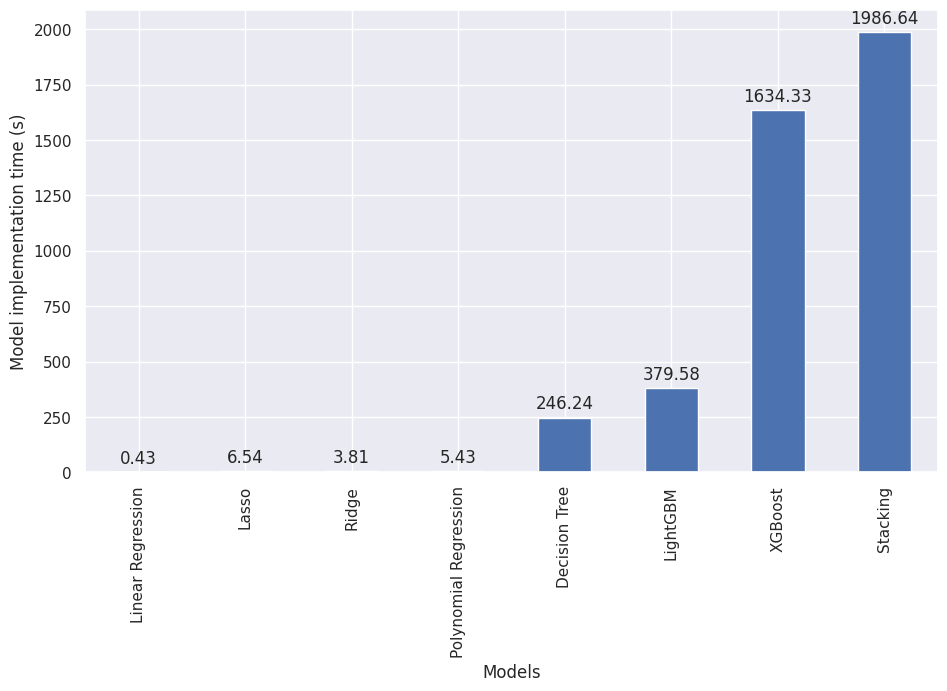

In [ ]:
plt.figure(figsize = (11, 6))
ax = model_metrics['runtime'].plot(kind = 'bar')
ax.set(xlabel = 'Models', ylabel = 'Model implementation time (s)')
display_vals(ax)

*   Based on the **Test RMSE** and **R<sup>2</sup>** scores, the **XGBoost** is the best performing model. It has the least Test RMSE and the highest Test R<sup>2</sup> of 12.69 and 0.813 respectively. There is little difference between the adjusted R<sup>2</sup> and R<sup>2</sup> scores, hence only one of them is utilised for evaluation.
*   On comparing the model run-times, the Stacking algorithm was very computationaly expensive despite providing mediocre results.
*   **While the LightGBM model had much less computational cost than XGBoost while also maintaining similar Test scores, it was not chosen since it showed a deviation from all the other models with respect to the feature importances**. The LightGBM judged the pickup and dropoff coordinates as the most important, while distance (which was deemed the most important by all the other models) was placed sixth. Hence, the XGBoost was chosen.
*   Also, the XGBoost edged out the LightGBM on the basis of the much superior training scores, which provide more scope in the future for dealing with this overfitting, which has been skipped due to lack of computational resources at the moment.


#### 3.2 Input dataset selection

*   In the **[Feature Engineering](#scrollTo=pyh35XQSW4yt&line=9&uniqifier=1)** section, it was mentioned that various iterations were tested out for the ideal input dataset which can be fed into the regression models. The features in question were
  *   passenger_count (P)
  *   extreme_weather (W)
  *   holidays (H)
  *   store_and_fwd_flag (S)

*   As per the naming convention mentioned, this notebook was named **PWHS0010** since it removed passenger_count, extreme_weather and store_and_fwd_flag based on the logical reasoning provided in Feature Engineering section. It was hypothesised that this iteration will give the best regression scores.
*   Nevertheless, the rest of the iterations were also carried out to confirm this hypothesis. The maximum regression R<sup>2</sup> scores from each iteration shall be evaluated in this section, to confirm the Hypothesis and conclude the best possible input dataset for this regression problem.

In [ ]:
# Reading the maximum test r2 scores and best model of each iteration
iterations = ['1001', '0100', '0110', '1110', '0111', '1111', '1010', '0011']
filenames = ['PWHS_' + itr + '.csv' for itr in iterations]
path_itr = '/content/drive/MyDrive/ALMA BETTER/Module 4/#CAPSTONE 1 - REGRESSION/Iterations_results/'
max_scores, best_models = [], []
for itr_file in filenames:
  df_itr = pd.read_csv(path_itr + itr_file, index_col = 0)
  max_scores.append(df_itr.max().max())
  best_models.append(df_itr.T.max().idxmax())

In [ ]:
# Creating a dataframe of best r2 scores and best models
df_itr = pd.DataFrame(max_scores, index = ['PWHS' + itr for itr in iterations], columns = ['best_r2_score'])
df_itr['best_model'] = best_models
df_itr = df_itr.T

df_itr['PWHS0010'] = [model_metrics['r2_test'].max(), model_metrics['r2_test'].idxmax()]
df_itr

,PWHS1001,PWHS0100,PWHS0110,PWHS1110,PWHS0111,PWHS1111,PWHS1010,PWHS0011,PWHS0010
best_r2_score,0.810605,0.80797,0.812729,0.810986,0.812251,0.810935,0.8109,0.812411,0.813268
best_model,XGBoost,XGBoost,XGBoost,XGBoost,XGBoost,XGBoost,XGBoost,XGBoost,XGBoost


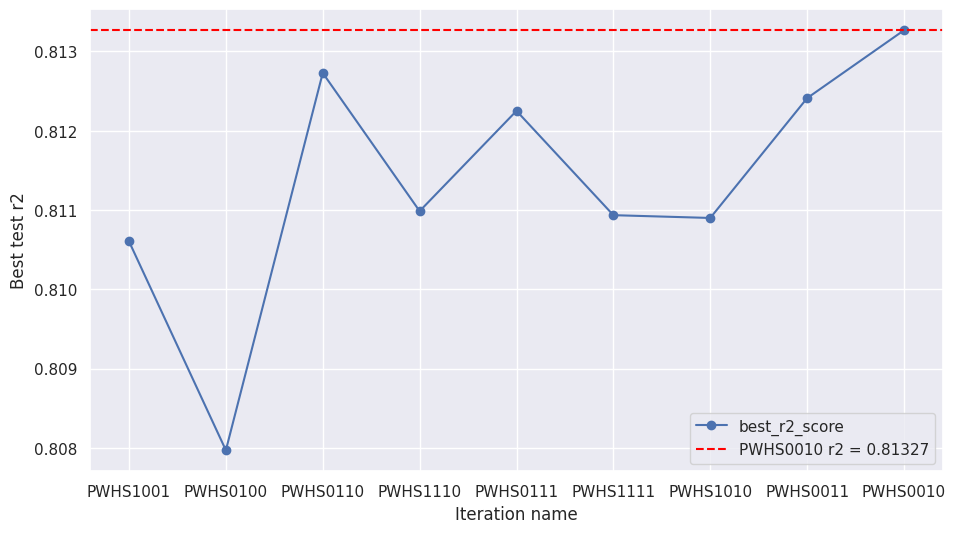

In [ ]:
# Plotting the max r2 scores for each iteration
best_itr = (df_itr.iloc[0] == df_itr.iloc[0].max()).idxmax()

plt.figure(figsize = (11, 6))
ax = df_itr.loc['best_r2_score'].plot(marker = 'o')
ax.set(xlabel = 'Iteration name', ylabel = 'Best test r2')
ax.axhline(df_itr.iloc[0].max(), color = 'red', linestyle = '--', label = f'{best_itr} r2 = {round(df_itr.iloc[0].max(), 5)}')
ax.legend()
plt.show()

Based on the above analysis, the **Hypothesis** that the current iteration (**PWHS0010**) is indeed the best input dataset for this regression problem stands true.

### 4. Explain the model which you have used and the feature importance using any model explainability tool?

For this section, ELI5 is used for its computational simplicity. The calculation of the SHAP values has been found to take extreme computational times.

In [ ]:
!pip install eli5 --quiet
import eli5

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 216.2/216.2 kB 5.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done


#### 4.1 Global Analysis

In [ ]:
# Global analysis - plotting feature importances
eli5.show_weights(xgb_outputs['Model'], feature_names = list(X_train.columns))

Weight,Feature
0.6124,distance
0.1015,hour_of_day
0.0755,day_of_week
0.0614,holiday
0.0414,dropoff_latitude
0.0249,month
0.0247,dropoff_longitude
0.0207,pickup_latitude
0.0189,pickup_longitude
0.0154,day_of_month


*   It can be observed that the feature importances through ELI5 has the same values as the built-in feature importances method of XGBoost, which was computed during the model-fitting section.
*   **distance** has been the most important predictor for the trip duration followed by the **hour of the day** and **day of the week**. Naturally, the time of the day and week have much stronger variations in traffic than the larger time scale of the **month of a year**.
*   **holiday** too has a significant importance as a predictor for trip duration.
*   The least important feature is the **vendor_id**. This actually corroborates the conclusion in the **[Hypothesis testing](#scrollTo=FLMDLjj9c1_E&line=3&uniqifier=1)** section where **trip_duration** was adjudged to have very less dependency on **vendor_id**.

#### 4.2 Local Analysis

As an example of local model interpretability, the predictions of a particular observations are explained through the feature values and feature contributions, the latter of which is obtained using ELI5

In [ ]:
# Local analysis - per observation
obs_ = 40

print(f'True value = {Y_test.iloc[obs_]}\nPredicted value = {xgb_outputs["Test preds"][obs_]}\n')
eli5.show_prediction(xgb_outputs['Model'], X_test_scaled[obs_], feature_names = list(X_train.columns), show_feature_values = True)

True value = 27.51363298439521
Predicted value = 27.2061824798584



In [ ]:
# Checking the feaure values of the local observation
print(f'Predicted value of trip_duration in seconds: {xgb_outputs["Test preds"][obs_] ** 2}\n\nActual feature values:')
X_test.iloc[obs_]

Predicted value of trip_duration in seconds: 740.1763651273541

Actual feature values:


vendor_id             1.000000
pickup_longitude    -73.985611
pickup_latitude      40.752266
dropoff_longitude   -73.947083
dropoff_latitude     40.779896
day_of_week           2.000000
day_of_month         23.000000
month                 3.000000
hour_of_day           0.000000
distance              2.113882
holiday               0.000000
Name: 1331306, dtype: float64

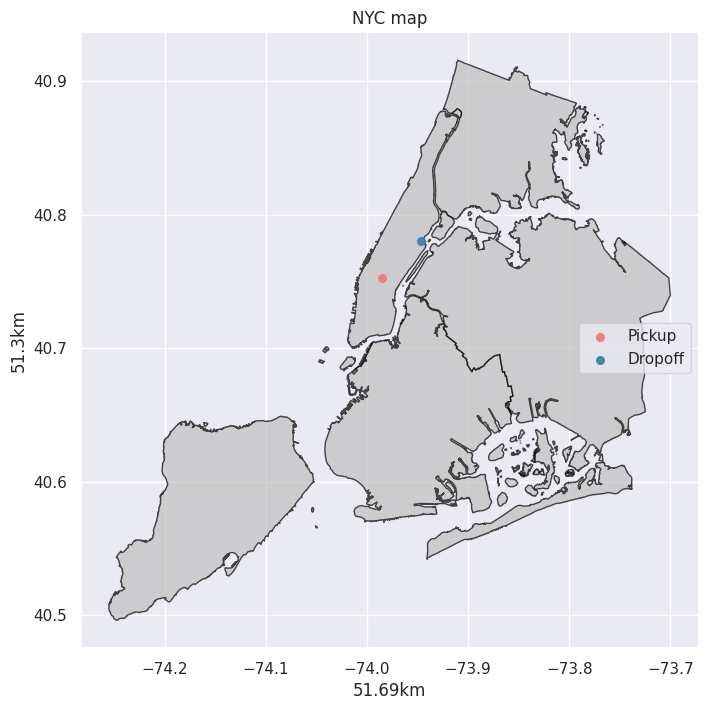

In [ ]:
# Plotting the pickup and dropoff coordinates of the observation
plot_shapefile(shapef = nyc_sf, data = data[data.index == X_test.iloc[obs_].name], legend_ = True, scale_ = True)

*   **BIAS** is the expected average score of the model based on the distribution of the training dataset ([Refer](https://stackoverflow.com/questions/49402701/eli5-explaining-prediction-xgboost-model)).
*   Among the features, for this particular observation, **distance** has the most contribution to the prediction, which is in the positive direction - as is expected for a positive correlation between distance and trip duration visualized in the **Data Visualization** section.
*   The pickup coordinates also have a significant positive effect on the prediction. As can be seen in the map, the coordinates are within the **Manhattan borough** of NYC, which has earned its fame for the heavy traffic, hence increasing the trip duration.
*   Among the negative predictors, there's day of the week and hour of the day - which for the particular observation are **Wednesday** (represented by 2) and **midnight** respectively. The traffic is significantly less during both these times, especially when they are combined together (i.e., Wednesday midnight). Hence, their negative contribution to trip duration.


## **8.** **Future Work (Optional)**

### 1. Save the best performing ml model in a pickle file or joblib file format for deployment process.


*   The model pickle file has been saved in a pickle along with the train and test predictions and scores in the model implementation section. This same pickle file will be read in the next section.

*   Due to lack of availability of unseen data at the moment, the outliers very close to the maximum value of trip duration has been chosen as the "unseen" data. Due to their proximity to the actual range of train dataset, the errors in prediction should not be high.

*   Also, since the number of observations present in the unseen dataset is very small, no prediction scores are evaluated except the RMSE score, since it wouldn't make much sense.

### 2. Again Load the saved model file and try to predict unseen data for a sanity check.


In [ ]:
# Loading unseen cleaned data
dfp = pd.read_csv(path_misc + 'unseen_cleaned_data.csv', index_col = 0)[10:20]

X_unseen = dfp.drop('trip_duration', axis = 1)
Y_unseen = dfp['trip_duration']

X_unseen_scaled = scaler.transform(X_unseen)

# Reading the XGBoost model from a pickle file
with open(path_misc + 'xgb_outputs.pkl', 'rb') as f:
  xgb_outputs = pickle.load(f)

xgb_model = xgb_outputs['Model']

# Prediction using XGBoost model
Y_unseen_preds = xgb_model.predict(X_unseen_scaled)

[05:53:55] WARNING: ../src/learner.cc:553: 
  If you are loading a serialized model (like pickle in Python, RDS in R) generated by
  older XGBoost, please export the model by calling `Booster.save_model` from that version
  first, then load it back in current version. See:

    https://xgboost.readthedocs.io/en/latest/tutorials/saving_model.html

  for more details about differences between saving model and serializing.



In [ ]:
print(f'RMSE: {mean_squared_error(Y_unseen, Y_unseen_preds)}\n')
pd.concat((pd.DataFrame(Y_unseen_preds), Y_unseen.reset_index(drop = True)), axis = 1).rename(columns = {0: 'Predicted', 'trip_duration': 'True'})

RMSE: 31.964204378656312



,Predicted,True
0,42.761478,45.793013
1,43.412628,45.803930
2,41.730900,45.716518
3,39.508358,45.814845
4,40.581974,45.760245
5,40.384556,45.793013
6,43.310703,45.727453
7,36.002567,45.749317
8,38.895504,45.803930
9,39.093571,45.760245


An RMSE of ~32 is quite a reasonable value, considering the dataset chosen as "unseen" is from the outlier region near the maximum chosen value of trip duration. Also, it is close to the linear model train RMSE score.

### ***Congrats! Your model is successfully created and ready for deployment on a live server for a real user interaction !!!***

# **Conclusion**

Some of the conclusions from the project are:
*   On feature relevance:
  *   The features which were in datetime format themselves are not useful, and necessary temporal variables need to be extracted from them for valuable information of the rides.
  *   Several redundant features were dropped. Few others like **passenger_count**, **store_and_fwd_flag**, and **holiday** (the latter being a newly created feature) and their combinations to be included in the input dataset were subjected to iterations. The former two were hypothesised (based on sound logical reasoning) to have no significant effect on **trip_duration**, while additionally, **store_and_fwd_flag** also had a very high class imbalance.
  *   Due to lack of a logical reasoning to conclude any irrelevance of **vendor_id**, the feature was retained and was checked for feature importance post model implementation.
*   On handling outliers:
  *   The values of **trip_duration** were themselves having large amount of outliers, most of them impossibly high even when the pickup and dropoff points were within NYC. Hence, the feature outliers were trimmed off for the values to be contained within a specific set of reasonable values.
  *   There were many **pickup and dropoff locations which were very far from the NYC**. Since the project is of predicting taxi trip duration within NYC, it makes sense to contain the pickup and dropoff locations too within (and in near proximity of) NYC.
*   Regarding feature pre-processing:
  *   The continuous variables **distance** and **trip_duration** had a moderate right-skew in their distribution. In order to improve predicting power of regression models, they were transformed to resemble a normal distribution to ensure normalcy of its residues.

*   On regression model implementation:
  *   On implementing the regression models, the **XGBoost** was found to have the best regression scores of train and test **R<sup>2</sup>** and **RMSE**. Even **Stacking** of the best 2 models - **XGBoost** and **LightGBM** did not provide better results.
  *   XGBoost ranked 2nd in model implementation time, after the stacking algorithm.
*   With regards to input dataset iteration, as hypothesised - the input dataset which dropped **passenger_count** and **store_and_fwd_flag** and included **holiday** performed the best out of all the other combinations of inclusion.
*   **distance** was computed by **XGBoost** to be the most important predictor of **trip_duration** followed by **hour_of_day**, **day_of_week** and **holiday**. **vebdor_id** had the least effect on **trip_duration**

*As a final note, thank you for joining me on this journey of exploring prediction of taxi trip duration within Newyork City. It was a pleasure to share this experience with you! Kindly reach out to me in case of any queries*